In [18]:
from functools import partial 
from collections import defaultdict 
from mpl_toolkits.mplot3d import axes3d #Used for the 3d bifurcation plot
from matplotlib.ticker import MultipleLocator
from lmfit import minimize, Parameters, Parameter, report_fit
from math import pow
from datetime import datetime

from scipy.stats import kde
from scipy.integrate import odeint
from scipy.optimize import fsolve 
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.optimize import basinhopping
from scipy.optimize import Bounds

from pymcmcstat.MCMC import MCMC
from pymcmcstat.plotting import MCMCPlotting
from pymcmcstat.ParallelMCMC import ParallelMCMC
from pymcmcstat.chain import ChainProcessing as CP
from pymcmcstat.chain import ChainStatistics as CS
from pymcmcstat import mcmcplot as mcp

import numpy as np # Numerical computing library
import matplotlib.pyplot as plt # Plotting library
import scipy.integrate #Integration library
import matplotlib.patches as mpatches #used to write custom legends
import math
import os
import sys
import glob
import matplotlib
import numpy as np
import pandas as pd
import xlrd
import matplotlib as mpl
import scipy.io as sio
import pymcmcstat
import scipy
import seaborn as sns
import statistics
import scipy.stats as st
import pymc3

%matplotlib inline
%precision 4

plt.style.use('ggplot')

mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

np.seterr(over='ignore');

#Austria
#https://covid19-dashboard.ages.at/dashboard_Hosp.html
#Prevalence
#https://www.sora.at/nc/news-presse/news/news-einzelansicht/news/covid-19-praevalenz-1006.html
#http://www.statistik.at/web_de/presse/123051.html

Data: https://www.socialstyrelsen.se/globalassets/1-globalt/covid-19-statistik/engelska-sidan/faktablad-vardforlopp-covid-eng.pdf

https://www.folkhalsomyndigheten.se/smittskydd-beredskap/utbrott/aktuella-utbrott/covid-19/statistik-och-analyser/bekraftade-fall-i-sverige/

https://portal.icuregswe.org/siri/report/corona.covid-dagligen

https://www.socialstyrelsen.se/statistik-och-data/statistik/statistik-om-covid-19/statistik-om-slutenvard-av-patienter-med-covid-19/

Information about entrance hospital: https://www.socialstyrelsen.se/statistik-och-data/statistik/statistik-om-covid-19/sammanfattande-statistik-over-tid/

Information about length of stay

<Figure size 1200x1200 with 0 Axes>

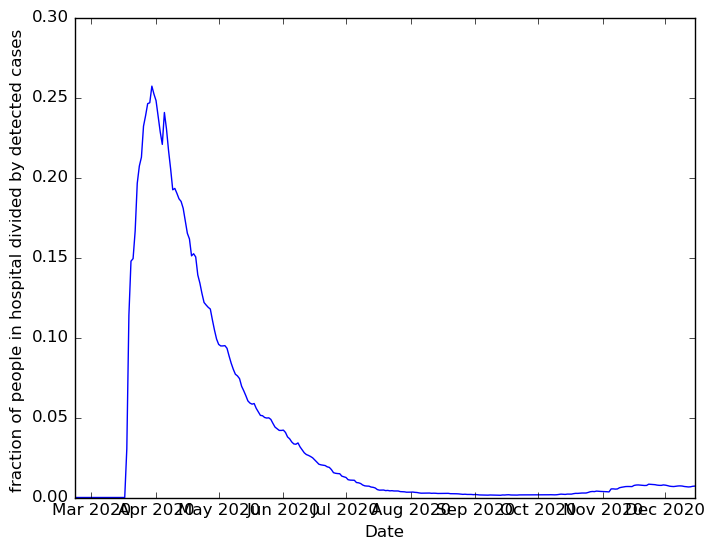

In [19]:
df=pd.read_excel('Data_Sweden.xlsx',header=0,
index_col=False)
df.head()

df['date']
plt.figure(figsize=(15, 15))
plt.figure(facecolor="white")
plt.xlabel('Date')
plt.ylabel('fraction of people in hospital divided by detected cases ')
plt.plot(df['date'],df['COVIDsoinsnormaux']/df['new_cases_cum'])

NumberDaysData = len(df['date'])


In [20]:
df['date']

0     2020-02-16
1     2020-02-17
2     2020-02-18
3     2020-02-19
4     2020-02-20
         ...    
299   2020-12-11
300   2020-12-12
301   2020-12-13
302   2020-12-14
303   2020-12-15
Name: date, Length: 304, dtype: datetime64[ns]

In [21]:
# Define Function To Compute the Seven Days Moving Average

def ComputeSevenDaysMovingAverage(InputRawData):

    WeeklyAveragedData = [
        InputRawData[0]/1,
        sum(InputRawData[0:2])/3,
        sum(InputRawData[0:4])/5]
    
    Final = len(InputRawData)
    for i in np.arange(3,Final-3,1):
        WeeklyAveragedData.append(sum(InputRawData[i-3:i+3+1])/7)
        
    WeeklyAveragedData.append(sum(InputRawData[Final-5::])/5)
    WeeklyAveragedData.append(sum(InputRawData[Final-3::])/3)
    WeeklyAveragedData.append(InputRawData[Final-1]/1)
    
    WeeklyAveragedData = np.array(WeeklyAveragedData)
    
    return WeeklyAveragedData

In [22]:
# Some Plotting Variables shared by all Plots

#NumberDaysData = len(df['date'])
LenghtOfForecast = 136 # 60 # This hold for all plots: by how many days you wish to show simulation, after end of data?
endofplot = NumberDaysData + LenghtOfForecast

MyListOfDates = ['16 February']
for Day in np.arange(17,30,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
MyListOfDates=np.array(MyListOfDates)

#only10thindex=np.arange(0,endofplot+1,15)
only10thindex=np.arange(0,endofplot+1,30)
times=np.arange(0,endofplot+1,1)

plt.style.use('ggplot')
mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

FileFormatOfFigures = '.pdf' # Could be also '.pdf'

In [23]:
##############################################
####    LET'S DEFINE A FUNCTION FOR p1    ####
##############################################

0.05280417034877514
612266.4835901258


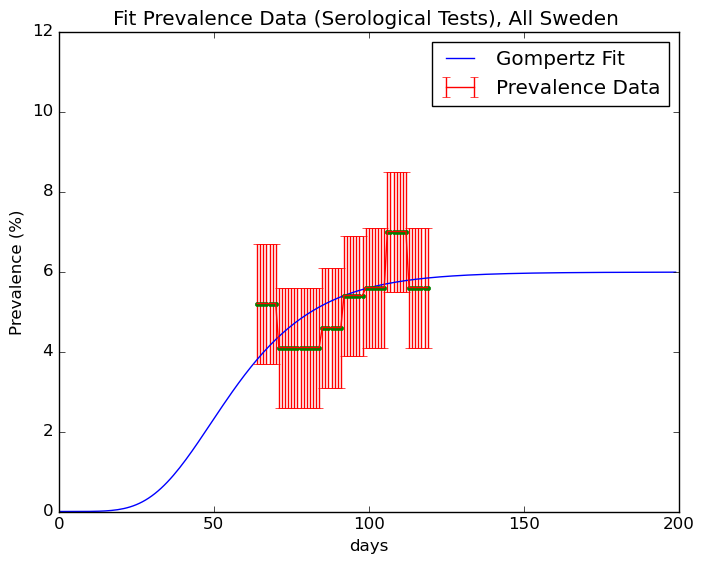

In [24]:
########################################################################################################################
### SEROLOGICAL STUDIES SHOW VERY DIFFERENT VALUES THAN FORMULA FROM Böhninga et al. (2020), SO WE USE THOSE INSTEAD ###
########################################################################################################################

xData = np.array([64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,
                 79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,
                  100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119])
yData = np.array([ 5.20,5.20,5.20,5.20,5.20,5.20,5.20,
                     4.10,4.10,4.10,4.10,4.10,4.10,4.10,
                     4.10,4.10,4.10,4.10,4.10,4.10,4.10,
                     4.60,4.60,4.60,4.60,4.60,4.60,4.60,
                     5.40,5.40,5.40,5.40,5.40,5.40,5.40,
                     5.60,5.60,5.60,5.60,5.60,5.60,5.60,
                     7,7,7,7,7,7,7,
                     5.60,5.60,5.60,5.60,5.60,5.60,5.60])

PopulationOfSweden = 10230000
N = PopulationOfSweden

def GompertzCurve(t, r, PI):
    # https://en.wikipedia.org/wiki/Gompertz_function
    P0 = 1
    P = (P0 * np.exp(np.log(PI/P0)*(1-np.exp(-r*t))))/N*100
    return P

fittedParametersGomp, pcov = curve_fit(GompertzCurve, xData, yData, [0.1,0.1*N], bounds=(np.array([0,0]),np.array([np.inf,N])))

plt.figure(facecolor="white")

plt.plot(GompertzCurve(np.arange(0,200,1),fittedParametersGomp[0],fittedParametersGomp[1]), label='Gompertz Fit')
plt.plot(xData,yData,'.')
yerr=1.5*np.ones(7*8)

plt.errorbar(xData, yData, yerr=yerr, label='Prevalence Data')
plt.ylim(0,12)
plt.xlim(0,200)

plt.legend()
plt.title("Fit Prevalence Data (Serological Tests), All Sweden ")
plt.xlabel('days') 
plt.ylabel('Prevalence (%)') 

print(fittedParametersGomp[0])
print(fittedParametersGomp[1])


3871.7367889353823
177696.08399121737


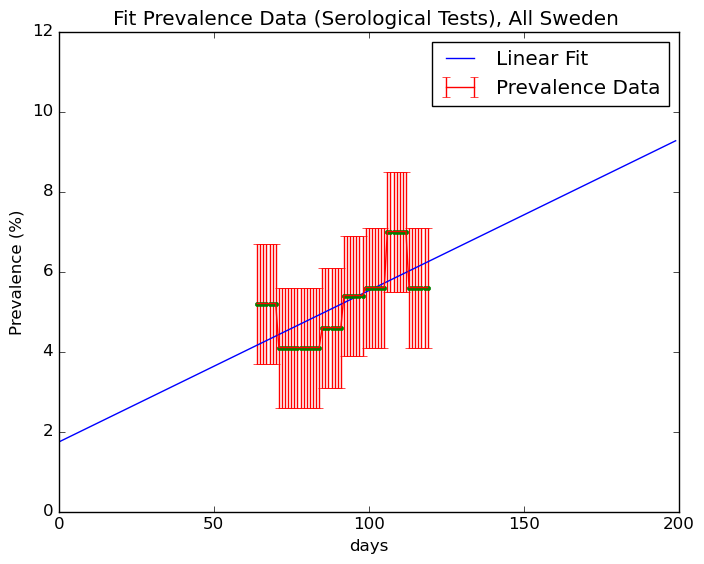

In [25]:
def StreightLine(t, r, P0):
    # https://en.wikipedia.org/wiki/Gompertz_function
    P = ( r * t + P0 ) / N*100
    return P

fittedParameters, pcov = curve_fit(StreightLine, xData, yData, [0.1,1], bounds=(np.array([0,1]),np.array([np.inf,N])), sigma = yerr)#, method='dogbox')

plt.figure(facecolor="white")

plt.plot(StreightLine(np.arange(0,200,1),fittedParameters[0],fittedParameters[1]),label='Linear Fit')
plt.plot(xData,yData,'.')
yerr=1.5*np.ones(7*8)

plt.errorbar(xData, yData, yerr=yerr, label='Prevalence Data')

plt.legend()
plt.title("Fit Prevalence Data (Serological Tests), All Sweden ")
plt.xlabel('days') 
plt.ylabel('Prevalence (%)') 

plt.ylim(0,12)
plt.xlim(0,200)

print(fittedParameters[0])
print(fittedParameters[1])

92.66372434534959
266310.81390973


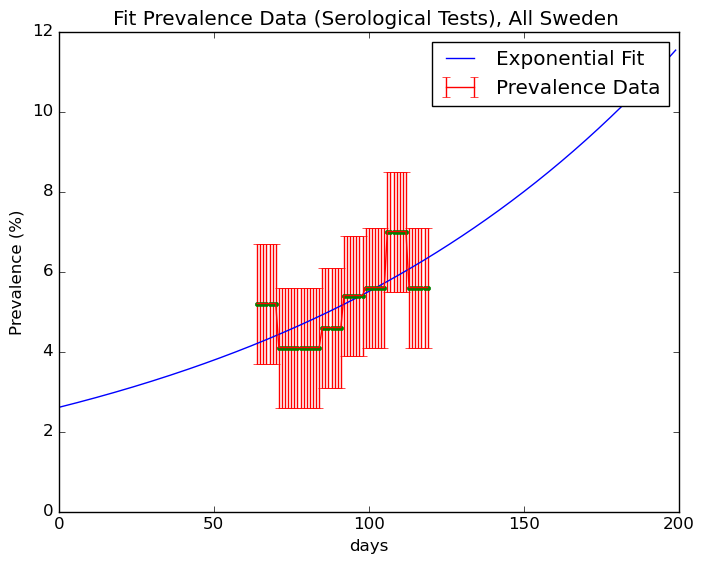

In [26]:
def ExponentialGrowthBase2(t, Tau2, P0):
    P = P0*2**(t/Tau2) / N * 100
    return P

fittedParametersExpo, pcov = curve_fit(ExponentialGrowthBase2, xData, yData, [2,1], bounds=(np.array([0,1]),np.array([np.inf,N])), sigma = yerr)#, method='dogbox')

plt.figure(facecolor="white")

plt.plot(ExponentialGrowthBase2(np.arange(0,200,1),fittedParametersExpo[0],fittedParametersExpo[1]),label='Exponential Fit')
plt.plot(xData,yData,'.')
yerr=1.5*np.ones(7*8)

plt.errorbar(xData, yData, yerr=yerr, label='Prevalence Data')

plt.legend()
plt.title("Fit Prevalence Data (Serological Tests), All Sweden ")
plt.xlabel('days') 
plt.ylabel('Prevalence (%)') 

plt.ylim(0,12)
plt.xlim(0,200)

print(fittedParametersExpo[0])
print(fittedParametersExpo[1])

Results_Sweden folder already exists.
92.66372434534959
266310.81390973


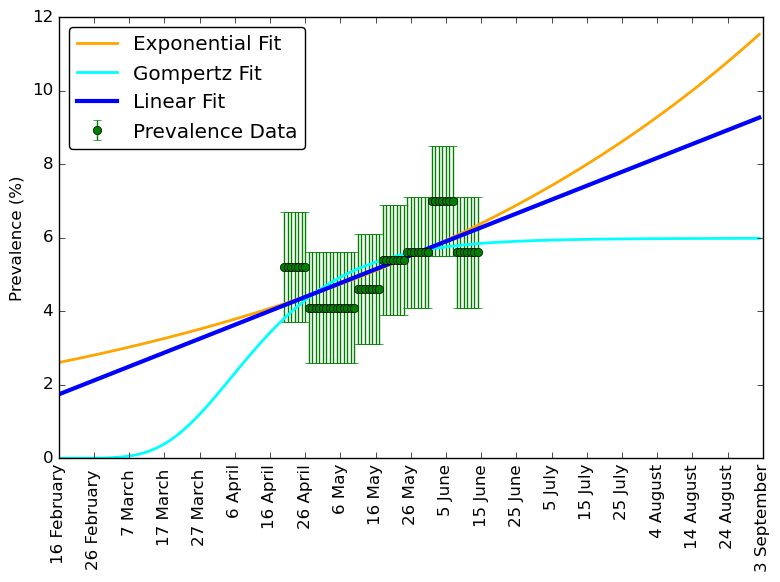

In [27]:
plt.figure(facecolor="white",figsize=(8,6))

My_yerr=1.5*np.ones(7*8)
plt.errorbar(xData, yData, fmt='o', yerr=My_yerr,markerfacecolor = 'green',color='green', label='Prevalence Data')

plt.plot(ExponentialGrowthBase2(np.arange(0,200,1),fittedParametersExpo[0],fittedParametersExpo[1]),label='Exponential Fit',color='orange',lw=2)
plt.plot(GompertzCurve(np.arange(0,200,1),fittedParametersGomp[0],fittedParametersGomp[1]), label='Gompertz Fit',color='cyan',lw=2)
plt.plot(StreightLine(np.arange(0,200,1),fittedParameters[0],fittedParameters[1]),label='Linear Fit',color='blue',lw=3)

plt.legend(loc='best', fancybox=True, numpoints=1)
#plt.title("Fit Prevalence Data (Serological Tests), All Sweden ")
#plt.xlabel('Time') 
plt.ylabel('Prevalence (%)') 
only10thindex1=np.arange(0,250,10)

times1 = np.arange(0,250,1)
plt.xticks(times1[only10thindex1], MyListOfDates[only10thindex1], rotation=90)

plt.ylim(0,12)
plt.xlim(0,200)
plt.tight_layout()

MYDIR = ("Results_Sweden")
CHECK_FOLDER = os.path.isdir(MYDIR)
# If folder doesn't exist, then create it.
if not CHECK_FOLDER:
    os.makedirs(MYDIR)
    print("created folder : ", MYDIR)
else:
    print(MYDIR, "folder already exists.")

plt.savefig('./Results_Sweden/FitSerologicalDataPrevalence_Sweden'+ FileFormatOfFigures)

print(fittedParametersExpo[0])
print(fittedParametersExpo[1])

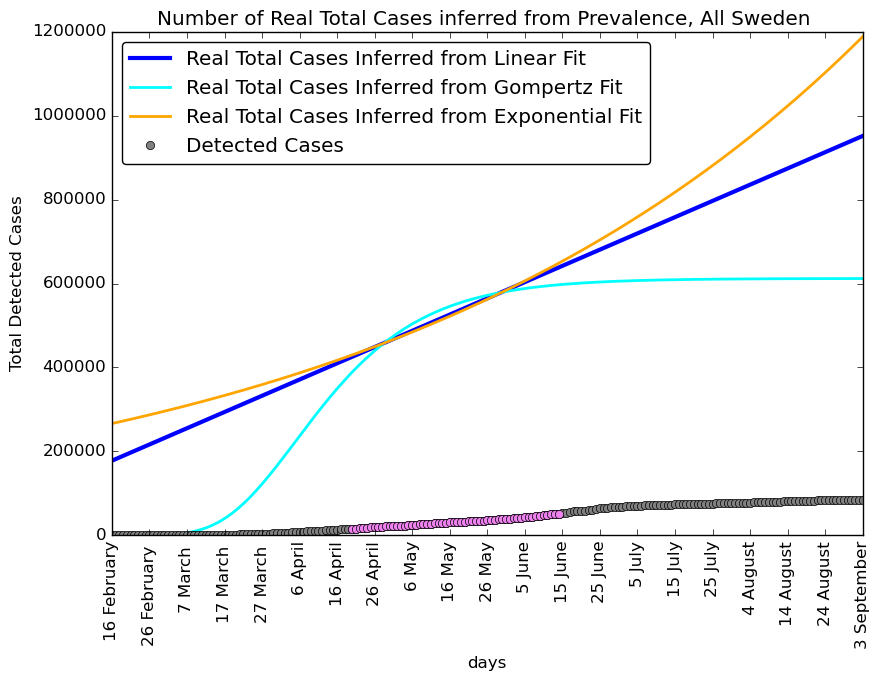

In [28]:
plt.figure(facecolor="white",figsize=(9,7))

RealCasesInferredFromPrevalence = StreightLine(times1,fittedParameters[0],fittedParameters[1])*N/100
plt.plot(times1, RealCasesInferredFromPrevalence, label='Real Total Cases Inferred from Linear Fit',color='blue',lw=3)

Gomp = GompertzCurve(times1,fittedParametersGomp[0],fittedParametersGomp[1])*N/100
plt.plot(times1, Gomp, label='Real Total Cases Inferred from Gompertz Fit',color='cyan',lw=2)

RealCasesInferredFromExpo = ExponentialGrowthBase2(times1,fittedParametersExpo[0],fittedParametersExpo[1])*N/100
plt.plot(times1, RealCasesInferredFromExpo, label='Real Total Cases Inferred from Exponential Fit',color='orange',lw=2)

plt.plot(df['new_cases_cum'],'o',label='Detected Cases',color='gray')
plt.plot(df['new_cases_cum'][xData],'o',color='violet')

only10thindex1=np.arange(0,250,10)
#temp=np.arange(0,endofplot+1,1)
plt.xticks(times1[only10thindex1], MyListOfDates[only10thindex1], rotation=90)
plt.title("Number of Real Total Cases inferred from Prevalence, All Sweden ")
plt.xlabel('days') 
plt.ylabel('Total Detected Cases') 
plt.xlim(0,200) 
plt.ylim(0,1200000)

plt.tight_layout()
plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.savefig('./Results_Sweden/TotCasesInferredPrevalence_Sweden'+ FileFormatOfFigures)


In [29]:
def ComputeNewDailyCasesFromCumulative(CumulativeCases):
    ListNewDailyCases = [CumulativeCases[0]]
    for i in np.arange(1,len(CumulativeCases),1):
        NewCases = CumulativeCases[i]-CumulativeCases[i-1]
        ListNewDailyCases.append(NewCases)
    return ListNewDailyCases

In [30]:
RealCasesInferredFromPrevalence = StreightLine(times1,fittedParameters[0],fittedParameters[1])*N/100
RealCasesInferredFromPrevalencedailylin=ComputeNewDailyCasesFromCumulative(RealCasesInferredFromPrevalence)

Gomp = GompertzCurve(times1,fittedParametersGomp[0],fittedParametersGomp[1])*N/100
Gompdaily=ComputeNewDailyCasesFromCumulative(Gomp)

RealCasesInferredFromExpo = ExponentialGrowthBase2(times1,fittedParametersExpo[0],fittedParametersExpo[1])*N/100
#print(RealCasesInferredFromExpo)
RealCasesInferredFromExpodaily=ComputeNewDailyCasesFromCumulative(RealCasesInferredFromExpo)
#print(RealCasesInferredFromExpodaily)

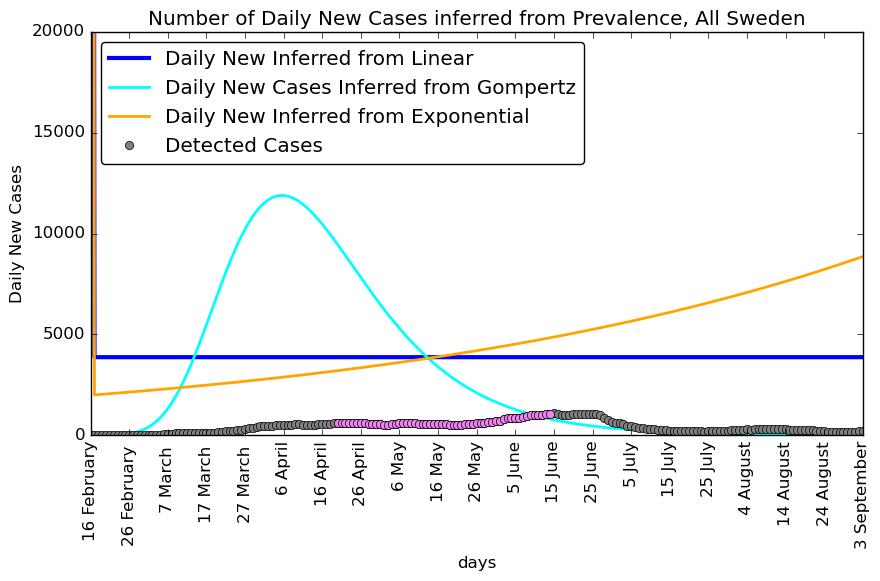

In [31]:
DI1=df['new_cases']
SevenDaysMovingAverage_DailyCases = ComputeSevenDaysMovingAverage(DI1)

times1 = np.arange(0,250,1)

plt.figure(facecolor="white",figsize=(9,6))

plt.plot(times1, RealCasesInferredFromPrevalencedailylin, label='Daily New Inferred from Linear',color='blue',lw=3)
plt.plot(times1, Gompdaily, label='Daily New Cases Inferred from Gompertz',color='cyan',lw=2)
plt.plot(times1, RealCasesInferredFromExpodaily, label='Daily New Inferred from Exponential',color='orange',lw=2)

plt.plot(SevenDaysMovingAverage_DailyCases,'o',label='Detected Cases',color = 'gray')
plt.plot(xData,SevenDaysMovingAverage_DailyCases[xData],'o',color='violet')

plt.legend()
plt.title("Number of Daily New Cases inferred from Prevalence, All Sweden")
only10thindex1=np.arange(0,250,10)
#temp=np.arange(0,endofplot+1,1)
plt.xticks(times1[only10thindex1], MyListOfDates[only10thindex1], rotation=90)
plt.xlabel('days') 
plt.ylabel('Daily New Cases') 

plt.xlim(0,200) 
plt.ylim(0,20000)

plt.tight_layout()
plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.savefig('./Results_Sweden/DailyCasesInferredPrevalence_Sweden'+ FileFormatOfFigures)

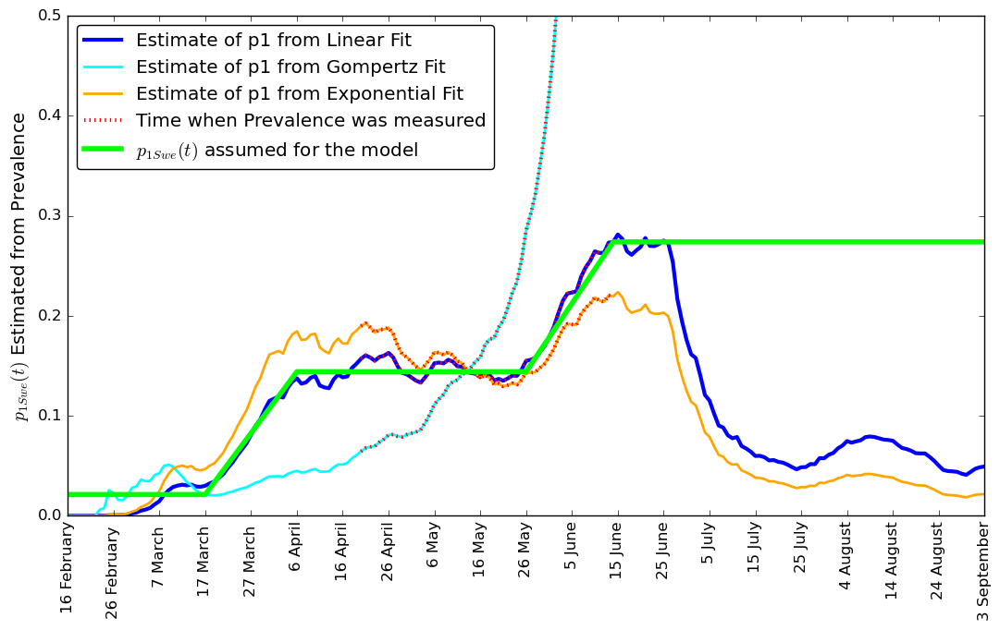

In [32]:
t_initial = 30 
t_middle_1 = 50
t_middle_2 = 100
t_final = xData[-1]
Ratio = SevenDaysMovingAverage_DailyCases[times1]/np.array(Gompdaily)[times1]
p1_Initial = Ratio[t_initial] # 0.15 #df['new_cases_cum'][xData[0]]/RealCasesInferredFromPrevalence[xData[0]]
Ratio = SevenDaysMovingAverage_DailyCases[times1]/np.array(RealCasesInferredFromPrevalencedailylin)[times1]
p1_Final = Ratio[t_final]
p1_middle = statistics.mean(Ratio[t_middle_1:t_middle_2])

def p1_of_scalar_t(t):
    if t < t_initial:
         p1 = p1_Initial
    elif t >= t_initial and t < t_middle_1:
        p1 = p1_Initial + (p1_middle-p1_Initial) * (t-t_initial)/(t_middle_1-t_initial) 
    elif t >= t_middle_1 and t < t_middle_2:
        p1 = p1_middle
    elif t >= t_middle_2 and t < t_final:
        p1 = p1_middle + (p1_Final-p1_middle) * (t-t_middle_2)/(t_final-t_middle_2) 
    elif t >= t_final:
        p1 = p1_Final
    return p1
    
def p1_Sweden(timesList):
    
    #t_initial = 99#93 # May 18th = 1st day of week where we see regime change in NumTests(t)
    #t_final = 118#112
    
    #Grompertz
    #t_initial = 75
    
    
    #Ratio = SevenDaysMovingAverage_DailyCases[times1]/np.array(RealCasesInferredFromPrevalencedailylin)[times1]
    
    #p1_Initial = statistics.mean(Ratio[0:t_initial-xData[0]]) # 0.15 #df['new_cases_cum'][xData[0]]/RealCasesInferredFromPrevalence[xData[0]]
    #p1_Final = statistics.mean(Ratio[t_final-xData[0]:-1]) # 0.25 #df['new_cases_cum'][xData[-1]]/RealCasesInferredFromPrevalence[xData[-1]]
    
    

        
        #a=(p1_Final-p1_Initial)/t_final**2
        #if t< t_final:
        #    p1=a*t**2+p1_Initial
        #elif t >= t_final:
        #    p1 = p1_Final    
        #return p1
    
    if np.isscalar(timesList):
        p1_List = p1_of_scalar_t(timesList)
    elif not(np.isscalar(timesList)):
        p1_List = []
        for t in timesList:
            p1 = p1_of_scalar_t(t)
            p1_List.append(p1)
        
    return p1_List
 
plt.figure(facecolor="white",figsize=(11, 7))

plt.plot(times1, SevenDaysMovingAverage_DailyCases[times1]/RealCasesInferredFromPrevalencedailylin, label='Estimate of p1 from Linear Fit',color='blue',lw=3)
plt.plot(times1, SevenDaysMovingAverage_DailyCases[times1]/Gompdaily, label='Estimate of p1 from Gompertz Fit',color='cyan',lw=2)
plt.plot(times1, SevenDaysMovingAverage_DailyCases[times1]/RealCasesInferredFromExpodaily, label='Estimate of p1 from Exponential Fit',color='orange',lw=2)

plt.plot(xData, SevenDaysMovingAverage_DailyCases[xData]/np.array(RealCasesInferredFromPrevalencedailylin)[xData],'r:',lw=3)#, label='Time when Prevalence was measured')
plt.plot(xData, SevenDaysMovingAverage_DailyCases[xData]/np.array(Gompdaily)[xData],'r:',lw=3)#, label='Time when Prevalence was measured')
plt.plot(xData, SevenDaysMovingAverage_DailyCases[xData]/np.array(RealCasesInferredFromExpodaily)[xData],'r:', label='Time when Prevalence was measured',lw=3)

plt.plot(times1, p1_Sweden(times1),'-',color='lime', linewidth='4', label=r'$p_{1Swe}(t)$ assumed for the model')

only10thindex1=np.arange(0,250,10)
#temp=np.arange(0,endofplot+1,1)
plt.xticks(times1[only10thindex1], MyListOfDates[only10thindex1], rotation=90)

#plt.legend(loc='upper right')
#plt.legend(loc='best')
#plt.title("Sweden")
#plt.xlabel('Time') 
plt.ylabel(r'$p_{1Swe}(t)$ Estimated from Prevalence',size=14) 

plt.ylim(0,0.5)
plt.xlim(0,200)

plt.tight_layout()
plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.savefig('./Results_Sweden/P1_InferredFromPrevalence_Sweden'+ FileFormatOfFigures)

In [33]:
print(p1_Sweden(0)) # min p1
print(p1_Sweden(1000)) # max p1

0.021106588121684814
0.2738896338353952


In [34]:
##############################################
####  NOW LET'S DEFINE A FUNCTION FOR p2  ####
##############################################

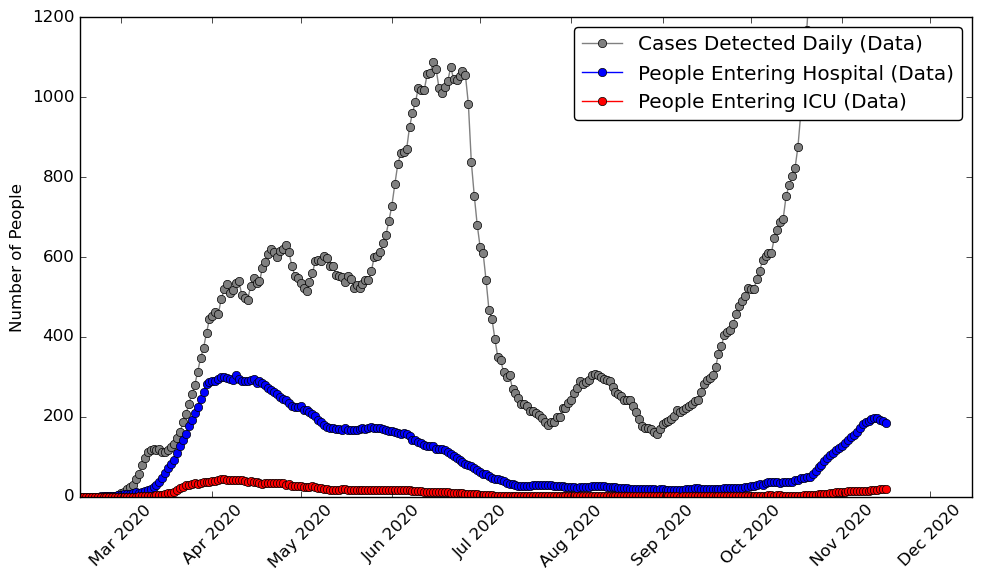

In [35]:
newdaily=ComputeSevenDaysMovingAverage(df['new_cases'])
hos_entrance=ComputeSevenDaysMovingAverage(df['entrance_hos'])
icu_entrance=ComputeSevenDaysMovingAverage(df['enterance_icu'])

plt.figure(figsize=(10,6),facecolor="white")
plt.xticks(rotation=45)
#plt.xlabel('Time')
plt.ylabel('Number of People')
#plt.title('Sweden')

plt.plot(df['date'],newdaily,'-o',label='Cases Detected Daily (Data)',color = 'gray')
plt.plot(df['date'],hos_entrance,'-o',label='People Entering Hospital (Data)',color = 'blue')
plt.plot(df['date'],icu_entrance,'-o',label='People Entering ICU (Data)',color = 'red')

plt.ylim(0,1200)

plt.tight_layout()
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.savefig('./Results_Sweden/PeopleEnteringHospitalsAndDailyCases_Sweden'+ FileFormatOfFigures)

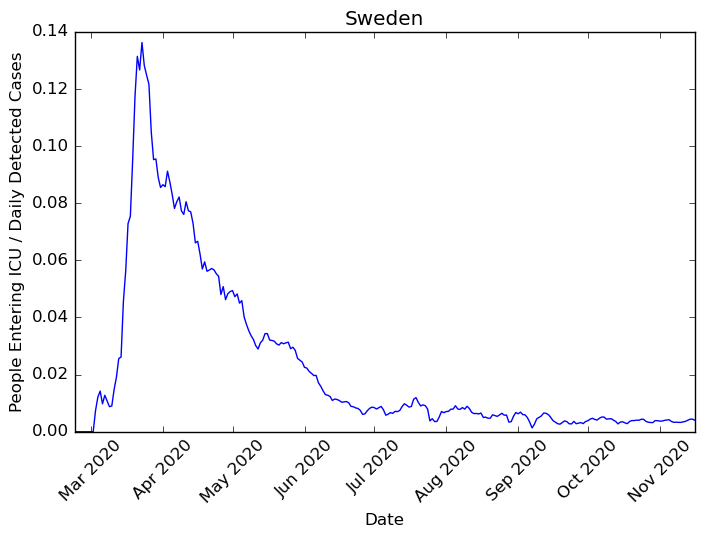

In [36]:
plt.figure(figsize=(8,5),facecolor="white")
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('People Entering ICU / Daily Detected Cases')
plt.title('Sweden')

plt.plot(df['date'],icu_entrance/newdaily)

(0.0000, 0.2000)

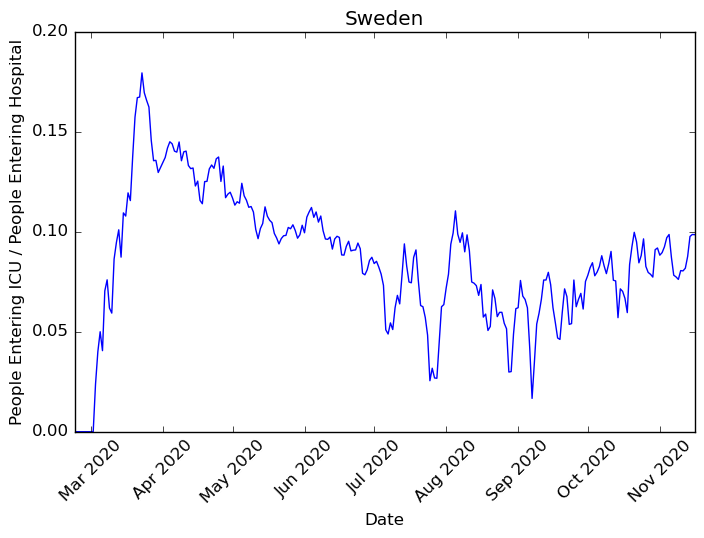

In [37]:
plt.figure(figsize=(8,5),facecolor="white")
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('People Entering ICU / People Entering Hospital')
plt.title('Sweden')

plt.plot(df['date'][0:277],icu_entrance[0:277]/hos_entrance[0:277])
plt.ylim(0,0.2)

### BECAUSE OF THIS PLOT, WE SEE DECIDE TO START BY ASSUMING p3 = CONSTANT = 0.9 (i.e. 10% of hospitalized go to ICU)

(0.0000, 0.3000)

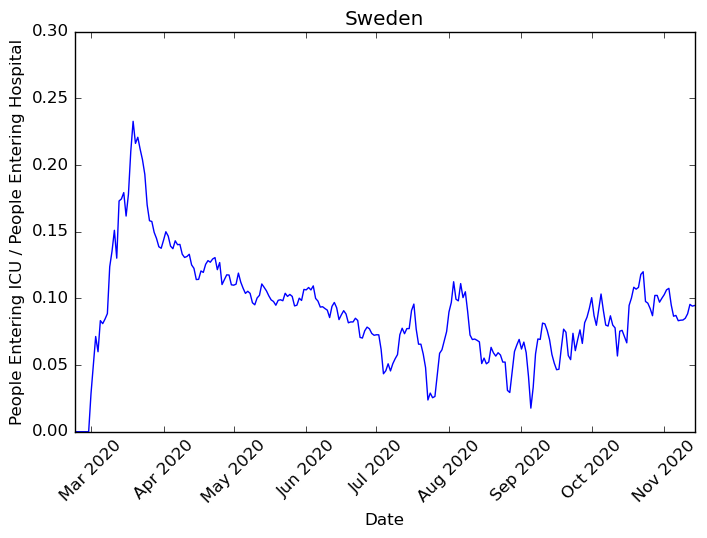

In [38]:
plt.figure(figsize=(8,5),facecolor="white")
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('People Entering ICU / People Entering Hospital')
plt.title('Sweden')

plt.plot(df['date'][0:276],icu_entrance[0+2:276+2]/hos_entrance[0:276])
plt.ylim(0,0.3)

### BECAUSE OF THIS PLOT, WE SEE DECIDE TO START BY ASSUMING p3 = CONSTANT = 0.9 (i.e. 10% of hospitalized go to ICU)

(0.0000, 1.0000)

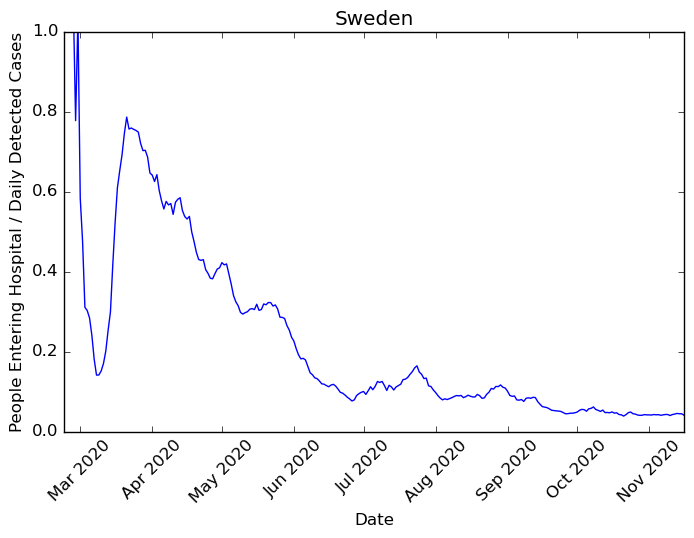

In [39]:
plt.figure(figsize=(8,5),facecolor="white")
plt.xticks(rotation=45)
plt.xlabel('Date')
plt.ylabel('People Entering Hospital / Daily Detected Cases')
plt.title('Sweden')

plt.plot(df['date'][0:277],(hos_entrance/newdaily)[0:277])
plt.ylim(0,1)

### BECAUSE OF THIS PLOT, WE DECIDE TO TAKE p2 = p2(t)

In [40]:
def auxiliary_function(t,p2max,p2min,t_initial,t_final):
    if t < t_initial:
        p2 = p2max
    elif t >= t_initial and t < t_final:
        p2 = p2min + (p2max-p2min) * (t_final-t)/(t_final-t_initial)
    elif t >= t_final:
        p2 = p2min
    return p2
    
def p2_Sweeden_1stWave(times,p2max,p2min): 

    t_initial=34
    t_final=120
  
    if np.isscalar(times):
        p2_List = auxiliary_function(times,p2max,p2min,t_initial,t_final)
    elif not(np.isscalar(times)):
        p2_List = []
        for t in times:
            p2 = auxiliary_function(t,p2max,p2min,t_initial,t_final)
            p2_List.append(p2)
        
    return p2_List


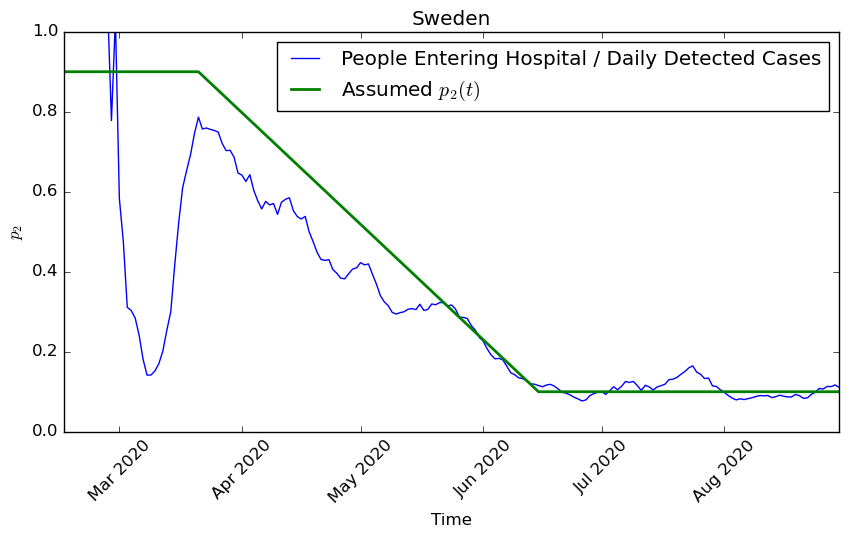

In [41]:
plt.figure(figsize=(10,5),facecolor="white")
plt.xticks(rotation=45)
plt.xlabel('Time')
plt.ylabel(r'$p_2$')
plt.title('Sweden')

plt.plot(df['date'][0:197],hos_entrance[0:197]/newdaily[0:197],label='People Entering Hospital / Daily Detected Cases')
plt.plot(df['date'][0:197],p2_Sweeden_1stWave(times[0:197],0.9,0.1),lw=2,label=r'Assumed $p_2(t)$')
plt.ylim(0,1)
plt.legend(loc='best')

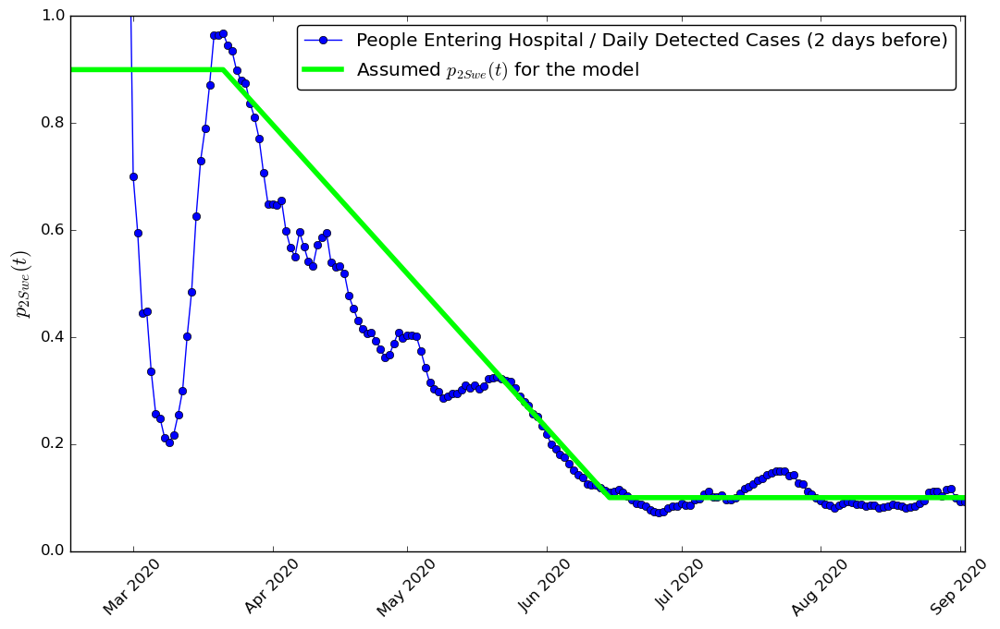

In [42]:
### PLOT WITH 2 DAYS (~ 1/theta_2) DELAY BETWEEN HOSPITALS AND DAILY

plt.figure(figsize=(11,7),facecolor="white")
plt.xticks(rotation=45)
#plt.xlabel('Date')
plt.ylabel(r'$p_{2Swe}(t)$',size=16)
#plt.title('Sweden')

plt.plot(df['date'][0:200],hos_entrance[0+2:200+2]/newdaily[0:200],'-o',label='People Entering Hospital / Daily Detected Cases (2 days before)')
plt.plot(df['date'][0:200],p2_Sweeden_1stWave(times[0:200],0.9,0.1),lw=4,color='lime',label=r'Assumed $p_{2Swe}(t)$ for the model')
plt.ylim(0,1)

plt.tight_layout()
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.savefig('./Results_Sweden/p2_EstimateFromDailyEntranceHospital_Sweden'+ FileFormatOfFigures)

In [43]:
#########################################
###   HERE WE START THE REAL MODEL    ###
#########################################

In [44]:
#Ode system
def ODE_system(rho, 
               alpha, beta, 
               p2_max, p2_min, 
               p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,
               tau4,#sur,tau4die,
               tau5,#sur,tau5die,
               tau6,#sur,tau6die,
               tau7,tau8,tau9,
               p2prim,
               p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,
               tau4prim,#surprim,tau4dieprim,
               tau5prim,#surprim,tau5dieprim,
               tau6prim,#surprim,tau6dieprim,
               tau7prim,tau8prim,tau9prim,
               v,t): 
    
    y=np.zeros((16))
      
    p1 = p1_Sweden(t)
    
    p2 = p2_Sweeden_1stWave(t,p2_max,p2_min)
    # p2 = 0.65
    # p2prim = p2
    
    y[0]=beta*(v[5]+v[3])*v[0]*-rho #S
    y[1]=rho*beta*v[0]*(v[5]+v[3]) - alpha*v[1]#E
    y[2]= tau5*v[8]*p5+tau6*v[10]*p6+p7*tau7*v[11]#R
    y[3]=alpha*p1*v[1]-tau1*v[3]#II
    y[4]= tau1*v[3]-v[4]*(1-p2)*tau2-p2*v[4]*tau2#Q
    y[5]=(1-p1)*alpha*v[1]-v[5]*tau8#NII
    y[6]=(1-p6)*v[10]*tau6+(1-p5)*v[8]*tau5+(1-p4)*tau4*v[9]#
    y[7]=p2*v[4]*tau2-p3*v[7]*tau3-(1-p3)*v[7]*tau3#H
    y[8]= p3*v[7]*tau3-p5*v[8]*tau5-(1-p5)*v[8]*tau5#Hl
    y[9]=(1-p3)*v[7]*tau3-tau4*v[9]*p4-(1-p4)*v[9]*tau4#ICU
    y[10]=tau4*v[9]*p4-v[10]*tau6*p6-v[10]*tau6*(1-p6)#AICU
    y[11]=v[4]*(1-p2)*tau2-tau7*(1-p7)*v[11]-p7*tau7*v[11]#NI
    y[12]=v[5]*tau8-tau9*(1-p9)*v[12]-p9*tau9*v[12]#NI1
    y[13]=p9*v[12]*tau9#R1
    y[14]=(1-p9)*tau9*v[12]#D1
    y[15]=(1-p7)*v[11]*tau7#
    
    if (t>=197): 
        y[0]=beta*(v[5]+v[3])*v[0]*-rho #S
        y[1]=rho*beta*v[0]*(v[5]+v[3]) - alpha*v[1]#E
        y[2]= tau5prim*v[8]*p5prim+tau6prim*v[10]*p6prim+p7prim*tau7prim*v[11]#R
        y[3]=alpha*p1*v[1]-tau1*v[3]#II
        y[4]= tau1*v[3]-v[4]*(1-p2prim)*tau2-p2prim*v[4]*tau2#Q
        y[5]=(1-p1)*alpha*v[1]-v[5]*tau8prim#NII
        y[6]=  (1-p6prim)*v[10]*tau6prim+(1-p5prim)*v[8]*tau5prim+(1-p4prim)*tau4prim*v[9]#
        y[7]=  p2prim*v[4]*tau2-p3prim*v[7]*tau3prim-(1-p3prim)*v[7]*tau3prim#H
        y[8]= p3prim*v[7]*tau3prim-p5prim*v[8]*tau5prim-(1-p5prim)*v[8]*tau5prim#Hl
        y[9]=  (1-p3prim)*v[7]*tau3prim-tau4prim*v[9]*p4prim-(1-p4prim)*v[9]*tau4prim#ICU
        y[10]=  tau4prim*v[9]*p4prim-v[10]*tau6prim*p6prim-v[10]*tau6prim*(1-p6prim)#AICU
        y[11]=v[4]*(1-p2prim)*tau2-tau7prim*(1-p7prim)*v[11]-p7prim*tau7prim*v[11]#NI
        y[12]=v[5]*tau8prim-tau9prim*(1-p9prim)*v[12]-p9prim*tau9prim*v[12]#NI1
        y[13]=p9prim*v[12]*tau9prim#R1
        y[14]=(1-p9prim)*tau9prim*v[12]#D1
        y[15]=(1-p7prim)*v[11]*tau7prim#
    return y

In [45]:
#different social interaction
def rhoAsFunctionforSweden(time,ListOfRhos):
    
    rho0 = ListOfRhos[0]
    rho1 = ListOfRhos[1]
    rho2 = ListOfRhos[2]
    rho3 = ListOfRhos[3]
    rho4 = ListOfRhos[4]
    rho5 = ListOfRhos[5]
    rho6 = ListOfRhos[6]
    rho7 = ListOfRhos[7]
    rho8 = ListOfRhos[8]
    rho9 = ListOfRhos[9]
    rho10 = ListOfRhos[10]
    rho11 = ListOfRhos[11]
    rho12 = ListOfRhos[12]
    rho13 = ListOfRhos[13]

    ListOfRhosOUTPUT = []
    for t in time:
        if (t<24):
            rho=1
        elif (t>=24)and (t<30):
            rho=rho1
        elif (t>=30)and (t<40):
            rho=rho2
        elif (t>=40)and (t<43):
            rho=rho3
        elif (t>=43)and (t<46):  
            rho=rho4
        elif (t>=46)and(t<115):
            rho=rho5
        elif (t>=115) and (t<118):
            rho=rho6
        elif(t>=118) and (t<136):
            rho=rho7
        elif(t>=136)and (t<183):
            rho=rho8
        elif(t>=183) and (t<228):
            rho=rho9
        elif(t>=228) and (t<254):
            rho=rho10  
        elif(t>=254) and (t<261):
            rho=rho11
        elif(t>=261)and (t<274):
            rho=rho12  
        elif(t>=274)and(t<NumberDaysData):
            rho=rho13           
        elif t >= NumberDaysData:
            if len(ListOfRhos) < 15:
                rho=rho13
            elif len(ListOfRhos) >= 15:
                rho=ListOfRhos[14]
            
        ListOfRhosOUTPUT.append(rho)
        
#        elif t >= NumberDaysData:
#            if len(ListOfRhos) < 15:
#                rho=rho13
#            elif len(ListOfRhos) == 15:
#                rho=ListOfRhos[14]
#            elif len(ListOfRhos) > 15:
#                #for i in np.arange(0,len(ListOfRhos[15])-15,1):
#                rho=ListOfRhos[t-NumberDaysData+14]
#        ListOfRhosOUTPUT.append(rho)
        
    return np.array(ListOfRhosOUTPUT)


In [46]:
rho1=0.52
rho2=0.3
rho3=0.25
rho4=0.2
rho5=0.277
rho6=0.265 
rho7=0.28 
rho8=0.23
rho9=0.37 
rho10=0.395
rho11=0.41
rho12=0.375
rho13=0.345

ListOfRhos=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13]
ListOfRhos_ManualFit_1stWave=ListOfRhos


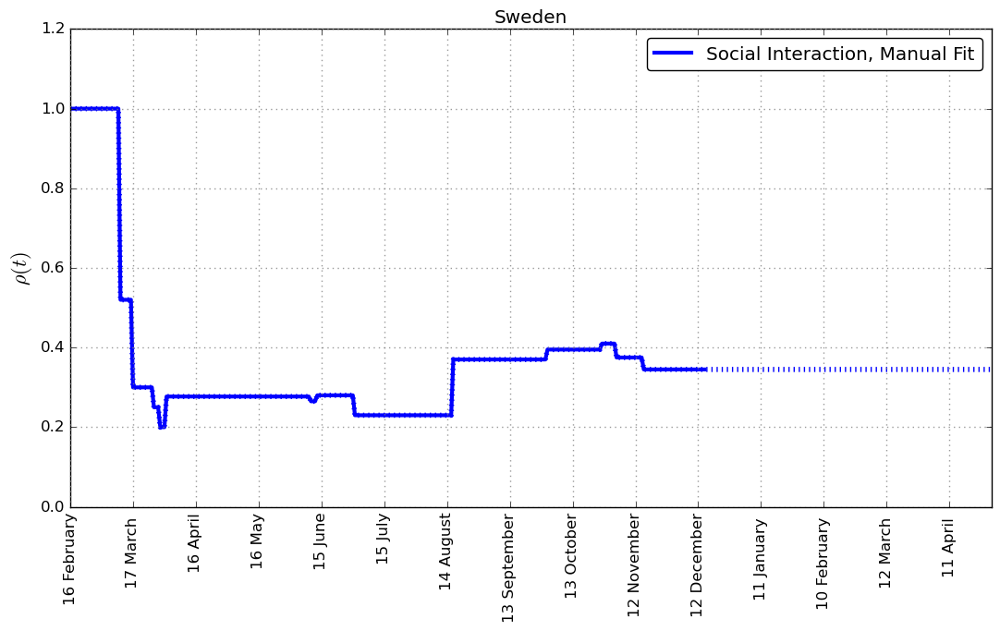

In [47]:
# Put here the values of rho coming from fits
plt.figure(facecolor="white",figsize=(11,7))
times=np.arange(0,endofplot+1,1)
plt.plot(times,rhoAsFunctionforSweden(times,ListOfRhos),':',color='blue',lw=4)
plt.plot(times[0:NumberDaysData],rhoAsFunctionforSweden(times[0:NumberDaysData],ListOfRhos),'-',color='blue',label='Social Interaction, Manual Fit',lw=3)
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
# plt.xlabel("Time")
plt.ylabel(r"$\rho(t) $",size=16)
plt.ylim(0,1.2)
plt.xlim(0,endofplot)
plt.title('Sweden')

plt.tight_layout()
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.savefig('./Results_Sweden/Rho_SEIR-ICU_Sweden'+ FileFormatOfFigures)

In [48]:
def model_SEIRICUHOS(v,t,ListOfRhos,ListOfParameters):
    
    #model system
    #S, E, R ,II ,Q, NII, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
    
    
    # This removes the delay, so this parameter is not playing a role anymore
    
    alpha=ListOfParameters[0] 
    beta=ListOfParameters[1]
    
    #p1=ListOfParameters[2]
    
    p2_max=ListOfParameters[2]
    p2_min=ListOfParameters[3]
    
    p3=ListOfParameters[4]
    p4=ListOfParameters[5]
    p5=ListOfParameters[6]
    p6=ListOfParameters[7]
    p7=ListOfParameters[8]
    p9=ListOfParameters[9]
    
    tau1 = ListOfParameters[10]
    tau2 = ListOfParameters[11]
    tau3 = ListOfParameters[12]
    tau4 = ListOfParameters[13] # sur
    
    tau5 = ListOfParameters[14] # sur
    
    tau6 = ListOfParameters[15] # sur
    
    tau7 = ListOfParameters[16]
    tau8 = ListOfParameters[17]
    tau9 = ListOfParameters[18]
    
    #p1prim=ListOfParameters[21]
    p2prim=ListOfParameters[19]
    p3prim=ListOfParameters[20]
    p4prim=ListOfParameters[21]
    p5prim=ListOfParameters[22]
    p6prim=ListOfParameters[23]
    p7prim=ListOfParameters[24]
    p9prim=ListOfParameters[25]
    
    tau3prim=ListOfParameters[26]
    tau4prim=ListOfParameters[27] # sur
    
    tau5prim=ListOfParameters[28] # sur
   
    tau6prim=ListOfParameters[29] # sur
    
    tau7prim=ListOfParameters[30]
    tau8prim=ListOfParameters[31]
    tau9prim=ListOfParameters[32]
    
    rho=rhoAsFunctionforSweden([t],ListOfRhos)
    
    y=ODE_system(rho[0],alpha,beta, 
               p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,
                 tau4,
                 tau5,
                 tau6,
                 tau7,tau8,tau9,
                p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,
                 tau4prim,
                 tau5prim,
                 tau6prim,
                tau7prim,tau8prim,tau9prim,
                 v,t)
    return y

In [49]:

alpha=0.4433
beta=1.287
    
p2_max=0.9
p2_min=0.1

p3=0.72
p7=0.99

tau1=0.6808
tau2=0.5979
tau3=0.5246

tau7=0.1084

tau6sur=1/10
tau6die=1/6
tau5sur=1/4
tau5die=1/6
tau4sur=1/6
tau4die=1/4
p4old=0.75
p5old=0.86
p6old=0.86

x4 = tau4sur * p4old
y4 = tau4die * (1-p4old)
x5 = tau5sur * p5old
y5 = tau5die * (1-p5old)
x6 = tau6sur * p6old
y6 = tau6die * (1-p6old)

tau4 = x4 + y4
p4 = x4 / (x4 + y4)
tau5 = x5 + y5
p5 = x5 / (x5 + y5)
tau6 = x6 + y6
p6 = x6 / (x6 + y6)

tau8=1/(1/tau1+1/tau2)
p9=p7
tau9=tau7

tau3prim=0.5246
p2prim=0.043
p3prim=0.88

p4primold=0.92
p5primold=0.98
p6primold=0.98
tau6surprim=0.0832
tau6dieprim=0.1127
tau5surprim=1/8.
tau5dieprim=0.1124
tau4surprim=1/11.
tau4dieprim=0.1207

x4prim = tau4surprim * p4primold
y4prim = tau4dieprim * (1-p4primold)
x5prim = tau5surprim * p5primold
y5prim = tau5dieprim * (1-p5primold)
x6prim = tau6surprim * p6primold
y6prim = tau6dieprim * (1-p6primold)

tau4prim = x4prim + y4prim
p4prim = x4prim / (x4prim + y4prim)
tau5prim = x5prim + y5prim
p5prim = x5prim / (x5prim + y5prim)
tau6prim = x6prim + y6prim
p6prim = x6prim / (x6prim + y6prim)

p7prim=0.992
tau7prim=0.1084
tau8prim=1/(1/tau1+1/tau2)
p9prim=p7prim
tau9prim=tau7prim

ListOfParametersfirstwave=np.array([alpha, beta, 
            p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim])


In [50]:
p4prim

0.8965

In [51]:
p5prim

0.9820

In [52]:
p6prim

0.9731

In [53]:
tau4prim

0.0933

In [54]:
tau5prim

0.1247

In [55]:
tau6prim

0.0838

In [56]:
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
t_max = 1000
dt = 1
t = np.linspace(0, t_max, int(t_max/dt) + 1)
resultsseir=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos,ListOfParametersfirstwave))

In [57]:
Rho_BestScenario = min(ListOfRhos)
Rho_WorstScenario = ListOfRhos[10] # max(ListOfRhos[1:-1])

List_Rho_BestScenario = list(ListOfRhos) + [Rho_BestScenario]
List_Rho_WorstScenario = list(ListOfRhos) + [Rho_WorstScenario]

resultsseir_Best=odeint(model_SEIRICUHOS,P2,t,(List_Rho_BestScenario,ListOfParametersfirstwave))
resultsseir_Worst=odeint(model_SEIRICUHOS,P2,t,(List_Rho_WorstScenario,ListOfParametersfirstwave))


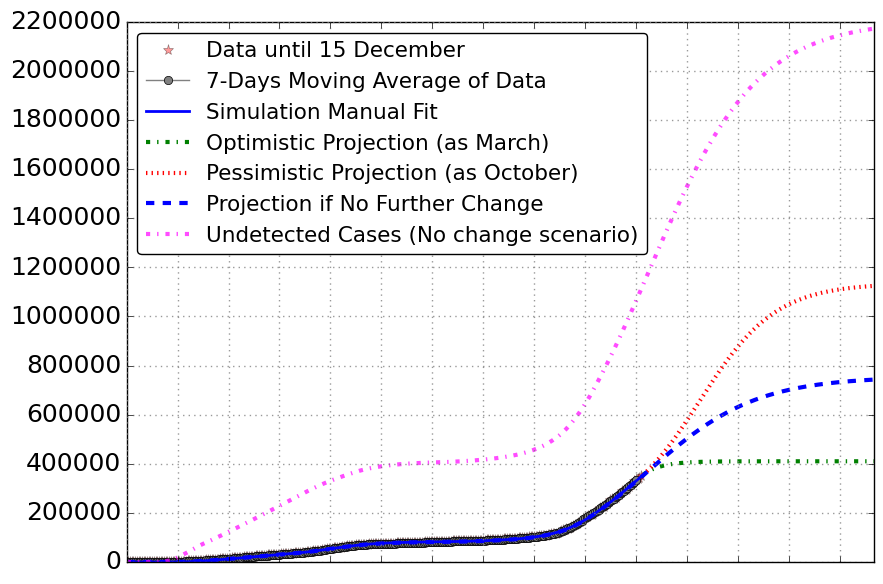

In [58]:
#plot cumulative cases
plt.figure(figsize=(9, 6),facecolor="white")

DI=df['new_cases_cum']
SevenDaysMovingAverage_TotalCases = ComputeSevenDaysMovingAverage(DI)
p =len(SevenDaysMovingAverage_TotalCases)
    
plt.plot(times[0:p],DI,'*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_TotalCases)-1]),alpha=0.4, markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_TotalCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
#plt.plot(t,(resultsseirfit[:,2]+resultsseirfit[:,3]+resultsseirfit[:,4]+resultsseirfit[:,6]+resultsseirfit[:,7]+resultsseirfit[:,8]+resultsseirfit[:,9]+resultsseirfit[:,10]+resultsseirfit[:,11])*N, label="Simulation automated fit", linewidth=2,color='red')
plt.plot(t[0:NumberDaysData],(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11]+resultsseir[:,15])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=2,color='blue')

Optimistic = resultsseir_Best[:,2]+resultsseir_Best[:,3]+resultsseir_Best[:,4]+resultsseir_Best[:,6]+resultsseir_Best[:,7]+resultsseir_Best[:,8]+resultsseir_Best[:,9]+resultsseir_Best[:,10]+resultsseir_Best[:,11]+resultsseir_Best[:,15]
Pessimistic = resultsseir_Worst[:,2]+resultsseir_Worst[:,3]+resultsseir_Worst[:,4]+resultsseir_Worst[:,6]+resultsseir_Worst[:,7]+resultsseir_Worst[:,8]+resultsseir_Worst[:,9]+resultsseir_Worst[:,10]+resultsseir_Worst[:,11]+resultsseir_Worst[:,15]
plt.plot(t[NumberDaysData:-1],Optimistic[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as March)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],Pessimistic[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

plt.plot(t,(resultsseir[:,12]+resultsseir[:,13]+resultsseir[:,14]+resultsseir[:,5])*N,'-.', label="Undetected Cases (No change scenario)", linewidth=3,color='magenta',alpha=0.7)


UpperY = 2200000 # 300000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY+1,200000),fontsize=18)

# plt.title("Sweden")

#plt.legend(loc='upper left')
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Total Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY)
plt.legend(loc='best', fancybox=True, numpoints=1,fontsize=15.5)

plt.tight_layout()
plt.savefig('./Results_Sweden/TotalCases_SEIR-ICU_Sweden'+ FileFormatOfFigures)

In [59]:
list_of_tuples=list(zip(df['date'],SevenDaysMovingAverage_TotalCases))
df2=pd.DataFrame(list_of_tuples,columns=['Date','Cases'])
df2
df2.to_csv(r'dataframe_moving_average-SWEDEN.csv', index = False)
# minimum of daily new cases 11 June (112)

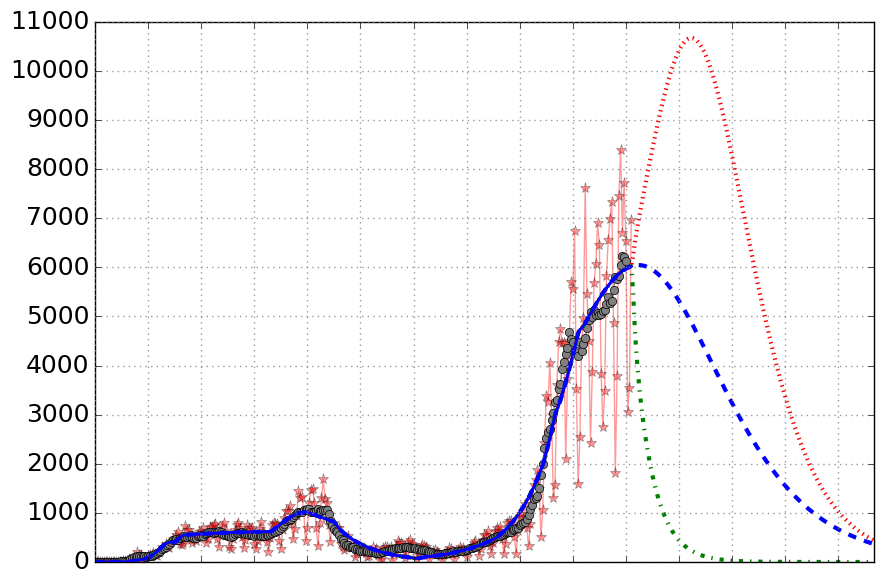

In [60]:
#plot daily new cases
plt.figure(figsize=(9, 6),facecolor="white")

DI1=df['new_cases']
SevenDaysMovingAverage_DailyCases = ComputeSevenDaysMovingAverage(DI1)
p =len(SevenDaysMovingAverage_DailyCases)
    
plt.plot(times[0:p],DI1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_DailyCases)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_DailyCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
yoo=(resultsseir[:,2]+resultsseir[:,3]+resultsseir[:,4]+resultsseir[:,6]+resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,9]+resultsseir[:,10]+resultsseir[:,11]+resultsseir[:,15])*N


yooOptimistic = Optimistic*N
yooPessimistic = Pessimistic*N

pp=len(yoo)

yuu=np.zeros(1001)
for ii in range(0,1000):
    yuu[ii]= yoo[ii+1]-yoo[ii]
plt.plot(np.arange(0,1001,1)[0:NumberDaysData],yuu[0:NumberDaysData],label="Simulation, Manual Fit", linewidth=2,color='blue')

yuuOptimistic=np.zeros(1001)
for ii in range(0,1000):
    yuuOptimistic[ii]= yooOptimistic[ii+1]-yooOptimistic[ii]
plt.plot(np.arange(0,1001,1)[0:pp+1],yuuOptimistic,'-.', label="Optimistic Projection (as March)", linewidth=3,color='green')

yuuPessimistic=np.zeros(1001)
for ii in range(0,1000):
    yuuPessimistic[ii]= yooPessimistic[ii+1]-yooPessimistic[ii]
plt.plot(np.arange(0,1001,1)[0:pp+1],yuuPessimistic,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')

plt.plot(np.arange(0,1001,1)[0:NumberDaysData],yuu[0:NumberDaysData], linewidth=2,color='blue')

plt.plot(np.arange(0,1001,1)[0:pp+1],yuu,'--', label="Projection if No Further Change", linewidth=3)

UpperY1 = 11000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY1+1,1000),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Daily New Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY1)

plt.tight_layout()
plt.savefig('./Results_Sweden/DailyNewCases_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

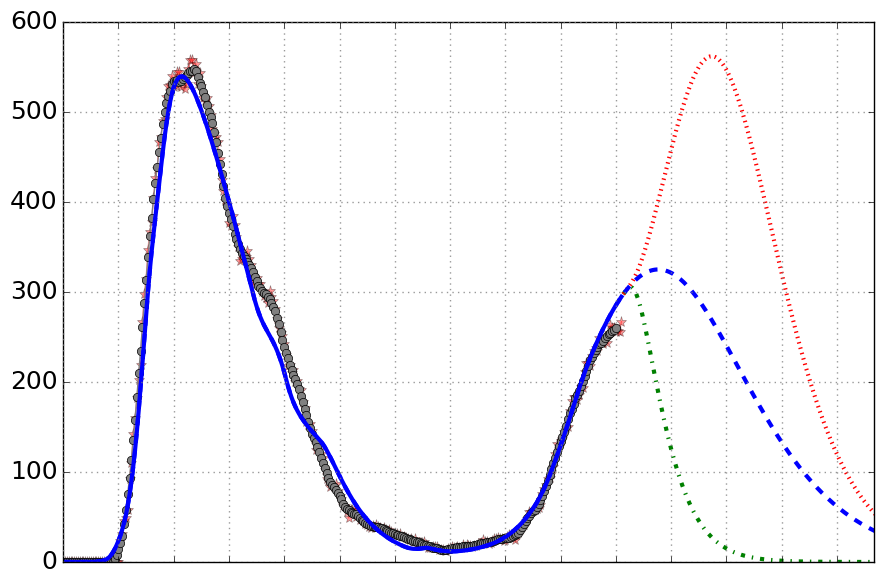

In [61]:
#plot ICU
plt.figure(figsize=(9, 6),facecolor="white")

icu1=df['COVIDensoinsintensifs']
SevenDaysMovingAverage_ICU = ComputeSevenDaysMovingAverage(icu1)
p =len(SevenDaysMovingAverage_ICU)
    
#plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,9])*N, label="Simulation automated fit", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,9])*N, label="Simulation Manual Fit", linewidth=2,color='blue')

plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,9])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],resultsseir_Best[:,9][NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as March)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],resultsseir_Worst[:,9][NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,resultsseir[:,9]*N,'--', label="Projection if No Further Change", linewidth=3)

UpperY2 = 600
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex],'')
plt.yticks(np.arange(0,UpperY2+1,100),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in ICU",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY2)

plt.tight_layout()
plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

#plt.yticks(np.arange(0,4000+1,200))
#plt.ylim(0,3300)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t' + FileFormatOfFigures)

#plt.yticks(np.arange(0,1400+1,200))
#plt.ylim(0,1400)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t_ZOOM' + FileFormatOfFigures)


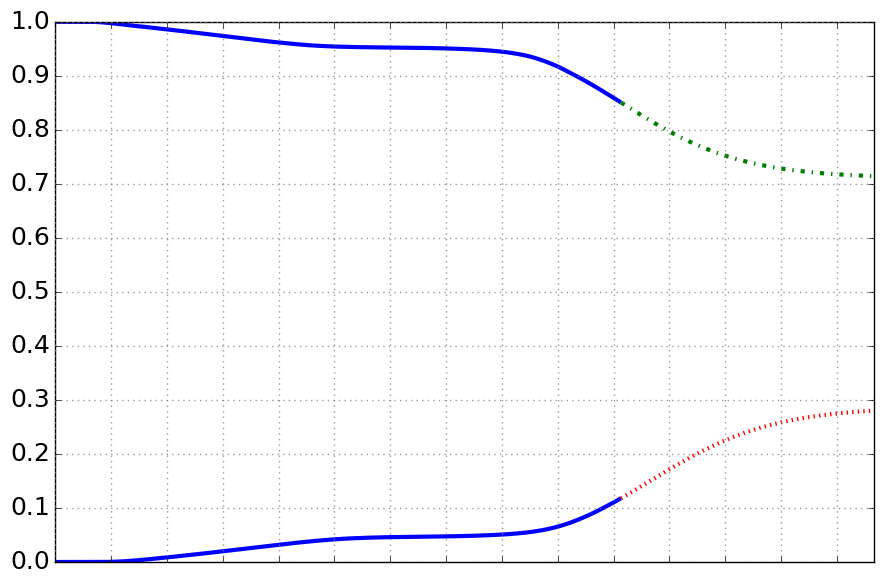

In [62]:
#plot herd immunity
plt.figure(figsize=(9, 6),facecolor="white")


    
#plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,9])*N, label="Simulation automated fit", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,9])*N, label="Simulation Manual Fit", linewidth=2,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,0])[0:NumberDaysData], label="Simulation Manual Fit for infected", linewidth=3,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,2]+resultsseir[:,13])[0:NumberDaysData], label="Simulation Manual Fit for recovered", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir[:,0])[NumberDaysData:-1],'-.', label="Projection for infected", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir[:,2]+resultsseir[:,13])[NumberDaysData:-1],':', label="Projection for recovered", linewidth=3,color='red')

UpperY2 = 1
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex],'')
plt.yticks(np.arange(0,UpperY2+1,0.1),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in ICU",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY2)

plt.tight_layout()
plt.savefig('./Results_Sweden/herdimmunity1_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

#plt.yticks(np.arange(0,4000+1,200))
#plt.ylim(0,3300)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t' + FileFormatOfFigures)

#plt.yticks(np.arange(0,1400+1,200))
#plt.ylim(0,1400)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t_ZOOM' + FileFormatOfFigures)




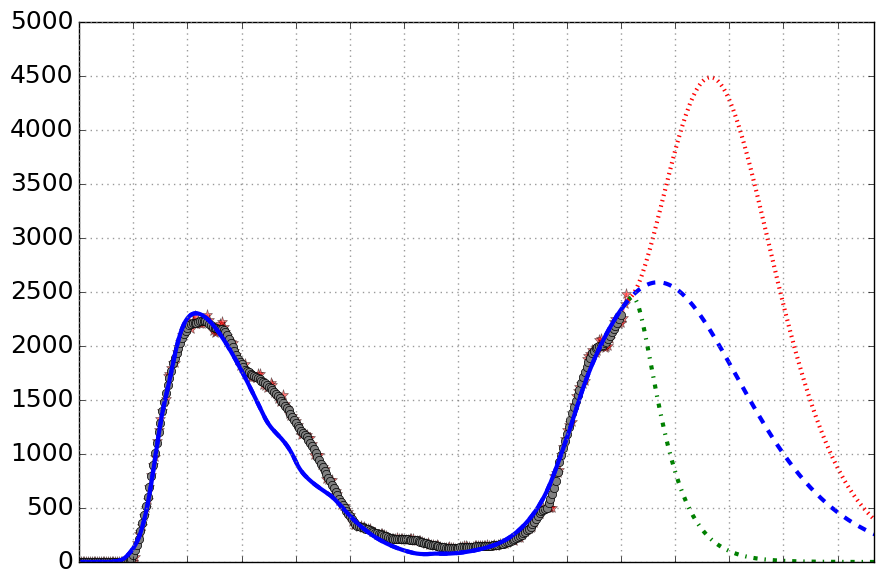

In [63]:
#plot hospitals
plt.figure(figsize=(9, 6),facecolor="white")

H=df['COVIDsoinsnormaux']
SevenDaysMovingAverage_Hos = ComputeSevenDaysMovingAverage(H)
p =len(SevenDaysMovingAverage_Hos)
    
#plt.plot(times[0:p],H,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_Hos)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_Hos[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,7]+resultsseirfit[:,8]+resultsseirfit[:,10])*N, label="automated Simulation", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,10])*N, label="Simulation Manual Fit", linewidth=2,color='blue')

plt.plot(times[0:p],H,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_Hos)-1]),alpha=0.5,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_Hos[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,10])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_Best[:,7]+resultsseir_Best[:,8]+resultsseir_Best[:,10])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as March)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir_Worst[:,7]+resultsseir_Worst[:,8]+resultsseir_Worst[:,10])[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,7]+resultsseir[:,8]+resultsseir[:,10])*N,'--', label="Projection if No Further Change", linewidth=3)

UpperY3 = 5000 # 3000
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY3+1,500),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in Hospital",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/Hospital_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

#plt.yticks(np.arange(0,28000+1,2000))
#plt.ylim(0,28000)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/Hospital_SEIR-ICU_SWEDEN_No_p2t' + FileFormatOfFigures)

#plt.yticks(np.arange(0,6000+1,1000))
#plt.ylim(0,6000)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/Hospital_SEIR-ICU_SWEDEN_No_p2t_ZOOM' + FileFormatOfFigures)


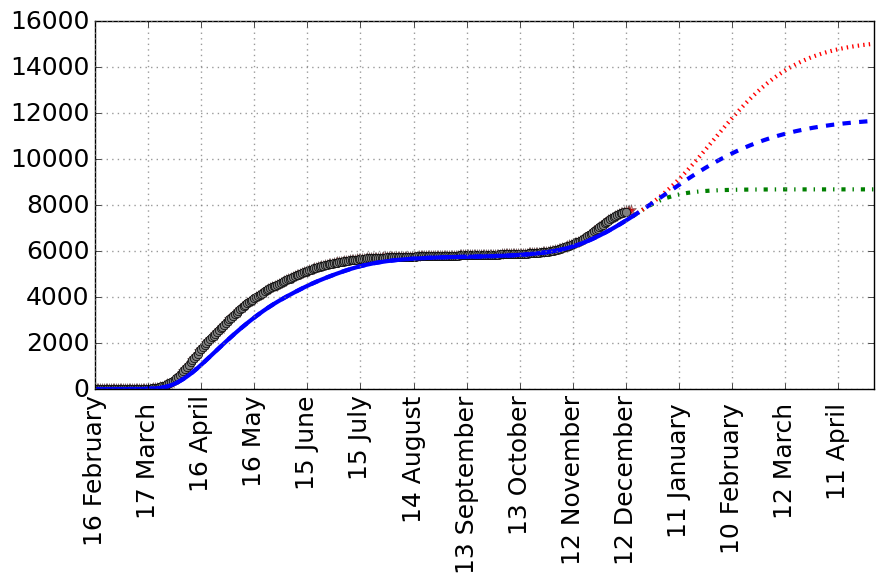

In [64]:
#plot dea
plt.figure(figsize=(9, 6),facecolor="white")

dead=df['dead']
SevenDaysMovingAverage_dead = ComputeSevenDaysMovingAverage(dead)
p =len(SevenDaysMovingAverage_dead)
    
#plt.plot(times[0:p],dead,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_dead)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_dead[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,6]+resultsseirfit[:,15])*N, label="automated Simulation", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,6]+resultsseir[:,15])*N, label="Simulation", linewidth=2,color='blue')
##plt.plot(t,(resultsseir[:,6])*N, label="Simulation, Dead Hospital", linewidth=2,color='red')
##plt.plot(t,(resultsseir[:,15])*N, label="Simulation, Dead Home", linewidth=2,color='green')

plt.plot(times[0:p],dead,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_dead)-1]),alpha=0.5,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_dead[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
plt.plot(t[0:NumberDaysData],(resultsseir[:,6]+resultsseir[:,15])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_Best[:,6]+resultsseir_Best[:,15])[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as March)", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir_Worst[:,6]+resultsseir_Worst[:,15])[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(t,(resultsseir[:,6]+resultsseir[:,15])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = 16000 # 9000
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], size=18,rotation=90)
plt.yticks(np.arange(0,UpperY3+1,2000),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Dead People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/Dead_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

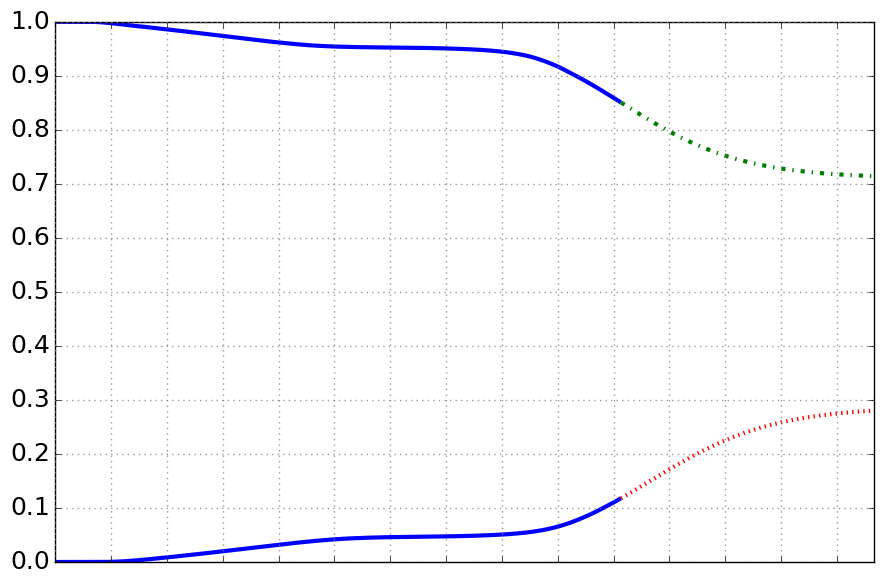

In [65]:
#plot herd immunity
plt.figure(figsize=(9, 6),facecolor="white")


    
#plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,9])*N, label="Simulation automated fit", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,9])*N, label="Simulation Manual Fit", linewidth=2,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,0])[0:NumberDaysData], label="Simulation Manual Fit for infected", linewidth=3,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,2]+resultsseir[:,13])[0:NumberDaysData], label="Simulation Manual Fit for recovered", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir[:,0])[NumberDaysData:-1],'-.', label="Projection for infected", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir[:,2]+resultsseir[:,13])[NumberDaysData:-1],':', label="Projection for recovered", linewidth=3,color='red')

UpperY2 = 1
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex],'')
plt.yticks(np.arange(0,UpperY2+1,0.1),fontsize=18)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in ICU",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY2)

plt.tight_layout()
plt.savefig('./Results_Sweden/herdimmunity1_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

#plt.yticks(np.arange(0,4000+1,200))
#plt.ylim(0,3300)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t' + FileFormatOfFigures)

#plt.yticks(np.arange(0,1400+1,200))
#plt.ylim(0,1400)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t_ZOOM' + FileFormatOfFigures)



In [66]:
#####   Reff(t)   #####

In [67]:
#Reff 
def R_eff(MyMyTimes,MyMy_cases_sim,MyListOfRhos):
    RhosList = rhoAsFunctionforSweden(MyMyTimes,MyListOfRhos)
    #print(MyListOfRhos)
    #plt.plot(RhosList)
    R_eff=np.zeros(len(MyMyTimes))
    for i in range(0, len(MyMyTimes)):
        rho = RhosList[i]
        p1=p1_Sweden(i)
        R_eff[i]= beta*rho*((1-p1)*1/tau8+p1/tau1)*(MyMy_cases_sim[i])/N
    return R_eff

In [68]:
cases_sim=(resultsseir[:,0])*N
cases_sim_Optimistic=(resultsseir_Best[:,0])*N
cases_sim_Pessimistic=(resultsseir_Worst[:,0])*N
print(cases_sim)
print(cases_sim_Optimistic)
print(cases_sim_Pessimistic)

[10229999.     10229998.7607 10229998.1434 ...  7265446.4033  7265446.4033
  7265446.4032]
[10229999.     10229998.7607 10229998.1434 ...  8544366.2678  8544366.2678
  8544366.2678]
[10229999.     10229998.7607 10229998.1434 ...  5899142.2336  5899142.2336
  5899142.2336]


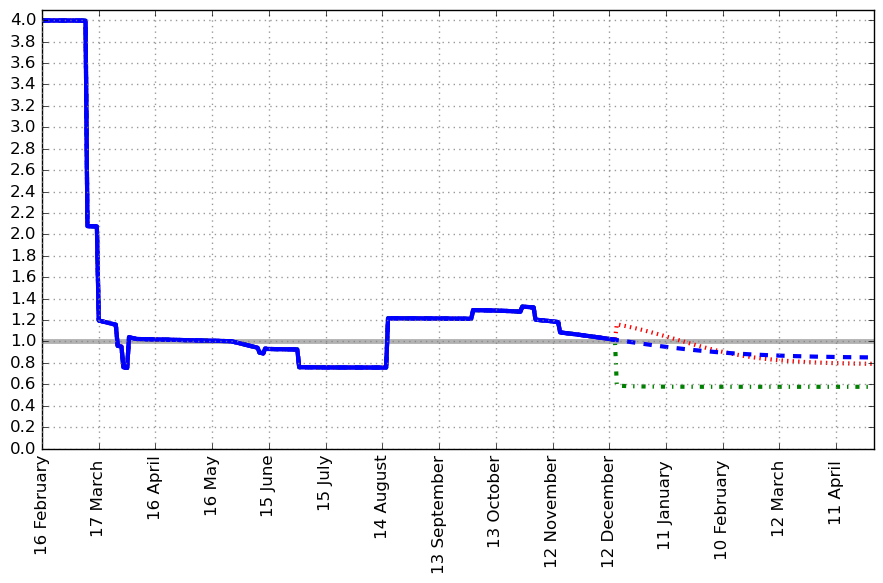

In [69]:
Reff = R_eff(times, cases_sim, ListOfRhos)
Reff_Opt = R_eff(times, cases_sim_Optimistic, List_Rho_BestScenario)
Reff_Pess = R_eff(times, cases_sim_Pessimistic, List_Rho_WorstScenario)

plt.figure(figsize=(9, 6),facecolor='white')

plt.axhline(y=1,color='gray',linewidth=3.5, alpha = 0.6)

plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-', label="Simulation Manual Fit", linewidth=3,color='blue')
plt.plot(times,Reff_Opt,'-.', label="Optimistic Projection (as lockdown)", linewidth=3,color='green')
plt.plot(times,Reff_Pess,':', label="Pessimistic Projection (as October)", linewidth=3,color='red')
plt.plot(times,Reff,'--', label="Projection if No Further Change", linewidth=3,color='blue')
plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-',linewidth=3,color='blue')

UpperY3 = 4.1

plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,UpperY3+1,0.2))

#plt.title('Sweden')

#plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel(“Time”)
#plt.ylabel(r'$R_{eff}(t)$',size=18)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/R_eff_SWEDEN' + FileFormatOfFigures)



In [70]:
Reff[NumberDaysData]

1.0134

0.34


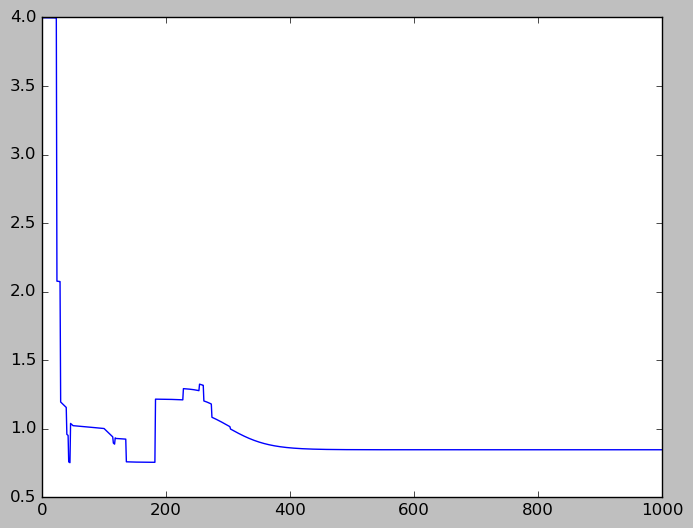

In [71]:
ListReffTODAY = []
TentativeRhosList = np.arange(0,1.01,0.01)
ListFullRefft = []
for ThisRho in TentativeRhosList:
    List_Rho_FindMaxRho_SuchThat_Refft_is_1 = list(ListOfRhos) + [ThisRho]
    resultsseir_FindRho=odeint(model_SEIRICUHOS,P2,t,(
        List_Rho_FindMaxRho_SuchThat_Refft_is_1,
        ListOfParametersfirstwave))
    cases_sim_FindRho = (resultsseir_FindRho[:,0])*N
    Reff_FindRho = R_eff(t, cases_sim_FindRho, List_Rho_FindMaxRho_SuchThat_Refft_is_1)
    ListReffTODAY.append(Reff_FindRho[NumberDaysData])
    ListFullRefft.append(Reff_FindRho)
#print(ListReffTODAY)
Index_MaxRhoSuchThatRsmallerEq1 = np.where(np.array(ListReffTODAY)<=1)[0][-1]
#print(Index_MaxRhoSuchThatRsmallerEq1)
print(TentativeRhosList[Index_MaxRhoSuchThatRsmallerEq1])
plt.plot(ListFullRefft[Index_MaxRhoSuchThatRsmallerEq1])

In [72]:
#MODIFIED_ListOfRhos = ListOfRhos
FINAL_ListOfRhos_ForRt1 = ListOfRhos
for NewDays in np.arange(1,5,1):
    ListReffTODAY = []
    TentativeRhosList = np.arange(0,1.01,0.1)
    ListFullRefft = []
    tttimes = t[0:NumberDaysData+NewDays]
    for ThisRho in TentativeRhosList:
        List_Rho_FindMaxRho_SuchThat_Refft_is_1 = list(FINAL_ListOfRhos_ForRt1) + [ThisRho]
        resultsseir_FindRho=odeint(model_SEIRICUHOS,P2,tttimes,(
            List_Rho_FindMaxRho_SuchThat_Refft_is_1,
            ListOfParametersfirstwave))
        cases_sim_FindRho = (resultsseir_FindRho[:,0])*N
        Reff_FindRho = R_eff(tttimes, cases_sim_FindRho, List_Rho_FindMaxRho_SuchThat_Refft_is_1)
        ListReffTODAY.append(Reff_FindRho[NumberDaysData])
        ListFullRefft.append(Reff_FindRho)
    #print(ListReffTODAY)
    Index_MaxRhoSuchThatRsmallerEq1 = np.where(np.array(ListReffTODAY)<=1)[0][-1]
    #print(Index_MaxRhoSuchThatRsmallerEq1)
    print(TentativeRhosList[Index_MaxRhoSuchThatRsmallerEq1])
FINAL_ListOfRhos_ForRt1.append(TentativeRhosList[Index_MaxRhoSuchThatRsmallerEq1])

0.30000000000000004
0.30000000000000004
0.30000000000000004
0.30000000000000004


In [73]:
#############################################
### Now prepare functions needed for MCMC ###
#############################################

In [65]:

def gpp2_1stWave(u,t,theta):

    rho1=theta[0]
    rho2=theta[1]
    rho3=theta[2]
    rho4=theta[3]
    rho5=theta[4]
    rho6=theta[5]
    rho7=theta[6]
    rho8=theta[7]
    rho9=theta[8]
    rho10=theta[9]
    rho11=0.41
    rho12=0.375 # 0.395
    rho13=0.345 # 0.25

    ListOfRhostrial=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13]
    
    alpha=theta[10]
    beta=theta[11]

    p2_max=theta[12]
    p2_min=theta[13]

    p3=theta[14]
    p4=theta[15]
    p5=theta[16]
    p6=theta[17]
    p7=theta[18]

    tau1=theta[19]
    tau2=theta[20]
    tau3=theta[21]

    tau7=theta[22]
    tau6=theta[23]
    #tau6die=theta[24]
    tau5=theta[24]
    #tau5die=theta[26]
    tau4=theta[25]
    #tau4die=theta[28]

    tau8=1/(1/tau1+1/tau2)
    p9=p7
    tau9=tau7
    tau3prim=0.5246
    
    p2prim=0.043 # 0.065#0.172#0.1534
    p3prim=0.88 # 0.8#0.7906
    p4prim=0.92#0.85#0.91
    p5prim=0.98#0.97#0.9295
    p6prim=0.98#0.97#0.9298
    
    p7prim=0.992#0.9876

    tau7prim=0.1084
    tau6prim=123456789#0.0832
    #tau6dieprim=0.1127
    tau5prim=123456789#/8.#0.0579
    #tau5dieprim=0.1124
    tau4prim=123456789#1/11.#0.0444
    #tau4dieprim=0.1207
    tau8prim=1/(1/tau1+1/tau2)
    p9prim=p7prim
    tau9prim=tau7prim

    ListOfParametersfirstwave=np.array([alpha, beta, 
               p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim])
    
    y=model_SEIRICUHOS(u,t,ListOfRhostrial,ListOfParametersfirstwave)
    return y

In [66]:
def errorxy12_1stWave(theta,data):
    
    P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
    tt=len(SevenDaysMovingAverage_TotalCases)
    endfirstwave=197
    t2=np.linspace(0,endfirstwave-1,endfirstwave)
    y=data1
    
    resultsseir2=odeint(gpp2_1stWave,P2,t2,args=(theta,))
    
    # detected -> dead + recovered + icu + hos + icu + qua
    cc=(resultsseir2[:,2]+resultsseir2[:,3]+resultsseir2[:,4]+resultsseir2[:,6]+resultsseir2[:,7]+resultsseir2[:,8]+resultsseir2[:,9]+resultsseir2[:,10]+resultsseir2[:,11]+resultsseir2[:,15])*N-y[0,0:endfirstwave]
    cci=((cc**2).sum(axis=0))
    norm1=max(y[0,0:endfirstwave])
    # icu -> icu
    bi=((resultsseir2[:,9])*N- y[1,0:endfirstwave])
    bbi=((bi**2).sum(axis=0))
    norm2=max(y[1,0:endfirstwave])
    # hospital -> hos + aicu
    ee=((resultsseir2[:,7]+resultsseir2[:,8]+resultsseir2[:,10])*N)-y[2,0:endfirstwave]
    eei=((ee**2).sum(axis=0))
    norm3=max(y[2,0:endfirstwave])
    
    # dead
    di=((resultsseir2[:,6]+resultsseir2[:,15])*N- y[3,0:endfirstwave])
    ddi=((di**2).sum(axis=0))
    norm4=max(y[3,0:endfirstwave])
    RMS= (cci/norm1 + eei/norm2  + bbi/norm3 + ddi/norm4)
    
    return RMS

In [67]:
#####################################################################################
##### NOW WE ADD HERE MCMC FOR 1ST AND 2ND WAVE AND ALL WHAT'S NEEDED TO RUN IT #####
#####################################################################################

In [67]:
##############################
### PARALLEL MCMC 1st WAVE ###
##############################

# MAIN IMPROVEMENTS W.R.T. PREVIOUS SETUP:

# 1) REMOVE MYSTERIUS SECOND CHAIN
# 2) PARALLEL MCMC x 8 chains
# 3) ALL PARAMETER SPACE
# 4) RANDOM CI, different for every chain
# 5) KEEP ONLY ONE POINT EVERY 100
# 6) LONGER CHAINS 500000
# 7) COMPUTE CONVERGENCE STATISTICS

# X) ALL CHAINS STILL HAVE SAME RANDOM SEED, SHOULD MAKE IT DIFGFERENT FOR EVERY CHAIN (HOW?) OR IRRELEVANT?



In [68]:
### FIRST WE CREATE SETUP FOR ONE CHAIN AS WE WERE DOING BEFORE ###

# initialize MCMC object
MyNew_mcstat = MCMC(rngseed=123456789)

# initialize data structure 
MyNew_mcstat.data.add_data_set(x=df2['Date'],y=data1)

# Set Boundaries of Parameter Space
MyNew_mcstat.parameters.add_model_parameter(name='rho1', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho2', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho3', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho4', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho5', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho6', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho7', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho8', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho9', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='rho10', minimum=0, maximum=1)

MyNew_mcstat.parameters.add_model_parameter(name='alpha', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='beta', minimum=0, maximum=2)

MyNew_mcstat.parameters.add_model_parameter(name='p2_max', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p2_min', minimum=0, maximum=0.5)

MyNew_mcstat.parameters.add_model_parameter(name='p3', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p4', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p5', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p6', minimum=0.5, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='p7', minimum=0.5, maximum=1)

MyNew_mcstat.parameters.add_model_parameter(name='tau1', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau2', minimum=0, maximum=1)
MyNew_mcstat.parameters.add_model_parameter(name='tau3', minimum=0, maximum=1)

MyNew_mcstat.parameters.add_model_parameter(name='tau7', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau6', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau6die', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau5', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau5die', minimum=0, maximum=0.5)
MyNew_mcstat.parameters.add_model_parameter(name='tau4', minimum=0, maximum=0.5)
#MyNew_mcstat.parameters.add_model_parameter(name='tau4die', minimum=0, maximum=0.5)

# Define options
datestr = datetime.now().strftime('%Y%m%d_%H%M%S')
savedir = 'Saved_MCMC_Chains' + os.sep + str('{}_{}'.format(datestr, 'parallel_chains'))
MyNew_mcstat.simulation_options.define_simulation_options(nsimu=int(500e3), updatesigma=True, method='dram',
                                                         savedir=savedir, savesize=10000, save_to_json=True,
                                                          save_lightly=True, save_to_bin=True)
MyNew_mcstat.model_settings.define_model_settings(sos_function=errorxy12_1stWave)


In [69]:
My_Parallel_MCMC = ParallelMCMC()
My_Parallel_MCMC.setup_parallel_simulation(MyNew_mcstat, initial_values=None, num_cores=8, num_chain=8)

In [77]:
# DO NOT RE-RUN THIS UNLESS YOU WISH A NEW MCMC CHAIN (CAN TAKE 8 HOURS WITH 500000 ITERATIONS)
My_Parallel_MCMC.run_parallel_simulation()

Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_2Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_4Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_5Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_3Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_7Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_1Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_0Processing: Saved_MCMC_Chains/20201217_031129_parallel_chains/chain_6








Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:

Sampling these parameters:





      name      start [      min,       max] N(       mu,   sigma^2)      name      start [      min,       max] N(       mu,   sigma^2)
      name      start [      min,       max] N(       mu,   sigma^2)      name  

In [96]:
My_Parallel_MCMC.display_individual_chain_statistics()


****************************************
Displaying results for chain 0
Files: Saved_MCMC_Chains/20201130_221143_parallel_chains/chain_0


------------------------------
name      :       mean        std     MC_err        tau     geweke
rho1      :     0.4247     0.0523     0.0102    99.6754     0.9092
rho2      :     0.1747     0.0147     0.0029    79.5572     0.9132
rho3      :     0.3735     0.0701     0.0154   134.6448     0.6210
rho4      :     0.6623     0.2265     0.0493   128.9275     0.3176
rho5      :     0.3353     0.0738     0.0145    34.9739     0.7521
rho6      :     0.7914     0.1389     0.0302   133.8733     0.6534
rho7      :     0.8029     0.1446     0.0316    80.6743     0.7218
rho8      :     0.5280     0.1673     0.0367   135.4537     0.4110
rho9      :     0.7478     0.2039     0.0449    79.5244     0.6289
rho10     :     0.3278     0.1096     0.0222    94.8972     0.8325
alpha     :     0.1634     0.0180     0.0037   124.0525     0.9040
beta      :     1.3979   



------------------------------
name      :       mean        std     MC_err        tau     geweke
rho1      :     0.1911     0.0699     0.0138    73.9469     0.7498
rho2      :     0.4429     0.0587     0.0115    65.7027     0.9862
rho3      :     0.0812     0.0064     0.0012    34.9950     0.8162
rho4      :     0.4831     0.0467     0.0099    66.2194     0.7950
rho5      :     0.6740     0.1485     0.0301    58.4368     0.9490
rho6      :     0.0917     0.0164     0.0035    98.6605     0.8548
rho7      :     0.2550     0.0281     0.0059    72.9940     0.9271
rho8      :     0.1110     0.0218     0.0047    87.9177     0.6422
rho9      :     0.6516     0.0984     0.0218   100.7747     0.5499
rho10     :     0.7095     0.1228     0.0268   110.6720     0.7193
alpha     :     0.2653     0.0224     0.0044    32.3233     0.8493
beta      :     1.3499     0.2371     0.0523   129.1217     0.5046
p2_max    :     0.8407     0.0831     0.0161    82.1625     0.9967
p2_min    :     0.2761     0.

In [2]:
# Loading saved MCMC Chains
DirectoryOfPreviousRunMCMC = 'Saved_MCMC_Chains/20210705_173733_parallel_chains'#'Saved_MCMC_Chains/20210705_173733_parallel_chains'
#used publication in December
#'Saved_MCMC_Chains/20201217_031129_parallel_chains_Sweden_1stWave_6Chains'

#20201217_024339_parallel_chains'#20201202_232703_parallel_chains_1stWave'
# 20201202_000123_parallel_chains_1stWave'
#20201202_232332_parallel_chains_1stWave'
#20201130_221143_parallel_chains'
#'Saved_MCMC_Chains/20201127_110818_parallel_chains'

#20201113_233605_parallel_chains' #'Saved_MCMC_Chains/20201113_201228_parallel_chains_1stWave'
# FRA: 20201113_232939_parallel_chains' # 8 chains, 500k each, narrower p par space
pres = CP.load_parallel_simulation_results(DirectoryOfPreviousRunMCMC)
combined_chains, index = CP.generate_combined_chain_with_index(pres)
np.shape(combined_chains) # 8 chains x 500k/2 = 2 Millions points

(2000000, 26)

In [3]:
### RUN DIAGNOStiC TO ASSESS IN A QUANTITATIVE MANNER IF THE MULTIPLE EMCMC CHAINS CONVERGED ###

# Gelman-Rubin Diagnostic (https://github.com/prmiles/pymcmcstat_examples/blob/master/Running_Parallel_Chains.ipynb)

chains = CP.generate_chain_list(pres)
psrf = CS.gelman_rubin(chains=chains, display=True)

# In general, R closer to 1 indicates your chains have converged.

Parameter: $p_{0}$
  R = 1.002088969096303
  B = 77.31601651266439
  W = 0.08310964560031872
  V = 0.08345723523604333
  neff = 2158.8601948309897
Parameter: $p_{1}$
  R = 1.0010499080095872
  B = 38.571103410438695
  W = 0.08245923996328627
  V = 0.0826324800916734
  neff = 4284.6832361715715
Parameter: $p_{2}$
  R = 1.0011465411520728
  B = 41.990833712930375
  W = 0.08221328306452719
  V = 0.08240191296310312
  neff = 3924.7571756465904
Parameter: $p_{3}$
  R = 1.0029390497727866
  B = 106.56864621631941
  W = 0.08140897521895644
  V = 0.081888208491029
  neff = 1536.816153689471
Parameter: $p_{4}$
  R = 1.0006290773489062
  B = 23.009912776693362
  W = 0.08201225434846467
  V = 0.08211547090694238
  neff = 7137.3995811159075
Parameter: $p_{5}$
  R = 1.000822056325516
  B = 30.135693808717377
  W = 0.08224864989731862
  V = 0.08238393152485825
  neff = 5467.53176135782
Parameter: $p_{6}$
  R = 1.0004127604439337
  B = 15.231728375725682
  W = 0.08261238978116917
  V = 0.082680602109

In [4]:
chains

[array([[0.1549, 0.7965, 0.7981, ..., 0.4879, 0.0555, 0.2803],
        [0.1781, 0.832 , 0.7977, ..., 0.4841, 0.0563, 0.2617],
        [0.1975, 0.7868, 0.8209, ..., 0.4791, 0.045 , 0.2623],
        ...,
        [0.4722, 0.0991, 0.7555, ..., 0.0579, 0.4321, 0.3263],
        [0.4722, 0.0991, 0.7555, ..., 0.0579, 0.4321, 0.3263],
        [0.4722, 0.0991, 0.7555, ..., 0.0579, 0.4321, 0.3263]]),
 array([[0.3542, 0.3798, 0.9817, ..., 0.2388, 0.4265, 0.4686],
        [0.3542, 0.3798, 0.9817, ..., 0.2388, 0.4265, 0.4686],
        [0.3542, 0.3798, 0.9817, ..., 0.2388, 0.4265, 0.4686],
        ...,
        [0.187 , 0.4426, 0.1652, ..., 0.2855, 0.3045, 0.0991],
        [0.187 , 0.4426, 0.1652, ..., 0.2855, 0.3045, 0.0991],
        [0.187 , 0.4426, 0.1652, ..., 0.2855, 0.3045, 0.0991]]),
 array([[6.1882e-01, 8.3777e-01, 7.1912e-01, ..., 4.0411e-01, 1.5386e-01,
         3.4891e-01],
        [6.1882e-01, 8.3777e-01, 7.1912e-01, ..., 4.0411e-01, 1.5386e-01,
         3.4891e-01],
        [6.1882e-01, 8

In [5]:
print(np.shape(chains))

## Prepare indexes to cut chains, only 1 point every 100

### CHANGE THE ABOVE WHEN YOU RUN A LONGER CHAIN!!! ###

if np.shape(chains)[1] <= 10000:
    OneStepEveryNinChains = 1
elif np.shape(chains)[1] > 10000 and np.shape(chains)[1] <= 100000:
    OneStepEveryNinChains = 10
elif np.shape(chains)[1] >= 100000:
    OneStepEveryNinChains = 100

Indexes1OutOf100 = np.arange(0,np.shape(chains)[1],OneStepEveryNinChains) # np.arange(0,500,1) # np.linspace(0,250000,2501)[0:-1]
Indexes1OutOf100 = Indexes1OutOf100.astype(int)
print(np.shape(chains[0][Indexes1OutOf100,:]))
#print(np.shape(chains[0][:,:]))

# NO, FOR PLOTTING TOO LONG. Based on the paper from Link and Eaton (2012), we decide instead to keep all points of the chain

# Cut chains and concatenate them
MyChain = chains[0][Indexes1OutOf100,:]
#MyChain = chains[0][:,:]
#MyChain_BurninRemoved = MyChain[100::,:]
MyChain_BurninRemoved = MyChain[:,:]

ConcatenatedExtractedChains = MyChain_BurninRemoved
print(np.shape(ConcatenatedExtractedChains))
for i in range(5):#7):
    # Take out first 10000 of each chain i.e. 100 of the points left) for burnin
    MyChain = chains[i+1][Indexes1OutOf100,:]
    #MyChain = chains[i+1][:,:]
    #MyChain_BurninRemoved = MyChain[100::,:]
    MyChain_BurninRemoved = MyChain[:,:]

    # Than concatenate
    ConcatenatedExtractedChains = np.concatenate((ConcatenatedExtractedChains,MyChain_BurninRemoved),axis=0)
print(np.shape(ConcatenatedExtractedChains))


(8, 250000, 26)
(2500, 26)
(2500, 26)
(15000, 26)


<Figure size 640x480 with 0 Axes>

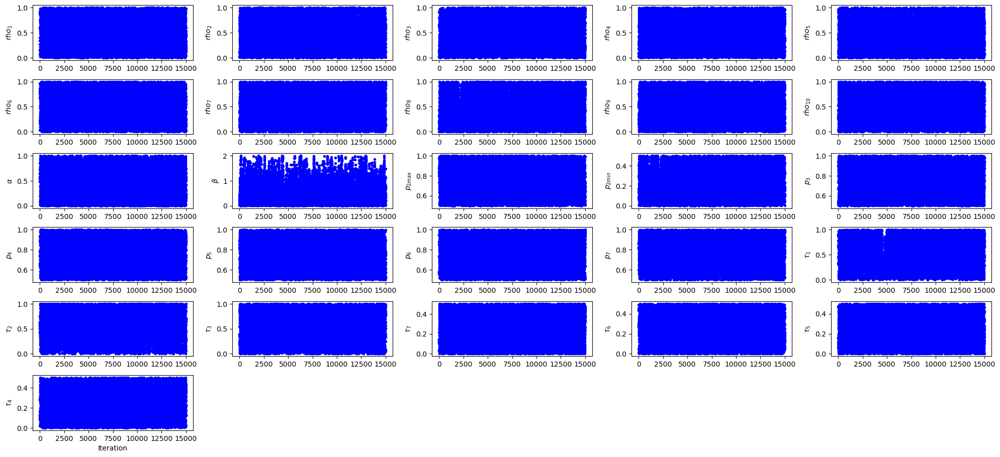

In [75]:
plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
plt.figure(facecolor="white")
settings = dict(
    fig=dict(figsize=(20, 10))
)
# Later make this authomatic!!!
#NamesParamsParallelChains = ['rho1','rho2','rho3','rho4','rho5','rho6','rho7','rho8','rho9','rho10',
#                             'alpha','beta','p2max','p2min','p3','p4','p5','p6','p7','tau1','tau2','tau3',
#                             'tau7','tau6sur','tau6die','tau5sur', 'tau5die','tau4sur','tau4die']

NamesParamsParallelChains = [r'$rho_1$',r'$rho_2$',r'$rho_3$',r'$rho_4$',r'$rho_5$',
                             r'$rho_6$',r'$rho_7$',r'$rho_8$',r'$rho_9$',r'$rho_{10}$',
                             r'$\alpha$',r'$\beta$',r'$p_{2max}$',r'$p_{2min}$',r'$p_3$',
                             r'$p_4$',r'$p_5$',r'$p_6$',r'$p_7$',
                             r'$\tau_1$',r'$\tau_2$',r'$\tau_3$',
                             r'$\tau_7$',r'$\tau_{6}$',
                             r'$\tau_{5}$',r'$\tau_{4}$']
    
mcp.plot_chain_panel(ConcatenatedExtractedChains,NamesParamsParallelChains, settings,maxpoints=1000000)
plt.savefig('./Results_Sweden/Sweden_Parallel8CutChains_1D_1stWave.png')
# One can save the figure directly on computer as a pdf (or any other format), just uncomment the following
# pdf quality is better, but reduce the number of points in plot (maxpoints above) 
# otherwise too heavy and slow to visualize!!!
# plt.savefig('./Results/MCMC_2ndWave/Chains_1D_2ndWave_2ndWave.pdf')

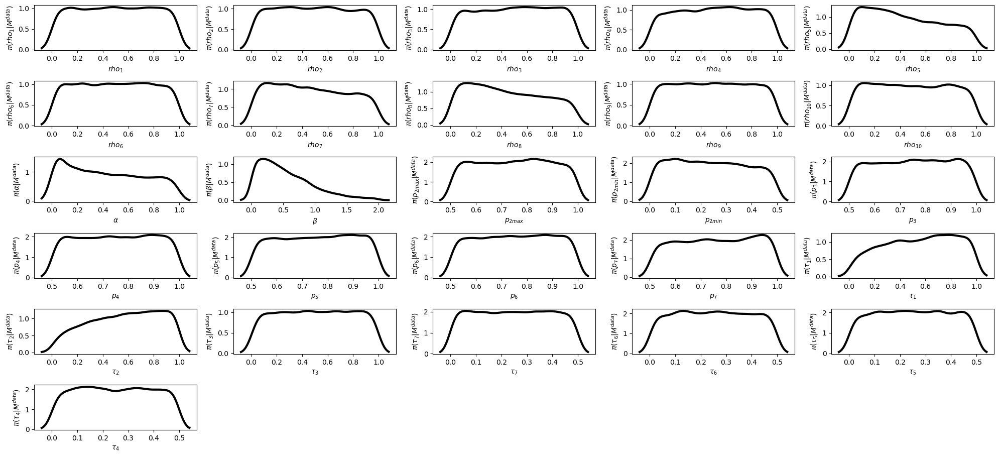

In [76]:
mcp.plot_density_panel(ConcatenatedExtractedChains,NamesParamsParallelChains, settings)
plt.savefig('./Results_Sweden/Sweden_Parallel8CutChains_Posteriors_1D_1stWave'+FileFormatOfFigures)

In [77]:
# We here need to define once and for all the function to make the nice colorful plot 
# of 2D posterior densities for all paramerters with blue and red colormap

# IF TOO SLOW, REDUCE THE NUMBER OF BINS, nbins = 20 IS ENOUGH AND GOES FASTER
# IF YOU WANT MORE RESOLUTION (NOT NEEDED), INCREASE THE NUMBER OF BINS, e.g. nbins = 50, NEGLIGIBLE IMPROVEMENT BUT SLOWER

def PlotDensityPosteriorWithContours(axes,My_chain,i,j): # ,MyNLevels):
    
    from scipy.stats import kde

    nbins = 30 # This can be changed to make more smooth or more granular densities
    # Evaluate a gaussian kde on a regular grid of nbins x nbins over data extents
    data = My_chain[:,[j,i]]
    x, y = data.T
    k = kde.gaussian_kde(data.T)
    xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
    zi = k(np.vstack([xi.flatten(), yi.flatten()]))
    # Added to make Credible Intervals
    zi_Norm=zi/sum(zi)
    # Order zis
    zi_Norm_Sorted_Reverted = sorted(zi_Norm, reverse=True)
    # sum them up in decreasing order
    IntegralOverPosterior = 0
    CounterContours = 0
    for ThisZi in zi_Norm_Sorted_Reverted:
        IntegralOverPosterior = IntegralOverPosterior + ThisZi
        if CounterContours == 0 and IntegralOverPosterior >= 0.25: # 25%
            ContourValue25 = ThisZi
            CounterContours = 1
        elif CounterContours == 1 and IntegralOverPosterior >= 0.5: # 50%
            ContourValue50 = ThisZi
            CounterContours = 2
        elif CounterContours == 2 and IntegralOverPosterior >= 0.90: # 90%
            ContourValue90 = ThisZi
            CounterContours = 3
    
    im = axes[i,j].pcolormesh(xi, yi, zi_Norm.reshape(xi.shape), shading='gouraud', cmap='coolwarm')
    im = axes[i,j].contour(xi, yi, zi_Norm.reshape(xi.shape), colors='k',levels=[ContourValue90,ContourValue50,ContourValue25]) # MyNLevels
 
    
def Plot_Multiple_2D_Densities(My_chain,My_names,FileNameForSaving):
    
    MyMarkersSize = 16

    NumberOfParameters = len(My_names)
        
    plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
    plt.figure(facecolor="white")
    
    fig, axes = plt.subplots(nrows=NumberOfParameters, ncols=NumberOfParameters, subplot_kw=dict(facecolor='white'))
    
    for ax in axes.flat:
        # Hide all ticks and labels
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        # Set up ticks only on one side for the "edge" subplots...
        if ax.is_first_col():
            ax.yaxis.set_ticks_position('left')
        if ax.is_last_col():
            ax.yaxis.set_ticks_position('right')
            ax.yaxis.set_label_position('right')
        if ax.is_first_row():
            ax.xaxis.set_ticks_position('top')
            ax.xaxis.set_label_position('top')
        if ax.is_last_row():
            ax.xaxis.set_ticks_position('bottom')
    
    ListOfParametersNamesForLegend = My_names
    # NLevels = 3 # Number of (black) Contour Lines in each plot
    
    for i in range(NumberOfParameters):
        for j in range(NumberOfParameters):
            DotSize = 1#14
            if i>j:
                if (i % 2) != 0:
                    if (j % 2) != 0:
                        # im = axes[i,j].scatter(My_chain[:,j], My_chain[:,i])#, s=DotSize, c='b', edgecolor = '')#, cmap=plt.cm.rainbow_r)
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
                elif (i % 2) == 0:
                    if  (j % 2) == 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
            elif i<j:
                if (i % 2) != 0:
                    if (j % 2) == 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
                elif (i % 2) == 0:
                    if (j % 2) != 0:
                        PlotDensityPosteriorWithContours(axes,My_chain,i,j)#,NLevels)
            elif i==j:
                # Label the diagonal subplots...
                axes[i,j].annotate(ListOfParametersNamesForLegend[i].split(" ", 1)[0], (0.5, 0.5), xycoords='axes fraction', ha='center', va='center',size=MyMarkersSize)
                #axes[i,j].scatter(ListOfOutputArrays[2+i], ListOfOutputArrays[0], s=8)               
    
            axes[i,j].set_xlim(min(My_chain[:,j]),max(My_chain[:,j]))
            axes[i,j].set_ylim(min(My_chain[:,i]),max(My_chain[:,i]))
            plt.setp(axes[i,j].get_xticklabels(), rotation=45, horizontalalignment='left')

    #cbar = fig.colorbar(im,ax=axes.ravel().tolist())
    #cbar.set_label('Marginal Posterior Probability')
    
    for k in range(round(NumberOfParameters/2)):
    
        axes[NumberOfParameters-1,2*k].xaxis.set_visible(True)
        axes[NumberOfParameters-1,2*k].locator_params(axis='x',nbins=5)
        plt.setp(axes[NumberOfParameters-1,2*k].get_xticklabels(), rotation=45, horizontalalignment='right')
        axes[NumberOfParameters-1,2*k].set_xlabel(ListOfParametersNamesForLegend[2*k],size=MyMarkersSize)
        axes[NumberOfParameters-1,2*k].get_xaxis().set_tick_params(direction='out')
    
        axes[2*k,0].yaxis.set_visible(True)
        axes[2*k,0].locator_params(axis='y',nbins=5)
        axes[2*k,0].set_ylabel(ListOfParametersNamesForLegend[2*k],size=MyMarkersSize)
        axes[2*k,0].get_yaxis().set_tick_params(direction='out')

    Remaining = NumberOfParameters % 2 
    
    if Remaining > 0: # then NumberOfParameters was an odd number
        
        for k in range(round(NumberOfParameters/2)-1):

            axes[0,2*k+1].xaxis.set_visible(True)
            axes[0,2*k+1].locator_params(axis='x',nbins=5)
            plt.setp(axes[0,2*k+1].get_xticklabels(), rotation=45, horizontalalignment='left')
            axes[0,2*k+1].set_xlabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[0,2*k+1].get_xaxis().set_tick_params(direction='out')

            axes[2*k+1,NumberOfParameters-1].yaxis.set_visible(True)
            axes[2*k+1,NumberOfParameters-1].locator_params(axis='y',nbins=5)
            axes[2*k+1,NumberOfParameters-1].set_ylabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[2*k+1,NumberOfParameters-1].get_yaxis().set_tick_params(direction='out')

    elif Remaining == 0: # then NumberOfParameters was an odd number

        for k in range(round(NumberOfParameters/2)):

            axes[0,2*k+1].xaxis.set_visible(True)
            axes[0,2*k+1].locator_params(axis='x',nbins=5)
            plt.setp(axes[0,2*k+1].get_xticklabels(), rotation=45, horizontalalignment='left')
            axes[0,2*k+1].set_xlabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[0,2*k+1].get_xaxis().set_tick_params(direction='out')

            axes[2*k+1,NumberOfParameters-1].yaxis.set_visible(True)
            axes[2*k+1,NumberOfParameters-1].locator_params(axis='y',nbins=5)
            axes[2*k+1,NumberOfParameters-1].set_ylabel(ListOfParametersNamesForLegend[2*k+1],size=MyMarkersSize)
            axes[2*k+1,NumberOfParameters-1].get_yaxis().set_tick_params(direction='out')
    
    fig.set_figheight(25)
    fig.set_figwidth(25)
    plt.subplots_adjust(wspace=0, hspace=0)
               
    fig.savefig(FileNameForSaving)

    plt.show()
    

<Figure size 640x480 with 0 Axes>

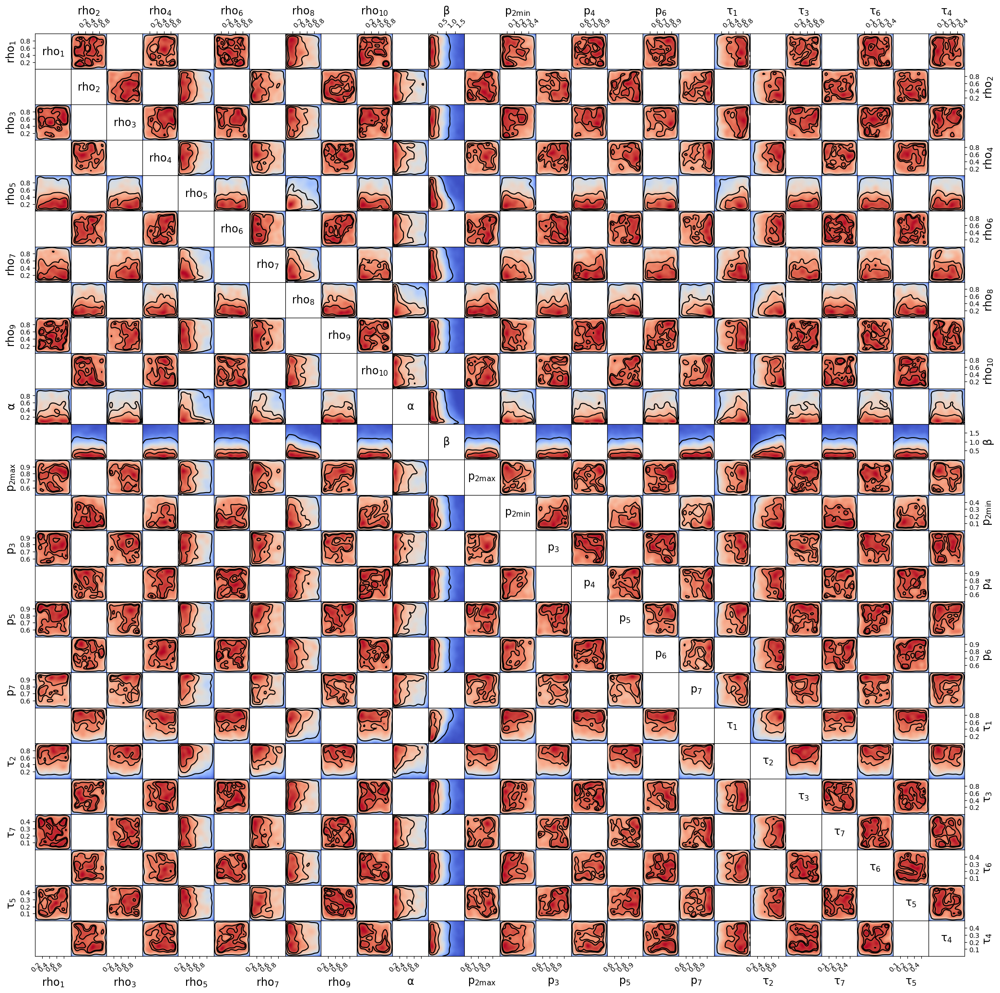

In [355]:
Plot_Multiple_2D_Densities(ConcatenatedExtractedChains, NamesParamsParallelChains, 
                           FileNameForSaving='./Results_Sweden/Sweden_Parallel8CutChains_Posteriors_2D_1stWave' + FileFormatOfFigures)

In [74]:
##############################
### PARALLEL MCMC 2nd WAVE ###
##############################

In [75]:
def gpp2_2ndWave(u,t,theta,data):

    rho1=0.52#0.5#0.95 # STE    0.9
    rho2=0.3#0.35#0.4#0.5#0.8 # STE     0.65
    rho3=0.25#0.34#0.295#0.4#0.55 # STE     0.5
    rho4=0.2#0.3#0.284#0.29#0.42 # STE     0.45
    rho5=0.277#0.245#0.278#0.277#0.275#0.272#0.255#0.32 # STE     0.35
    #rho6=rho5#0.3#0.245#0.26 # STE     0.31
    #increase rho
    rho6=0.265 #0.6#0.27#0.3#0.31#0.263#5 # STE     0.33
    rho7=0.28#0.6#0.3#0.25#0.305 #0.3 # STE       0.385 
    rho8=0.23#0.15#0.21#0.3#295 #0.29 # STE    0.265
    rho9=0.37 #0.355#0.39#0.26 #0.285 # STE      0.295
    rho10=0.395#0.39#0.395#0.385#0.43#0.22#21#0 # STE 

    rho11=theta[0]
    rho12=theta[1]
    rho13=theta[2]

    ListOfRhostrial=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13]
    
    alpha=0.4433
    beta=1.287
    
    p2_max=0.9
    p2_min=0.1

    p3=0.72
    p7=0.99

    tau1=0.6808
    tau2=0.5979
    tau3=0.5246

    tau7=0.1084

    tau6sur=1/10
    tau6die=1/6
    tau5sur=1/4
    tau5die=1/6
    tau4sur=1/6
    tau4die=1/4
    p4old=0.75
    p5old=0.86
    p6old=0.86

    x4 = tau4sur * p4old
    y4 = tau4die * (1-p4old)
    x5 = tau5sur * p5old
    y5 = tau5die * (1-p5old)
    x6 = tau6sur * p6old
    y6 = tau6die * (1-p6old)

    tau4 = x4 + y4
    p4 = x4 / (x4 + y4)
    tau5 = x5 + y5
    p5 = x5 / (x5 + y5)
    tau6 = x6 + y6
    p6 = x6 / (x6 + y6)

    tau8=1/(1/tau1+1/tau2)
    p9=p7
    tau9=tau7

    tau3prim=theta[3]

    p2prim=theta[4]
    p3prim=theta[5]
    p4prim=theta[6]
    p5prim=theta[7]
    p6prim=theta[8]
    p7prim=theta[9]

    tau7prim=theta[10]
    tau6prim=theta[11]
    #tau6dieprim=theta[12]
    tau5prim=theta[12]
    #tau5dieprim=theta[14]
    tau4prim=theta[13]
    #tau4dieprim=theta[16]
    tau8prim=1/(1/tau1+1/tau2)
    p9prim=p7prim
    tau9prim=tau7prim

    ListOfParametersfirstwave=np.array([alpha, beta, 
            p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim])  
    
    y=model_SEIRICUHOS(u,t,ListOfRhostrial,ListOfParametersfirstwave)
    return y

In [76]:
def errorxy12_2ndWave(theta,data):
    
    P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
    tt=len(SevenDaysMovingAverage_TotalCases)
    endfirstwave=197
    RMS=np.zeros(tt-endfirstwave+1)
    #176 as the rest in nan
    t2=np.linspace(0,tt-1,tt)
    y=data1
   
    resultsseir2=odeint(gpp2_2ndWave,P2,t2,args=(theta,data1))
    
    cc=0
    bi=0
    ee=0
    di=0
    
    # S, E, R ,I ,Q, A, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
    
    cc=(resultsseir2[endfirstwave:tt,2]+resultsseir2[endfirstwave:tt,3]+resultsseir2[endfirstwave:tt,4]+resultsseir2[endfirstwave:tt,6]+resultsseir2[endfirstwave:tt,7]+resultsseir2[endfirstwave:tt,8]+resultsseir2[endfirstwave:tt,9]+resultsseir2[endfirstwave:tt,10]+resultsseir2[endfirstwave:tt,11]+resultsseir2[endfirstwave:tt,15])*N-y[0,endfirstwave:tt]
    cci=((cc**2).sum(axis=0))
    
    # icu -> icu
    bi=((resultsseir2[endfirstwave:tt,9])*N- y[1,endfirstwave:tt])
    bbi=((bi**2).sum(axis=0))
    
    # hospital -> hos + aicu
    ee=((resultsseir2[endfirstwave:tt,7]+resultsseir2[endfirstwave:tt,8]+resultsseir2[endfirstwave:tt,10])*N)-y[2,endfirstwave:tt]
    eei=((ee**2).sum(axis=0))
    
    # dead 
    di=((resultsseir2[endfirstwave:tt,6]+resultsseir2[endfirstwave:tt,15])*N- y[3,endfirstwave:tt])
    ddi=((di**2).sum(axis=0))

    RMS= cci + eei  + bbi + ddi
    print(cci)
    print(eei)
    print(bbi)
    print(ddi)
    print(resultsseir2)
    print(y)

    return RMS

In [77]:
errorxy12_2ndWave([0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1],'ciao')

650338734309.9731
105875842.62905616
18255524.725358337
69854106854.15892
[[1.0000e+00 9.7752e-08 0.0000e+00 ... 0.0000e+00 0.0000e+00 0.0000e+00]
 [1.0000e+00 8.3080e-08 4.0961e-13 ... 2.0641e-10 2.0850e-12 3.0736e-15]
 [1.0000e+00 1.0464e-07 5.5544e-12 ... 1.3940e-09 1.4081e-11 1.8706e-14]
 ...
 [9.3488e-01 4.6946e-07 7.9133e-03 ... 4.0547e-02 1.1654e-02 3.8781e-03]
 [9.3488e-01 3.9843e-07 7.9137e-03 ... 4.0548e-02 1.1664e-02 3.8814e-03]
 [9.3488e-01 3.3806e-07 7.9141e-03 ... 4.0549e-02 1.1673e-02 3.8844e-03]]
[[0.0000e+00 0.0000e+00 0.0000e+00 ... 3.3835e+05 3.4276e+05 3.4858e+05]
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 2.5880e+02 2.5967e+02 2.6700e+02]
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 2.3082e+03 2.3760e+03 2.4820e+03]
 [0.0000e+00 0.0000e+00 0.0000e+00 ... 7.7500e+03 7.7667e+03 7.7760e+03]]


720316972531.4865

In [78]:
data1

array([[0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 3.3835e+05, 3.4276e+05,
        3.4858e+05],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 2.5880e+02, 2.5967e+02,
        2.6700e+02],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 2.3082e+03, 2.3760e+03,
        2.4820e+03],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 7.7500e+03, 7.7667e+03,
        7.7760e+03]])

In [79]:
# initialize MCMC object
MyNew_mcstat_2ndWave = MCMC(rngseed=123456789)

# initialize data structure 
MyNew_mcstat_2ndWave.data.add_data_set(x=df2['Date'],y=data1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho11', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho12', minimum=0, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='rho13', minimum=0, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau3prim', minimum=0, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p2prim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p3prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p4prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p5prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p6prim', minimum=0.5, maximum=1)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='p7prim', minimum=0.5, maximum=1)

MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau7prim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau6prim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau6dieprim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau5prim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau5dieprim', minimum=0, maximum=0.5)
MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau4prim', minimum=0, maximum=0.5)
#MyNew_mcstat_2ndWave.parameters.add_model_parameter(name='tau4dieprim', minimum=0, maximum=0.5)

# Define options
datestr = datetime.now().strftime('%Y%m%d_%H%M%S')
savedir = 'Saved_MCMC_Chains' + os.sep + str('{}_{}'.format(datestr, 'parallel_chains'))
MyNew_mcstat_2ndWave.simulation_options.define_simulation_options(nsimu=int(500e3), updatesigma=True, method='dram',
                                                         savedir=savedir, savesize=10000, save_to_json=True,
                                                          save_lightly=True, save_to_bin=True)
MyNew_mcstat_2ndWave.model_settings.define_model_settings(sos_function=errorxy12_2ndWave)


In [80]:
My_Parallel_MCMC_2ndWave = ParallelMCMC()
My_Parallel_MCMC_2ndWave.setup_parallel_simulation(MyNew_mcstat_2ndWave, initial_values=None, num_cores=8, num_chain=8)

In [259]:
# DO NOT RE-RUN THIS UNLESS YOU WISH A NEW MCMC CHAIN (CAN TAKE 8 HOURS WITH 500000 ITERATIONS)
My_Parallel_MCMC_2ndWave.run_parallel_simulation()

Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_1Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_5Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_2Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_6Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_4Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_3Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_0Processing: Saved_MCMC_Chains/20201218_020648_parallel_chains/chain_7








Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:
Sampling these parameters:



Sampling these parameters:



      name      start [      min,       max] N(       mu,   sigma^2)      name      start [      min,       max] N(       mu,   sigma^2)
      name      start [      min,       max] N(       mu,   sigma^2)      name  

In [54]:
My_Parallel_MCMC_2ndWave.display_individual_chain_statistics()


****************************************
Displaying results for chain 0
Files: Saved_MCMC_Chains/20201204_235551_parallel_chains/chain_0


------------------------------
name      :       mean        std     MC_err        tau     geweke
rho11     :     0.4291     0.0564     0.0166     6.4423     0.7098
rho12     :     0.4283     0.0819     0.0264    12.7400     0.5757
rho13     :     0.5247     0.0382     0.0111     7.4875     0.9794
tau3prim  :     0.4737     0.1688     0.0552    12.2640     0.2781
p2prim    :     0.1277     0.0161     0.0049    11.0973     0.9174
p3prim    :     0.8309     0.0938     0.0290    11.9229     0.7268
p4prim    :     0.6336     0.1167     0.0374    11.9077     0.5034
p5prim    :     0.6507     0.0723     0.0229    12.9561     0.9264
p6prim    :     0.8331     0.0831     0.0233     6.6161     0.8357
p7prim    :     0.9296     0.0513     0.0129     4.5186     0.9829
tau7prim  :     0.3107     0.0364     0.0115    12.4618     0.7082
tau6surprim:     0.3343  

In [79]:
DirectoryOfPreviousRunMCMC = 'Saved_MCMC_Chains/20210727_184554_parallel_chains'#'Saved_MCMC_Chains/20210705_193032_parallel_chains' 
#used for December 'Saved_MCMC_Chains/20201218_020648_parallel_chains_Sweden_2ndWave_4Chains'#20201209_011045_parallel_chains_2ndWave'
# 20201204_235551_parallel_chains' # 8 chains, 500k each, narrower p par space

pres_2ndWave = CP.load_parallel_simulation_results(DirectoryOfPreviousRunMCMC)
combined_chains_2ndWave, index_2ndWave = CP.generate_combined_chain_with_index(pres_2ndWave)

print(np.shape(combined_chains_2ndWave))

(2000000, 14)


In [80]:
# NOW COMPUTE AN INDICATOR TO SEE IF THE MULTIPLE CHAINS HAVE CONVERGED TO THE SAME TARGET POSTERIOR DISTRIBUTION 
# OR IF YOU NEED LONGER CHAINS

# Gelman-Rubin Diagnostic (https://github.com/prmiles/pymcmcstat_examples/blob/master/Running_Parallel_Chains.ipynb)

chains_2ndWave = CP.generate_chain_list(pres_2ndWave)
psrf_2ndWave = CS.gelman_rubin(chains=chains_2ndWave, display=True)

# In general, R closer to 1 indicates your chains have converged.

Parameter: $p_{0}$
  R = 1.0005106403935378
  B = 10.198252539990248
  W = 0.044749173591942026
  V = 0.04479488673167761
  neff = 8784.816135121999
Parameter: $p_{1}$
  R = 1.0005045150162166
  B = 7.933589420587391
  W = 0.035233095939611
  V = 0.03526865615961989
  neff = 8890.970855663123
Parameter: $p_{2}$
  R = 1.0003031402684508
  B = 2.056873094806196
  W = 0.01516439547019128
  V = 0.01517359074153603
  neff = 14754.036872620694
Parameter: $p_{3}$
  R = 1.0019336326054284
  B = 68.03778168099531
  W = 0.07901153290059107
  V = 0.07931738687202394
  neff = 2331.5688698939257
Parameter: $p_{4}$
  R = 1.0002038528050694
  B = 1.7940303985647537
  W = 0.019607024548367727
  V = 0.019615019257063077
  neff = 21866.986504526714
Parameter: $p_{5}$
  R = 1.0007706645411207
  B = 7.086815183885865
  W = 0.02062888526927735
  V = 0.02066069342206376
  neff = 5830.741422195526
Parameter: $p_{6}$
  R = 1.0003135838637376
  B = 2.94217771409031
  W = 0.02097340646645989
  V = 0.02098656237

In [81]:
chains_2ndWave

[array([[0.4776, 0.3319, 0.35  , ..., 0.2902, 0.2888, 0.1178],
        [0.4776, 0.3319, 0.35  , ..., 0.2902, 0.2888, 0.1178],
        [0.4776, 0.3319, 0.35  , ..., 0.2902, 0.2888, 0.1178],
        ...,
        [0.3787, 0.4934, 0.1219, ..., 0.4655, 0.3479, 0.0556],
        [0.3787, 0.5213, 0.0984, ..., 0.4639, 0.3627, 0.0316],
        [0.3787, 0.5213, 0.0984, ..., 0.4639, 0.3627, 0.0316]]),
 array([[0.1583, 0.3613, 0.5084, ..., 0.0606, 0.3267, 0.1708],
        [0.1249, 0.3758, 0.5213, ..., 0.0454, 0.3231, 0.1378],
        [0.1574, 0.3707, 0.5125, ..., 0.0745, 0.2872, 0.1321],
        ...,
        [0.2548, 0.4143, 0.3698, ..., 0.1201, 0.4285, 0.0752],
        [0.2548, 0.4143, 0.3698, ..., 0.1201, 0.4285, 0.0752],
        [0.2548, 0.4143, 0.3698, ..., 0.1201, 0.4285, 0.0752]]),
 array([[0.2411, 0.5035, 0.3238, ..., 0.0961, 0.1808, 0.4441],
        [0.241 , 0.4888, 0.332 , ..., 0.0679, 0.1994, 0.4747],
        [0.241 , 0.4888, 0.332 , ..., 0.0679, 0.1994, 0.4747],
        ...,
        [0.0

In [82]:
print(np.shape(chains_2ndWave))

## Prepare indexes to cut chains, only 1 point every 100

### CHANGE THE ABOVE WHEN YOU RUN A LONGER CHAIN!!! ###

if np.shape(chains_2ndWave)[1] <= 10000:
    OneStepEveryNinChains = 1
elif np.shape(chains_2ndWave)[1] > 10000 and np.shape(chains_2ndWave)[1] <= 100000:
    OneStepEveryNinChains = 10
elif np.shape(chains_2ndWave)[1] >= 100000:
    OneStepEveryNinChains = 100

Indexes1OutOf100 = np.arange(0,np.shape(chains_2ndWave)[1],OneStepEveryNinChains) 
Indexes1OutOf100 = Indexes1OutOf100.astype(int)

print(np.shape(chains_2ndWave[0][Indexes1OutOf100,:]))

# Cut chains and concatenate them
MyChain_2ndWave = chains_2ndWave[0][Indexes1OutOf100,:]
#MyChain_2ndWave = chains_2ndWave[0][:,:]
#MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[100::,:]
MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[:,:]
ConcatenatedExtractedChains_2ndWave = MyChain_BurninRemoved_2ndWave
print(np.shape(ConcatenatedExtractedChains_2ndWave))
for i in range(3):#6):#7):
    # Take out first 10000 of each chain i.e. 100 of the points left) for burnin
    MyChain_2ndWave = chains_2ndWave[i+1][Indexes1OutOf100,:]
    #MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[100::,:]
    #MyChain_2ndWave = chains_2ndWave[i+1][:,:]
    MyChain_BurninRemoved_2ndWave = MyChain_2ndWave[:,:]
    
    # Than concatenate
    ConcatenatedExtractedChains_2ndWave = np.concatenate((ConcatenatedExtractedChains_2ndWave,MyChain_BurninRemoved_2ndWave),axis=0)
print(np.shape(ConcatenatedExtractedChains_2ndWave))


(8, 250000, 14)
(2500, 14)
(2500, 14)
(10000, 14)


<Figure size 640x480 with 0 Axes>

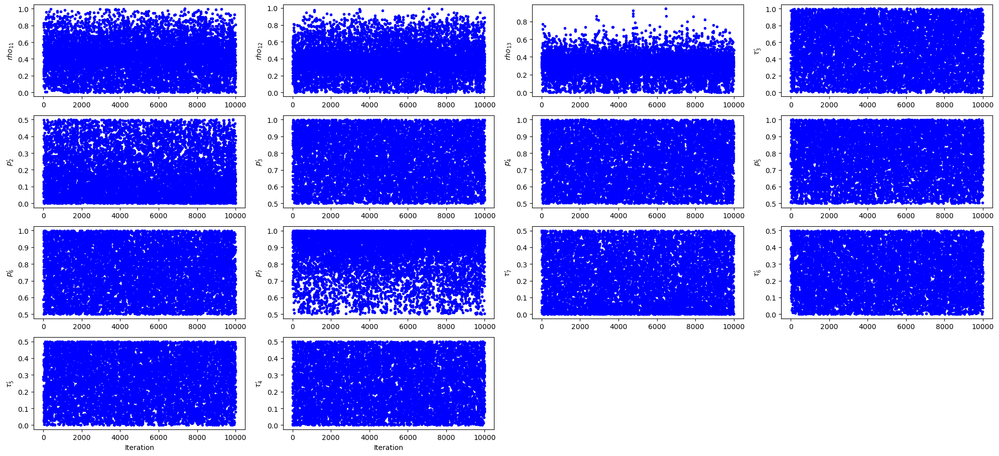

In [83]:
plt.style.use('default') # 'ggplot' Other styles at https://matplotlib.org/3.1.1/gallery/style_sheets/style_sheets_reference.html
plt.figure(facecolor="white")
settings = dict(
    fig=dict(figsize=(20, 10))
)
# Later make this authomatic!!!
NamesParamsParallelChains_2ndWave =[r'$rho_{11}$',r'$rho_{12}$',r'$rho_{13}$',
                                    r"$\tau_3'$",r"$p_2'$",r"$p_3'$",r"$p_4'$",r"$p_5'$",
                                    r"$p_6'$",r"$p_7'$",r"$\tau_7'$",r"$\tau_{6}'$",
                                    r"$\tau_{5}'$",r"$\tau_{4}'$"]

mcp.plot_chain_panel(ConcatenatedExtractedChains_2ndWave,NamesParamsParallelChains_2ndWave, settings,maxpoints=2000000)
plt.savefig('./Results_Sweden/Sweden_Parallel8CutChains_1D_2ndWave.png')
# One can save the figure directly on computer as a pdf (or any other format), just uncomment the following
# pdf quality is better, but reduce the number of points in plot (maxpoints above) 
# otherwise too heavy and slow to visualize!!!
# plt.savefig('./Results/MCMC_2ndWave/Chains_1D_2ndWave_2ndWave.pdf')

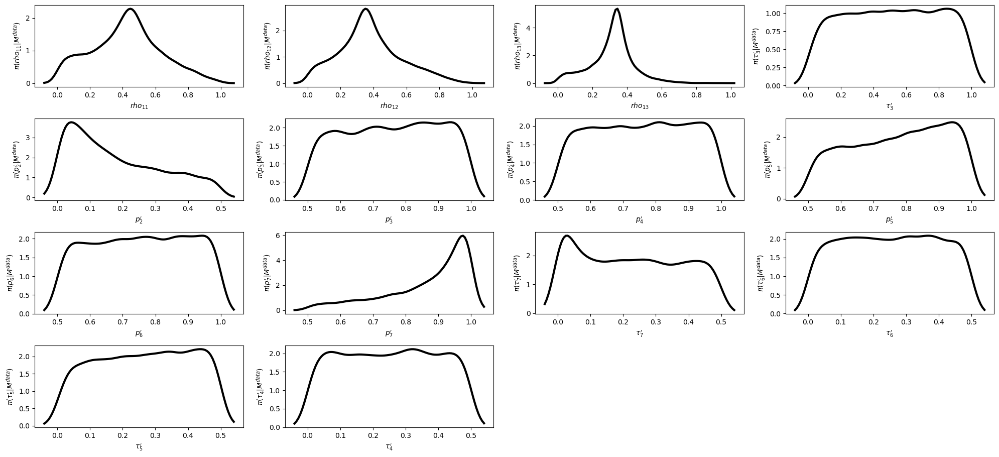

In [84]:
mcp.plot_density_panel(ConcatenatedExtractedChains_2ndWave,NamesParamsParallelChains_2ndWave, settings)
plt.savefig('./Results_Sweden/Sweden_Parallel8CutChains_Posteriors_1D_2ndWave'+FileFormatOfFigures)

<Figure size 640x480 with 0 Axes>

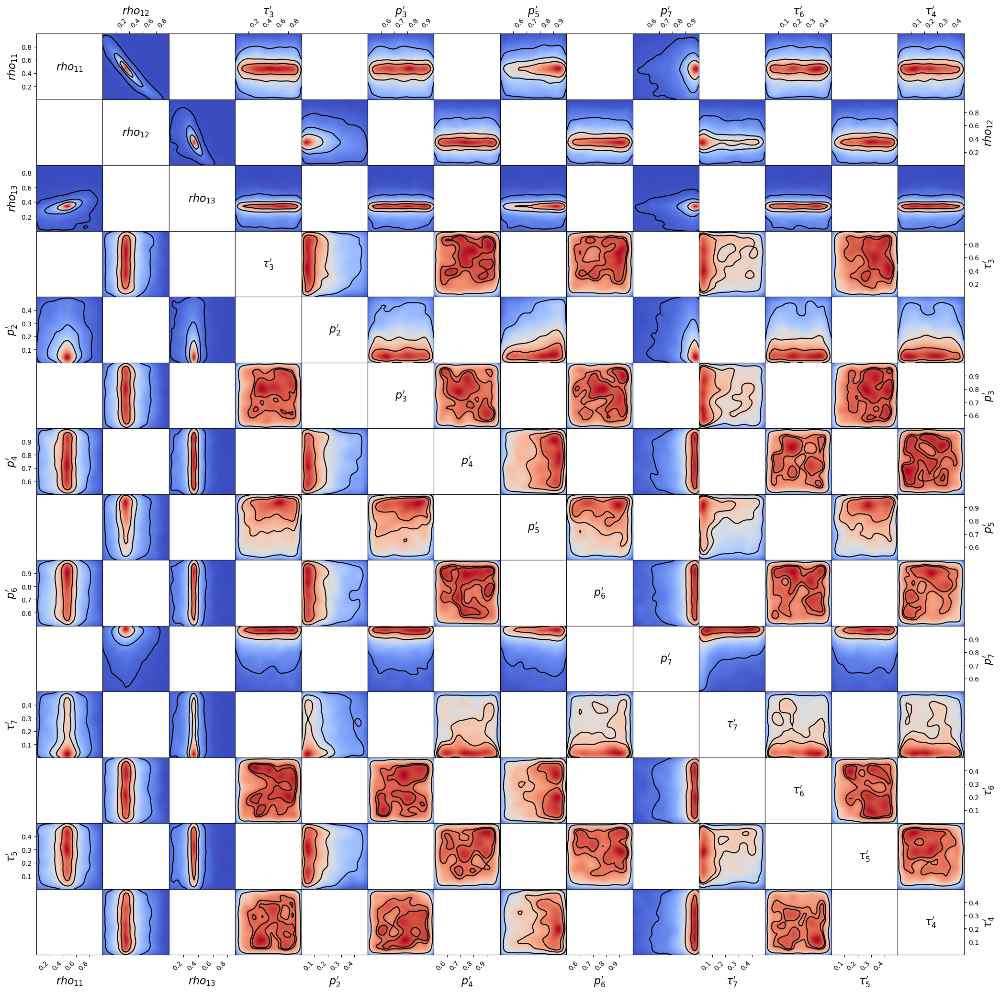

In [99]:
Plot_Multiple_2D_Densities(ConcatenatedExtractedChains_2ndWave, NamesParamsParallelChains_2ndWave, 
                           FileNameForSaving='./Results_Sweden/Sweden_Parallel8CutChains_Posteriors_2D_2ndWave' + FileFormatOfFigures)

In [89]:
###################################################
### PLOT RHOs FROM MCMC WITH CREDIBLE INTERVALS ###
###################################################

Computing max of posteriors for each given parameter...
0.4829455444430804
0.601778907534104
0.5798157912661175
0.629243851743766
0.0943192849115042
0.718518015426125
0.12180927151131718
0.12737437729333878
0.5115409361367182
0.11406558581252804
Computing max of posteriors for each given parameter...
0.4465647494792073
0.35347864065804346
0.3417647097255452


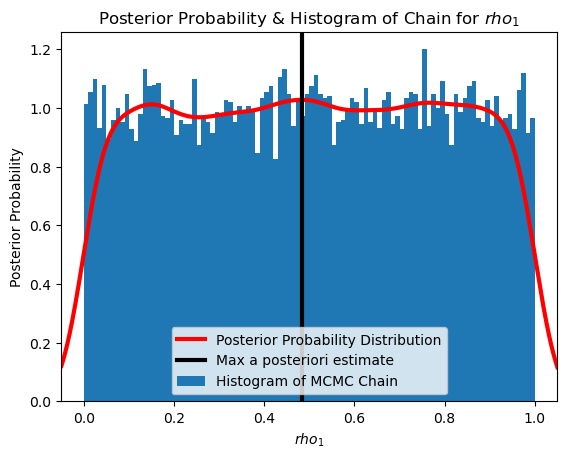

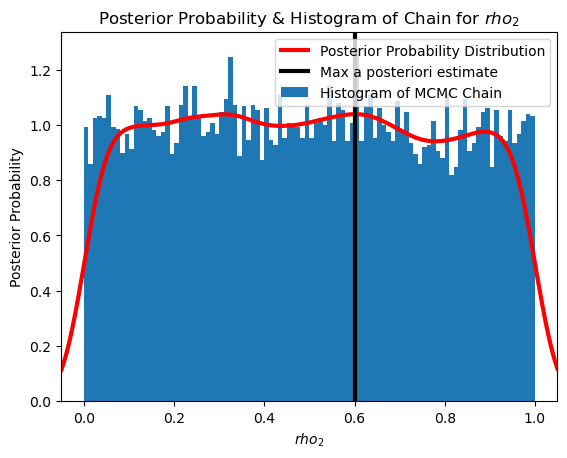

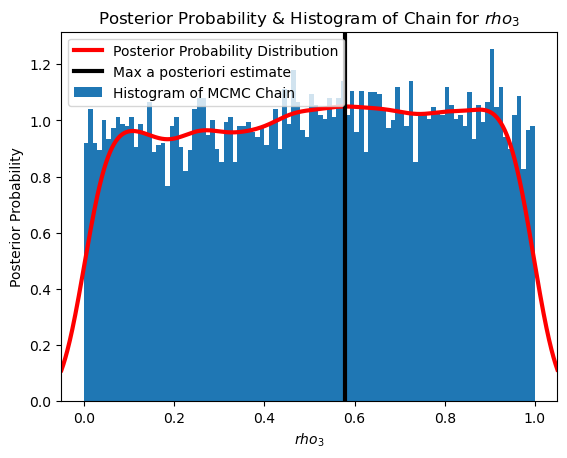

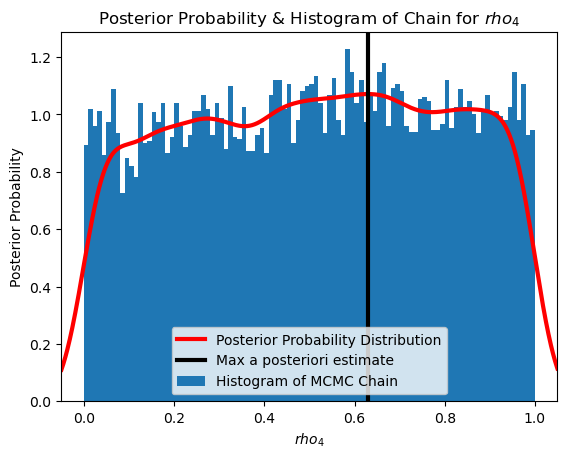

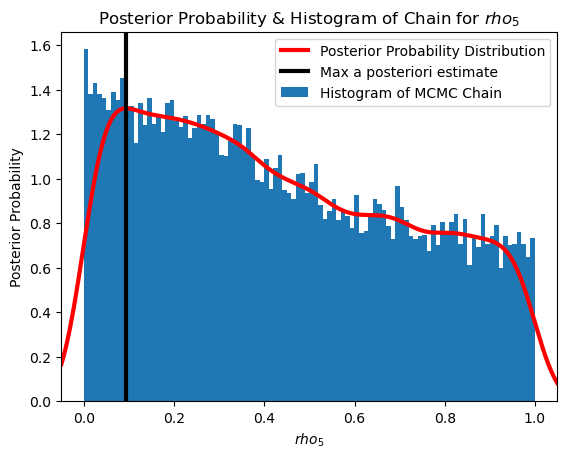

...

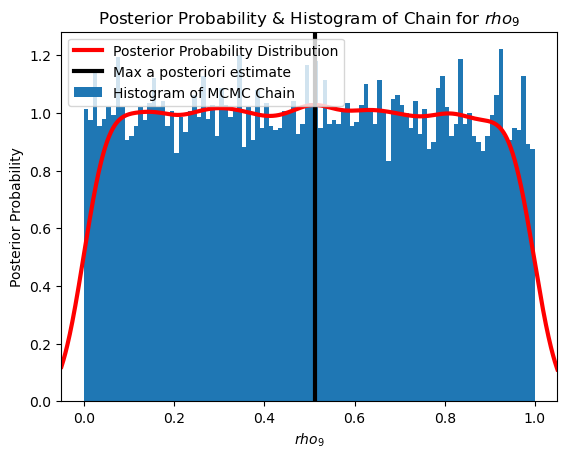

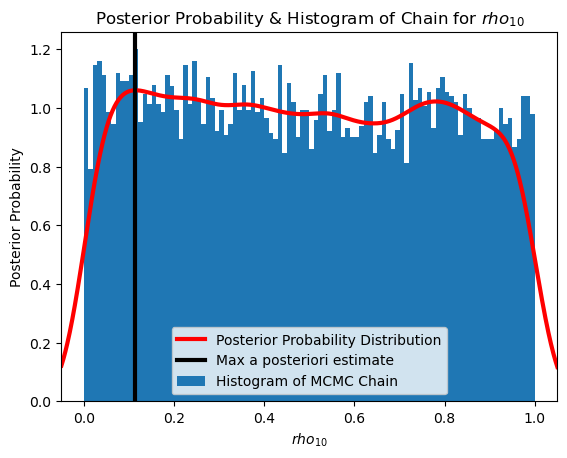

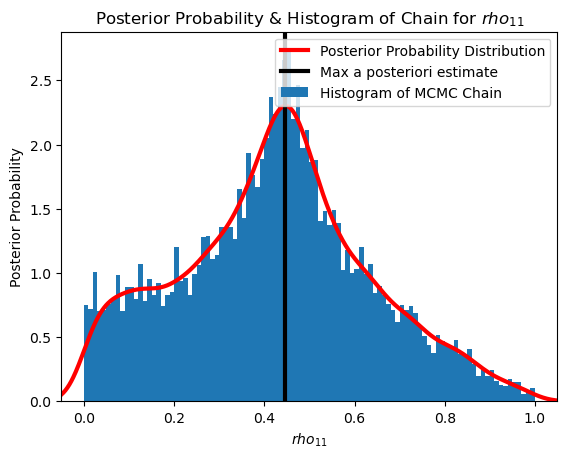

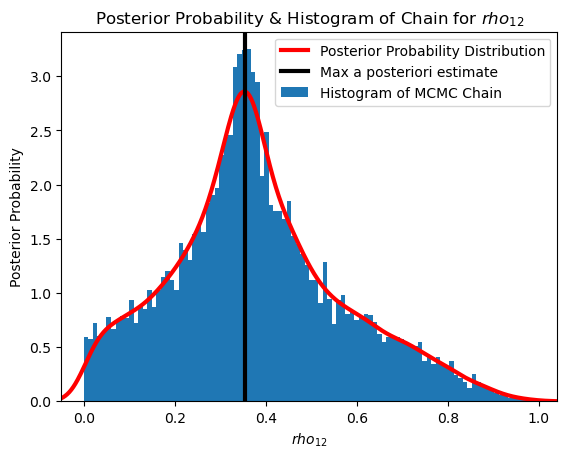

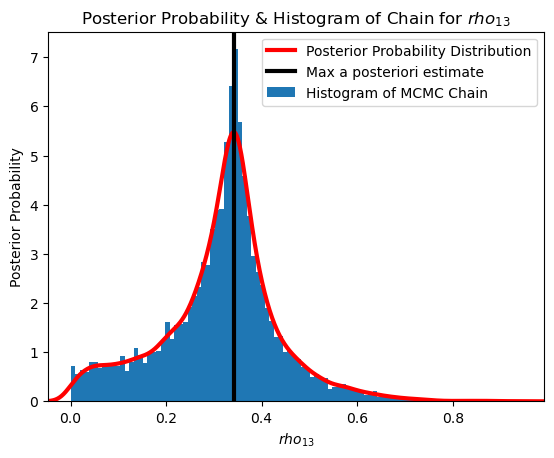

In [85]:
######################################################################
##### LET'S GET MEAN VALUES OF RHOS FROM POSTERIOR DISTRIBUTIONS #####
######################################################################

def GetMeansPosteriorSelectedParams(ListOfRhosNames,Chains,Names):
    ListOfRhos_MCMC_Mean_ThisWave = []
    for name_this_rho in ListOfRhosNames:
        Index_this_rho = Names.index(name_this_rho)
        Chain_this_rho = Chains[:,Index_this_rho]
        Mean_this_chain = statistics.mean(Chain_this_rho)
        ListOfRhos_MCMC_Mean_ThisWave.append(Mean_this_chain)
    return ListOfRhos_MCMC_Mean_ThisWave
    
ListOfRhosNames_1stWave = [r'$rho_1$',r'$rho_2$',r'$rho_3$',r'$rho_4$',r'$rho_5$',r'$rho_6$','$rho_7$','$rho_8$','$rho_9$','$rho_{10}$']
ListOfRhosNames_2ndWave = ['$rho_{11}$','$rho_{12}$','$rho_{13}$']

ListOfMeansRhosMCMC_1stWave = GetMeansPosteriorSelectedParams(ListOfRhosNames_1stWave,
                                                              ConcatenatedExtractedChains,
                                                              NamesParamsParallelChains)
ListOfMeansRhosMCMC_2ndWave = GetMeansPosteriorSelectedParams(ListOfRhosNames_2ndWave,
                                                              ConcatenatedExtractedChains_2ndWave,
                                                              NamesParamsParallelChains_2ndWave)
    
# Put here the values of rho coming from Means of MCMC
ListOfRhos_MCMC_MeansPosteriors = [1] + ListOfMeansRhosMCMC_1stWave + ListOfMeansRhosMCMC_2ndWave
# [1,0.5655,0.1973,0.2287,0.1453,0.5082,0.5188,0.3115,0.2229,0.3760,0.3234,0.5433,0.2842]

############################################################################
##### NOW LET'S GET THE MAX VALUES OF DISTRIBUTIONS VIA A GAUSSIAN KDE #####
############################################################################

def PosteriorsWithMaxFromHisto(ListOfRhosNames,Chains,Names):

    ListIndexesOfParams = []
    for name_this_rho in ListOfRhosNames:
        Index_this_rho = Names.index(name_this_rho)
        ListIndexesOfParams.append(Index_this_rho)
    
    ListOfMaxPosteriorsValues = []
    ListOfKDEs = []
    ListOfPosteriorValuesOnGrid = []
    ListOfGrids = []
    
    print("Computing max of posteriors for each given parameter...")
    for i in ListIndexesOfParams:
        plt.figure(facecolor="white")
        plt.hist(Chains[:,i], density=True, bins=100, label="Histogram of MCMC Chain")
        mn, mx = plt.xlim()
        plt.xlim(mn, mx)
        kde_xs = np.linspace(mn, mx, 1000)
        kde = st.gaussian_kde(Chains[:,i])
        plt.plot(kde_xs,kde.pdf(kde_xs),label="Posterior Probability Distribution",linewidth=3,color='red')
        plt.ylabel('Posterior Probability')
        plt.xlabel(Names[i])
        plt.title("Posterior Probability & Histogram of Chain for " + str(Names[i]));
        posterior=list(kde.pdf(kde_xs))
        a=posterior.index(max(posterior))
        plt.axvline(x=kde_xs[a],linewidth=3,color='black',label='Max a posteriori estimate')
        plt.legend(loc="best")
        print(kde_xs[a])
        ListOfMaxPosteriorsValues.append(kde_xs[a])
        ListOfKDEs.append(kde)
        ListOfPosteriorValuesOnGrid.append(posterior)
        ListOfGrids.append(kde_xs)

    return ListOfMaxPosteriorsValues, ListOfKDEs, ListOfPosteriorValuesOnGrid, ListOfGrids

ListOfMaxPosteriorsValues_1stWave, ListOfKDEs_1stWave,ListOfPosteriorValuesOnGrid_1stWave, ListOfGrids_1stWave = PosteriorsWithMaxFromHisto(ListOfRhosNames_1stWave,
                                                                                   ConcatenatedExtractedChains,
                                                                                   NamesParamsParallelChains)
ListOfMaxPosteriorsValues_2ndWave, ListOfKDEs_2ndWave,ListOfPosteriorValuesOnGrid_2ndWave, ListOfGrids_2ndWave = PosteriorsWithMaxFromHisto(ListOfRhosNames_2ndWave,
                                                                                   ConcatenatedExtractedChains_2ndWave,
                                                                                   NamesParamsParallelChains_2ndWave)

# Put here the values of rho coming from Max of MCMC Posterior
ListOfRhos_MCMC_MaxsPosterior = [1] + ListOfMaxPosteriorsValues_1stWave + ListOfMaxPosteriorsValues_2ndWave




In [86]:

#############################################################
#####  NOW LET'S GET THE 50% and 90% CONFIDENCE BANDS   #####
#############################################################

    # IF TOO SLOW, REDUCE THE NUMBER OF Y VALUES FROM 1000 TO 200 OR 100 OR SO, 
    # IT IS GOING TO BE SLIGHTLY LESS PRECISE BUT MUCH FASTER

def ExtractConfidenceIntervalsFromPosteriors(ListOfGrids, ListOfPosteriorValuesOnGrid, ListOfKDEs, Names):

    MyListOfRhos_MCMC_Lower50 = []
    MyListOfRhos_MCMC_Upper50 = []
    MyListOfRhos_MCMC_Lower90 = []
    MyListOfRhos_MCMC_Upper90 = []

    for IndexMain in np.arange(len(Names)):
        xGrid = ListOfGrids[IndexMain]
        # Create y grid
        MyPosterior = ListOfPosteriorValuesOnGrid[IndexMain]
        yGrid = np.linspace(max(MyPosterior), 0, 1000)
        Found50Perc = False
        Found90Perc = False
        for this_y in yGrid:
            IndexesOfPeak = [MyPosterior >= this_y]
            XsOfPeak = xGrid[IndexesOfPeak[0]]
            xMin = min(XsOfPeak)
            xMax = max(XsOfPeak)
            Integral = ListOfKDEs[IndexMain].integrate_box_1d(xMin, xMax)
            if Found50Perc == False:
                if Integral >= 0.5:
                    print("50% Interval found!!!")
                    Found50Perc = True
                    xMin_50 = xMin
                    xMax_50 = xMax
            elif Found50Perc == True and Found90Perc == False:
                if Integral >= 0.9:
                    print("90% Interval found!!!")
                    Found90Perc = True
                    xMin_90 = xMin
                    xMax_90 = xMax
                    break      
        print()
        print("Min and Max of parameter " + Names[IndexMain] + " for 50% Confidence Interval are: ")
        print(xMin_50)
        print(xMax_50)
        print("Min and Max of parameter " + Names[IndexMain] + " for 90% Confidence Interval are: ")
        print(xMin_90)
        print(xMax_90)
        print()

        MyListOfRhos_MCMC_Lower50.append(xMin_50)
        MyListOfRhos_MCMC_Upper50.append(xMax_50)
        MyListOfRhos_MCMC_Lower90.append(xMin_90)
        MyListOfRhos_MCMC_Upper90.append(xMax_90)
    
    return MyListOfRhos_MCMC_Lower50, MyListOfRhos_MCMC_Upper50, MyListOfRhos_MCMC_Lower90, MyListOfRhos_MCMC_Upper90

ListOfRhos_MCMC_Lower50_1stWave, ListOfRhos_MCMC_Upper50_1stWave, ListOfRhos_MCMC_Lower90_1stWave, ListOfRhos_MCMC_Upper90_1stWave = ExtractConfidenceIntervalsFromPosteriors(ListOfGrids_1stWave,
ListOfPosteriorValuesOnGrid_1stWave,
ListOfKDEs_1stWave,
ListOfRhosNames_1stWave)

ListOfRhos_MCMC_Lower50_2ndWave, ListOfRhos_MCMC_Upper50_2ndWave, ListOfRhos_MCMC_Lower90_2ndWave, ListOfRhos_MCMC_Upper90_2ndWave = ExtractConfidenceIntervalsFromPosteriors(ListOfGrids_2ndWave,
ListOfPosteriorValuesOnGrid_2ndWave,
ListOfKDEs_2ndWave,
ListOfRhosNames_2ndWave)

ListOfRhos_MCMC_Lower50 = [1] + ListOfRhos_MCMC_Lower50_1stWave + ListOfRhos_MCMC_Lower50_2ndWave
ListOfRhos_MCMC_Upper50 = [1] + ListOfRhos_MCMC_Upper50_1stWave + ListOfRhos_MCMC_Upper50_2ndWave

ListOfRhos_MCMC_Lower90 = [1] + ListOfRhos_MCMC_Lower90_1stWave + ListOfRhos_MCMC_Lower90_2ndWave
ListOfRhos_MCMC_Upper90 = [1] + ListOfRhos_MCMC_Upper90_1stWave + ListOfRhos_MCMC_Upper90_2ndWave

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_1$ for 50% Confidence Interval are: 
0.14162540551488878
0.8264677487837119
Min and Max of parameter $rho_1$ for 90% Confidence Interval are: 
0.046936592779971115
0.9530865099990088

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_2$ for 50% Confidence Interval are: 
0.18126101460668226
0.6733329992625919
Min and Max of parameter $rho_2$ for 90% Confidence Interval are: 
0.046959488593212514
0.951843540913476

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_3$ for 50% Confidence Interval are: 
0.43448266817830616
0.917825403296103
Min and Max of parameter $rho_3$ for 90% Confidence Interval are: 
0.051331707310439866
0.9552596925762967

50% Interval found!!!
90% Interval found!!!

Min and Max of parameter $rho_4$ for 50% Confidence Interval are: 
0.4211886342567014
0.9044491658800948
Min and Max of parameter $rho_4$ for 90% Confidence Interval are: 
0.056816

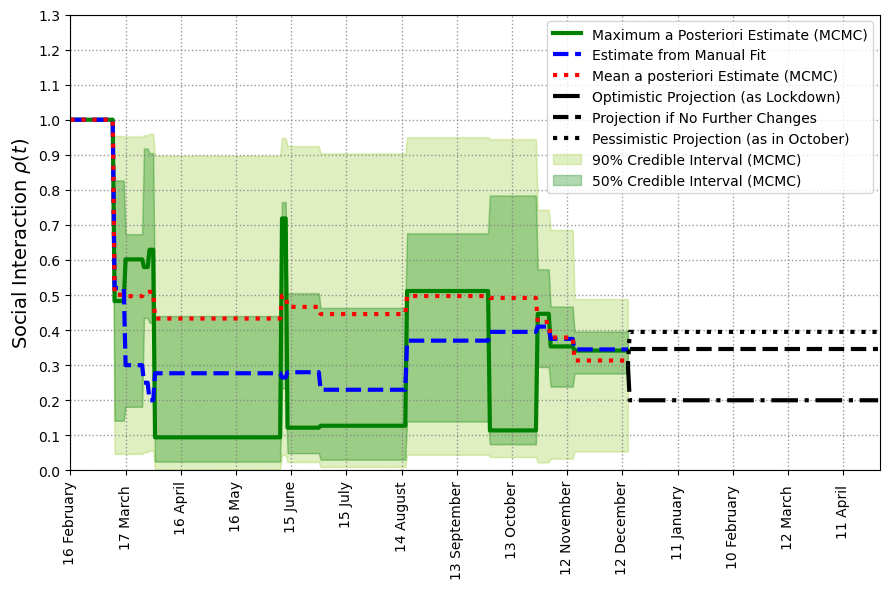

In [87]:
###############################
#####  NOW LET'S PLOT IT  #####
###############################

plt.figure(figsize=(9, 6),facecolor="white")

stop = NumberDaysData # Remember to stop this at the data points used for mcmc

#times=np.arange(0,endofplot+1,1) 
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Upper90)[0:stop],'-',color='yellowgreen', alpha=0.05)#,label='Data')
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Lower90)[0:stop],'-',color='yellowgreen', alpha=0.05)#,label='Data')
plt.fill_between(times[0:stop], rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Upper90)[0:stop], 
                 rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Lower90)[0:stop],color='yellowgreen', alpha=0.3,label=r'90% Credible Interval (MCMC)')
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Upper50)[0:stop],'-',color='green', alpha=0.05)#,label='Data')
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Lower50)[0:stop],'-',color='green', alpha=0.05)#,label='Data')
plt.fill_between(times[0:stop], rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Upper50)[0:stop], 
                 rhoAsFunctionforSweden(times,ListOfRhos_MCMC_Lower50)[0:stop],color='green', alpha=0.3,label='50% Credible Interval (MCMC)')
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_MaxsPosterior)[0:stop],'-',color='green',linewidth=3,label='Maximum a Posteriori Estimate (MCMC)')
ListOfRhosBestFit = ListOfRhos
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhosBestFit)[0:stop],'--',color='blue',linewidth=3,label='Estimate from Manual Fit')
plt.plot(times[0:stop],rhoAsFunctionforSweden(times,ListOfRhos_MCMC_MeansPosteriors)[0:stop],':',color='red',linewidth=3,label='Mean a posteriori Estimate (MCMC)')

ListOptimistic = Rho_BestScenario*np.ones(len(times))[stop:-1]
ListPessimistic = Rho_WorstScenario*np.ones(len(times))[stop:-1]

ListOptimistic = [ListOfRhos[-1]] + list(ListOptimistic)
ListPessimistic = [ListOfRhos[-1]] + list(ListPessimistic)

plt.plot(times[stop-1:-1],ListOptimistic,'-.',color='black',linewidth=3,label='Optimistic Projection (as Lockdown)')
plt.plot(times[stop:-1],rhoAsFunctionforSweden(times,ListOfRhos_ManualFit_1stWave[0:-1])[stop:-1],'--',color='black',linewidth=3,label='Projection if No Further Changes')
plt.plot(times[stop-1:-1],ListPessimistic,':',color='black',linewidth=3,label='Pessimistic Projection (as in October)')

#plt.title('Sweden')

#locs, labels = plt.xticks()
#times=np.arange(0,endofplot+1,1)
#only10thindex=np.arange(0,endofplot+1,10)
#plt.xticks(times[only10thindex])
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.yticks(np.arange(0,1.31,0.1))

plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time(days)")
plt.ylabel(r"Social Interaction $\rho\left(t\right)$",size=14)

plt.ylim(0,1.3)
plt.xlim(0,endofplot)

plt.tight_layout()
plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.savefig('./Results_Sweden/ParallelMCMC_RHOsAllEstimates' + FileFormatOfFigures)

0
0.4829455444430804
0.500711359415164
[0.3926 0.8858]
[0.0019 0.9001]
1
0.601778907534104
0.496812522043243
[0.2085 0.6959]
[0.0205 0.9178]
2
0.5798157912661175
0.508065105217428
[0.4533 0.9321]
[0.0345 0.9286]
3
0.629243851743766
0.509255563017743
[0.4134 0.8923]
[0.1062 0.9983]
4
0.0943192849115042
0.43298453902725287
[0.0005 0.3948]
[1.0341e-04 8.6151e-01]
5
0.718518015426125
0.497948066142849
[0.3238 0.8168]
[0.0176 0.9118]
6
0.12180927151131718
0.46626773128059923
[0.0057 0.4521]
[4.3702e-05 8.7905e-01]
7
0.12737437729333878
0.445789874959963
[0.0011 0.4159]
[1.5210e-04 8.6469e-01]
8
0.5115409361367182
0.4972530338882585
[0.2355 0.7294]
[0.036 0.933]
9
0.11406558581252804
0.4917087322013631
[0.0184 0.5047]
[0.0038 0.8986]
10
0.06013176298880777
0.4329419094060332
[2.5231e-05 4.0257e-01]
[2.5231e-05 8.7076e-01]
11
0.1906221662294723
0.5486460926108777
[0.0009 0.4544]
[9.3404e-07 1.1473e+00]
12
0.8262392900858448
0.7502625566253552
[0.6818 0.9248]
[0.5065 0.9534]
13
0.1021991513839

/Users/stefano.magni/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


0.8605504407002192
0.5679515875353297
[0.5878 0.9998]
[0.178  0.9999]
21
0.44439438435779177
0.5065263083173667
[0.422  0.9084]
[0.0516 0.9406]
22
0.05924025239234493
0.2484072793471171
[3.3978e-05 2.4859e-01]
[1.1251e-05 4.4909e-01]
23
0.13080053729260727
0.2503626124622625
[0.1029 0.3431]
[0.0414 0.4866]
24
0.22218947611451245
0.2530411815903088
[0.1391 0.3822]
[0.0489 0.4931]
25
0.14514027129867002
0.25108720853832567
[0.0813 0.3252]
[0.0493 0.4937]
0
0.4465647494792073
0.4233352747018636
[0.2981 0.5696]
[0.0013 0.7081]
1
0.35347864065804346
0.37902122819442546
[0.242  0.4637]
[0.012  0.6557]
2
0.3417647097255452
0.3134082049639999
[0.2805 0.3937]
[0.0637 0.4946]
3
0.8495584465208473
0.5134681562969159
[0.474  0.9524]
[0.0986 0.9785]
4
0.041067563485008604
0.18086701196912428
[1.0322e-05 1.4538e-01]
[1.0322e-05 4.0067e-01]
5
0.9391174384697268
0.7577511349037827
[0.7569 0.9949]
[0.5499 0.9953]
6
0.8102094621952498
0.7550586407272534
[0.7445 0.9855]
[0.5442 0.9899]
7
0.94240844009022

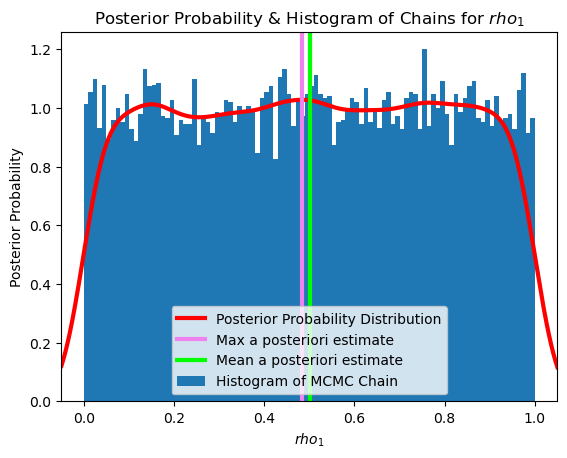

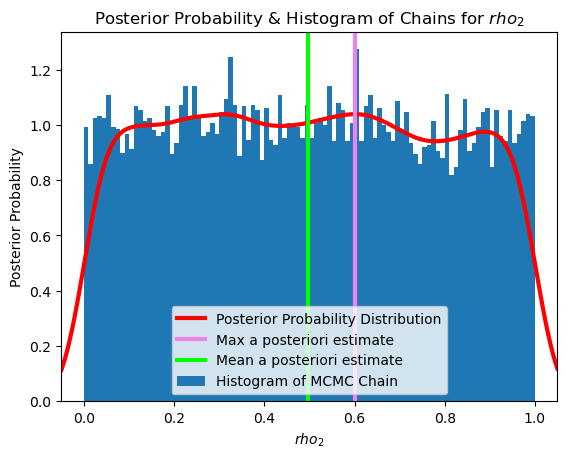

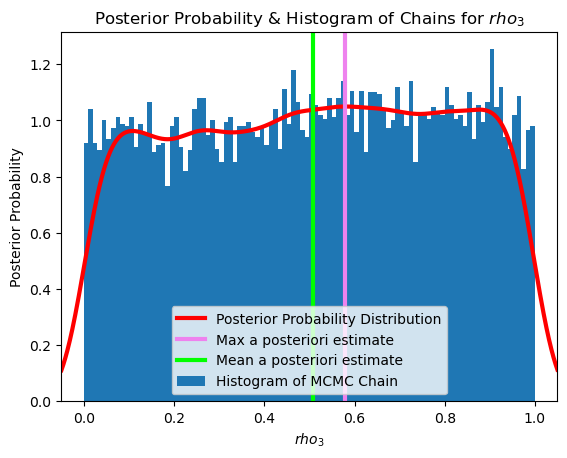

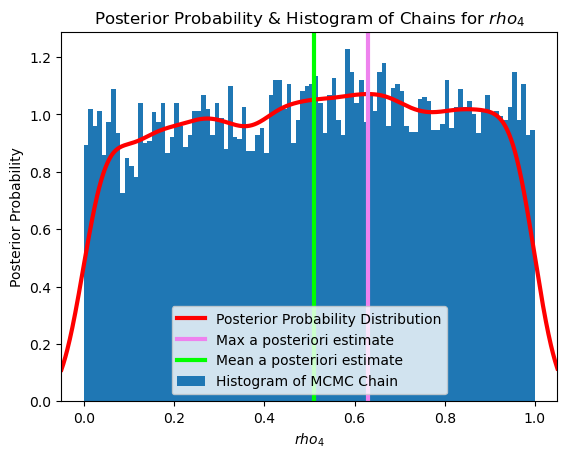

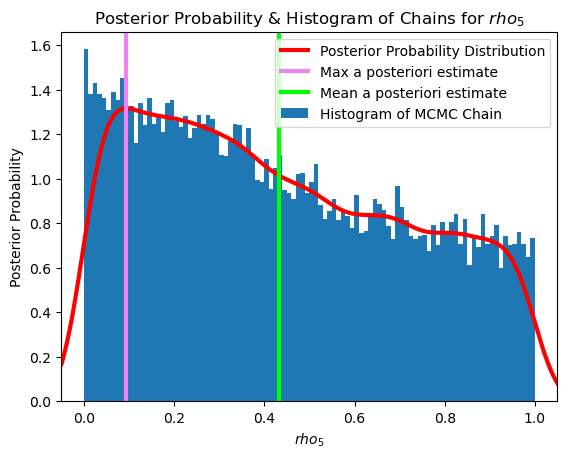

...

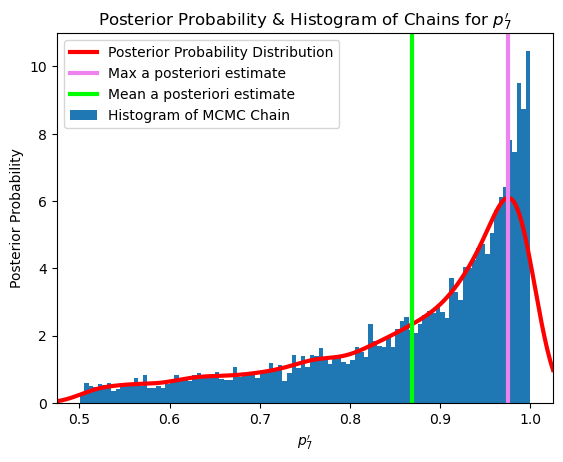

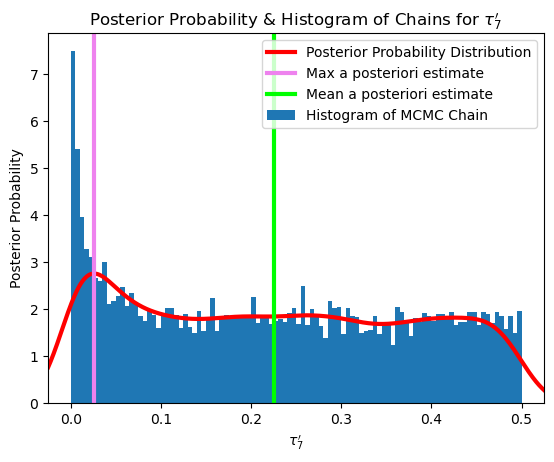

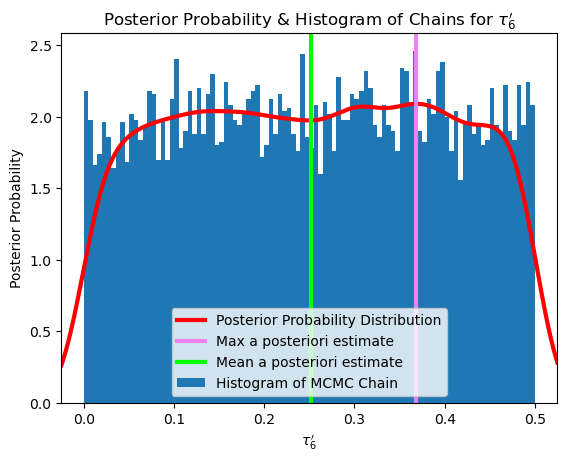

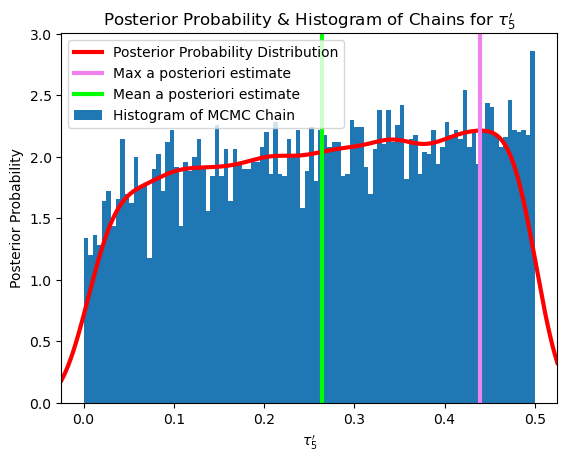

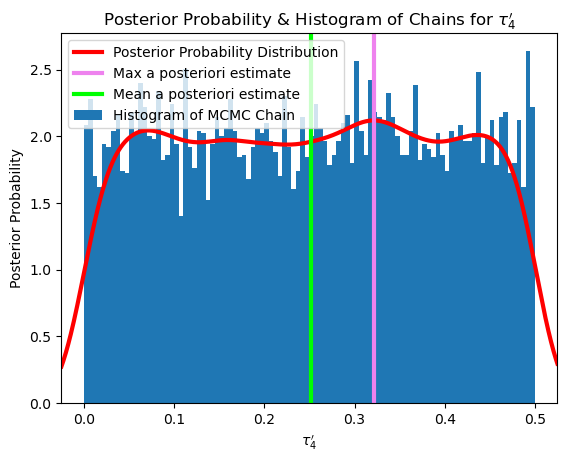

In [88]:
### 6) Plot Posterior Estimates of Parameters

# RUN THIS ONLY IF YOU DO NOT HAVE ALREADY IONSTALLED THE PYMC3 PYTHON PACKAGE
#import sys
#!conda install --yes --prefix {sys.prefix} pymc3

##### Example CREDIBLE INTERVAL 1D #####
#CredibleInterval_50 = pymc3.stats.hpd(MyChain,credible_interval=0.5)### 50% Credible Intervals ###
#CredibleInterval_90 = pymc3.stats.hpd(MyChain,credible_interval=0.9)### 90% Credible Intervals ###
#CredibleInterval_95 = pymc3.stats.hpd(MyChain,credible_interval=0.95)### 95% Credible Intervals ###
#CredibleInterval_99 = pymc3.stats.hpd(MyChain,credible_interval=0.99)### 99% Credible Intervals ###

### 1) Get Chains

AllWavesChains = [ConcatenatedExtractedChains, ConcatenatedExtractedChains_2ndWave]
AllWavesNames = [NamesParamsParallelChains, NamesParamsParallelChains_2ndWave]

ListOfListsOfMaxs = []
ListOfListsMeans = []
ListOfListsCredibleIntervals50 = []
ListOfListsCredibleIntervals90 = []

for i_Wave in [0,1]:

    MyChains = AllWavesChains[i_Wave]
    MyParNames = AllWavesNames[i_Wave]

    ### 2) Get Max and Mean a Posteriori Estimate of each parameter 

    ListOfMaxs = []
    ListOfMeans = []
    ListOfCredibleIntervals50 = []
    ListOfCredibleIntervals90 = []

    for i in np.arange(0,len(MyParNames),1):
        print(i)
        plt.figure(facecolor="white")
        Chains1Par = MyChains[:,i]
        Name1Par = MyParNames[i]

        plt.hist(Chains1Par, density=True, bins=100, label="Histogram of MCMC Chain")

        mn, mx = plt.xlim()
        plt.xlim(mn, mx)
        kde_xs = np.linspace(mn, mx, 1000)
        kde = st.gaussian_kde(Chains1Par)

        plt.plot(kde_xs,kde.pdf(kde_xs),label="Posterior Probability Distribution",linewidth=3,color='red')

        plt.xlabel(Name1Par)
        plt.ylabel('Posterior Probability')
        plt.title("Posterior Probability & Histogram of Chains for " + str(Name1Par))

        posterior=list(kde.pdf(kde_xs))
        a=posterior.index(max(posterior))

        plt.axvline(x=kde_xs[a],linewidth=3,color='violet',label='Max a posteriori estimate')
        plt.axvline(x=statistics.mean(Chains1Par),linewidth=3,color='lime',label='Mean a posteriori estimate')

        plt.legend(loc="best")

        # 2.1) Max a Posteriori Estimate
        MaxEstimate = kde_xs[a]
        print(MaxEstimate)

        # 2.2) Mean a Posteriori Estimate
        MeanEstimate = statistics.mean(Chains1Par)
        print(MeanEstimate)

        # 2.3) 50% Credible Interval
        CredibleInterval_50 = pymc3.stats.hpd(Chains1Par,credible_interval=0.5)
        print(CredibleInterval_50)

        # 2.4) 90% Credible Interval
        CredibleInterval_90 = pymc3.stats.hpd(Chains1Par,credible_interval=0.9)
        print(CredibleInterval_90)

        ListOfMaxs.append(MaxEstimate)
        ListOfMeans.append(MeanEstimate)
        ListOfCredibleIntervals50.append(CredibleInterval_50)
        ListOfCredibleIntervals90.append(CredibleInterval_90)

    ListOfListsOfMaxs.append(ListOfMaxs)
    ListOfListsMeans.append(ListOfMeans)
    ListOfListsCredibleIntervals50.append(ListOfCredibleIntervals50)
    ListOfListsCredibleIntervals90.append(ListOfCredibleIntervals90)



In [89]:
ListOfRhos_ManualFit_1stWave

[1,
 0.5200,
 0.3000,
 0.2500,
 0.2000,
 0.2770,
 0.2650,
 0.2800,
 0.2300,
 0.3700,
 0.3950,
 0.4100,
 0.3750,
 0.3450,
 0.3000]

In [90]:

ListOfIndecesNewOrder = [0,1,2,3,4,5,6,7,8,10,11,12,16,15,14,13]
#ListOfIndecesNewOrder = [0,1,2,3,4,5,6,7,8,10,11,12,19,17,18,15,16,13,14]

# We specify the order of eleements to take because we need to reorder the parameters as MCMC, in param set they were:
# 0 alpha, 
# 1 beta, 
# 2 p2max, 
# 3 p2min, 
# 4 p3, 
# 5 p4, 
# 6 p5, 
# 7 p6, 
# 8 p7, 
# 9 p9,
# 10 tau1,
# 11 tau2,
# 12 tau3,
# 13 tau4,
#### 14 tau4die,
# 14 <- 15 tau5,
#### 16 tau5die,
# 15 <- 17 tau6,
#### 18 tau6die,
# 16 <- 19 tau7,
# 17 <- 20 tau8,
# 18 <- 21 tau9,

ListOfIndecesNewOrder_2ndWave = [26,19,20,21,22,23,24,30,29,28,27]
# 19 <- 22 p2prim,
# 20 <- 23 p3prim,
# 21 <- 24 p4prim,
# 22 <- 25 p5prim,
# 23 <- 26 p6prim,
# 24 <- 27 p7prim,
# 25 <- 28 p9prim,
# 26 <- 29 tau3prim,
# 27 <- 30 tau4surprim,
#### 31 tau4dieprim,
# 28 <- 32 tau5surprim,
#### 33 tau5dieprim,
# 29 <- 34 tau6surprim,
#### 35 tau6dieprim,
# 30 <- 36 tau7prim,
# 31 <- 37 tau8prim,
# 32 <- 38 tau9prim

Params1stWaveManual = np.array(list(ListOfRhos_ManualFit_1stWave[1:11]) 
                               + list(ListOfParametersfirstwave[ListOfIndecesNewOrder]))
            
Params2ndWaveManual = np.array(list(ListOfRhos_ManualFit_1stWave[11:14]) 
                               + list(ListOfParametersfirstwave[ListOfIndecesNewOrder_2ndWave]))

#Params1stWaveAutomated = np.array(list(ListOfRhos_AutomatedFit_1stWave[1:7]) 
#                                + list(ListOfParametersfirstwavefit[ListOfIndecesNewOrder]))
            
#Params2ndWaveAutomated = np.array(list(ListOfRhos_AutomatedFit_1stWave[7::]) 
#                               + list(ListOfParametersfirstwavefit[ListOfIndecesNewOrder_2ndWave]))

ListParamsManual = [Params1stWaveManual,Params2ndWaveManual]
#ListParamsAutomated = [Params1stWaveAutomated,Params2ndWaveAutomated]

ListLow_1stW = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0.5,0,0.5,0.5,0.5,0.5,0.5,0,0,0,0,0,0,0])
ListLowErr_1stW = ListLow_1stW - ListLow_1stW
ListHigh_1stW = np.array([1,1,1,1,1,1,1,1,1,1,1,2,1,0.5,1,1,1,1,1,1,1,1,0.5,0.5,0.5,0.5])
ListHighErr_1stW = ListHigh_1stW - ListLow_1stW
Priors_1stW = np.transpose(np.column_stack((ListLowErr_1stW,ListHighErr_1stW)))

ListLow_2ndW = np.array([0,0,0,0,0,0.5,0.5,0.5,0.5,0.5,0,0,0,0])
ListLowErr_2ndW = ListLow_2ndW - ListLow_2ndW
ListHigh_2ndW = np.array([1,1,1,1,0.5,1,1,1,1,1,0.5,0.5,0.5,0.5])
ListHighErr_2ndW = ListHigh_2ndW - ListLow_2ndW
Priors_2ndW = np.transpose(np.column_stack((ListLowErr_2ndW,ListHighErr_2ndW)))

ListListsLow = [ListLow_1stW,ListLow_2ndW]
ListPriors = [Priors_1stW,Priors_2ndW]

(26,)
(2, 26)
(14,)
(2, 14)


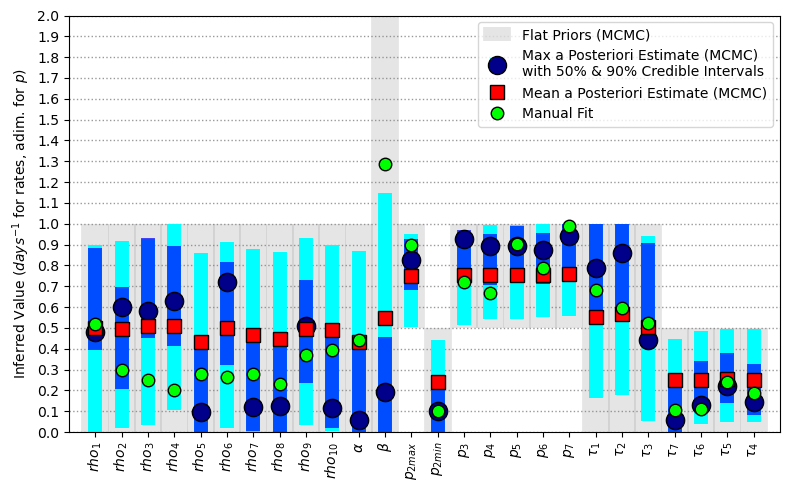

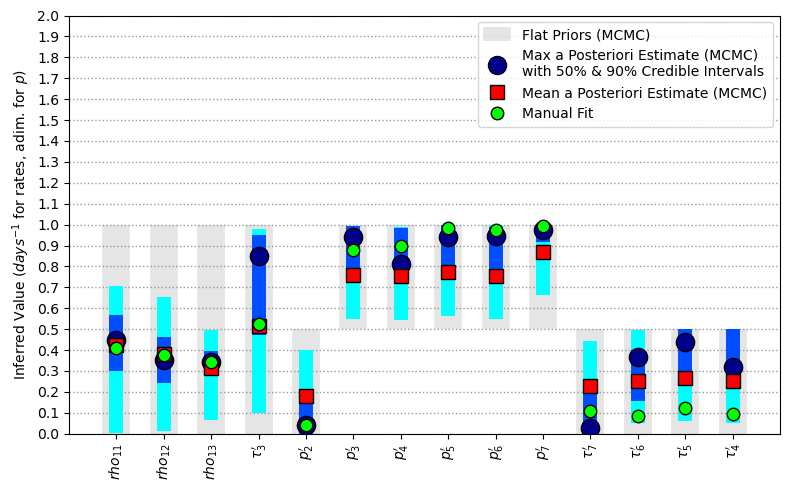

In [97]:
def ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals):
    
    TransposedCredInt = np.transpose(np.array(ListOfCredibleIntervals))
    TransposedCredInt_LowerBounds = TransposedCredInt[0,:]
    TransposedCredInt_UpperBounds = TransposedCredInt[1,:]
    ErrMinus = ListOfMaxs - TransposedCredInt_LowerBounds
    ErrPlus = TransposedCredInt_UpperBounds - ListOfMaxs
    errors = np.transpose(np.column_stack((ErrMinus,ErrPlus)))
    
    return errors

# Loop to iterate over waves (1st, 2nd)
for j in [0,1]:
    
    ListOfMaxs = ListOfListsOfMaxs[j]
    ListOfMeans = ListOfListsMeans[j]
    ListOfCredibleIntervals50 = ListOfListsCredibleIntervals50[j]
    ListOfCredibleIntervals90 = ListOfListsCredibleIntervals90[j]
    MyParNames = AllWavesNames[j]
    ParamsManual = ListParamsManual[j]
    #ParamsAutomated = ListParamsAutomated[j]
    Priors = ListPriors[j]
    ListLow = ListListsLow[j]

    if j==0:
        WhichWave = '1st' 
    elif j==1:
        WhichWave = '2nd'
        
    x = np.arange(1,len(ListOfMaxs)+1,1)
    y = ListOfMaxs

    errors50 = ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals50)
    errors90 = ProduceErrorbarsFromCredibleIntervals(ListOfCredibleIntervals90)

    plt.figure(figsize=(8, 5),facecolor="white")

    print(np.shape(ListLow))
    print(np.shape(Priors))
    
    plt.errorbar(x, ListLow, yerr=Priors, fmt = 'o', ms = 0, color = 'gray', elinewidth = 20, alpha = 0.2, label='Flat Priors (MCMC)')
    plt.errorbar(x, y, yerr=errors90, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'cyan', elinewidth = 10,label='Max a Posteriori Estimate (MCMC)\nwith 50% & 90% Credible Intervals',markeredgecolor='k')
    plt.errorbar(x, y, yerr=errors50, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'blue', elinewidth = 10, alpha = 0.7,markeredgecolor='k')
    plt.errorbar(x, ListOfMeans, yerr=0, fmt = 's', ms=10, markerfacecolor = 'red',color='white',label='Mean a Posteriori Estimate (MCMC)',markeredgecolor='k')
    plt.errorbar(x, ParamsManual, yerr=0, fmt = 'o', ms=9, markerfacecolor = 'lime', color = 'white', label='Manual Fit',markeredgecolor='k')
    #plt.errorbar(x, ParamsAutomated, yerr=0, fmt = '*', ms=10, markerfacecolor = 'gold', color = 'white',label='Automated Fit (scipy.optimize.minimize)',markeredgecolor='k')

    plt.grid(axis='y', color='gray', linestyle=':', linewidth=1, alpha = 0.8)
    #plt.title('Sweden, ' + str(WhichWave) + ' Wave, MCMC Estimate of Paramters')
    plt.legend(loc='upper right', fancybox=True, numpoints=1)

    plt.xlim(0,len(ListOfMaxs)+1)
    plt.ylim(0,2)

    #plt.xlabel('Parameter')
    plt.ylabel('Inferred Value ($days^{-1}$ for rates, adim. for $p$)')

    plt.xticks(x,MyParNames,rotation=90) 
    plt.yticks(np.arange(0,2.1,0.1)) 

    plt.tight_layout()
    plt.savefig('./Results_Sweden/Sweden_ParallelMCMC_ParameterEstimatesPosteriorsPriors_Wave' + str(j+1) + FileFormatOfFigures)
                

In [92]:
def ComputeFoldChange_WithStdError(Chain1ParA,Chain1ParB):
            MeanA = sum(Chain1ParA)/len(Chain1ParA)
            MeanB = sum(Chain1ParB)/len(Chain1ParB)
            StdDevA = np.std(Chain1ParA)
            StdDevB = np.std(Chain1ParB)
            StandardErrorOfTheMeanA = StdDevA / math.sqrt(len(Chain1ParA))
            StandardErrorOfTheMeanB = StdDevB / math.sqrt(len(Chain1ParB))
            RatioMutOnCtrl = MeanB / MeanA
            MyBase = 2
            if RatioMutOnCtrl != 0:
                FoldChangeCurrentParam = math.log(RatioMutOnCtrl, MyBase)
            else:
                FoldChangeCurrentParam = 0
            Temp1 = StandardErrorOfTheMeanA ** 2 / (MeanA ** 2 * math.log(2) ** 2)
            Temp2 = StandardErrorOfTheMeanB ** 2 / (MeanB ** 2 * math.log(2) ** 2)
            STDDEVofFoldChangeCurrentParam = math.sqrt(Temp1 + Temp2)
            return FoldChangeCurrentParam, STDDEVofFoldChangeCurrentParam
        
def ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave):
            RatioMutOnCtrl = ValueParam2ndWave / ValueParam1stWave
            MyBase = 2
            if RatioMutOnCtrl != 0:
                FoldChangeCurrentParam = math.log(RatioMutOnCtrl, MyBase)
            else:
                FoldChangeCurrentParam = 0
            return FoldChangeCurrentParam

In [93]:
# Indeces indicate the parameters as indicated by commented text above

ListOfIndecesNewOrderFC = [4,5,6,7,8,12,16,15,14,13]
ListOfIndecesNewOrder_2ndWaveFC = [20,21,22,23,24,26,30,29,28,27]

ParametersManualFit_1stWave_forFC = ListOfParametersfirstwave[ListOfIndecesNewOrderFC]
ParametersManualFit_2ndWave_forFC = ListOfParametersfirstwave[ListOfIndecesNewOrder_2ndWaveFC]

ListOfFCs_ManualFit = []
for k_param in np.arange(0,len(ParametersManualFit_1stWave_forFC),1):
    ValueParam1stWave = ParametersManualFit_1stWave_forFC[k_param]
    ValueParam2ndWave = ParametersManualFit_2ndWave_forFC[k_param]
    FoldChangeCurrentParam = ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave)
    ListOfFCs_ManualFit.append(FoldChangeCurrentParam)

In [94]:

j_ParamForFC_1stW = [14,15,16,17,18,21,22,23,24,25]
ChainsParameters_1stWave_forFC = np.array(AllWavesChains[0])[:,j_ParamForFC_1stW]
NamesParams1stWave = np.array(AllWavesNames[0])[j_ParamForFC_1stW]

j_ParamForFC_2ndW = [5,6,7,8,9,3,10,11,12,13]
ChainsParameters_2ndWave_forFC = np.array(AllWavesChains[1])[:,j_ParamForFC_2ndW]
NamesParams2ndWave = np.array(AllWavesNames[1])[j_ParamForFC_2ndW]

ListOfFCs_Means = []
ListOfFCs_STDevs = []
for k_param in np.arange(0,len(j_ParamForFC_1stW),1):
    Chain1ParA = ChainsParameters_1stWave_forFC[:,k_param]
    Chain1ParB = ChainsParameters_2ndWave_forFC[:,k_param]
    FoldChangeCurrentParam, STDDEVofFoldChangeCurrentParam = ComputeFoldChange_WithStdError(Chain1ParA,Chain1ParB)
    ListOfFCs_Means.append(FoldChangeCurrentParam)
    ListOfFCs_STDevs.append(STDDEVofFoldChangeCurrentParam)

In [95]:
ParametersMaxes_1stWave_forFC = np.array(ListOfListsOfMaxs[0])[j_ParamForFC_1stW]
ParametersMaxes_2ndWave_forFC = np.array(ListOfListsOfMaxs[1])[j_ParamForFC_2ndW]

ListOfFCs_MaxEstimate = []
for k_param in np.arange(0,len(ParametersMaxes_1stWave_forFC),1):
    ValueParam1stWave = ParametersMaxes_1stWave_forFC[k_param]
    ValueParam2ndWave = ParametersMaxes_2ndWave_forFC[k_param]
    FoldChangeCurrentParam = ComputeFoldChange(ValueParam1stWave,ValueParam2ndWave)
    ListOfFCs_MaxEstimate.append(FoldChangeCurrentParam)

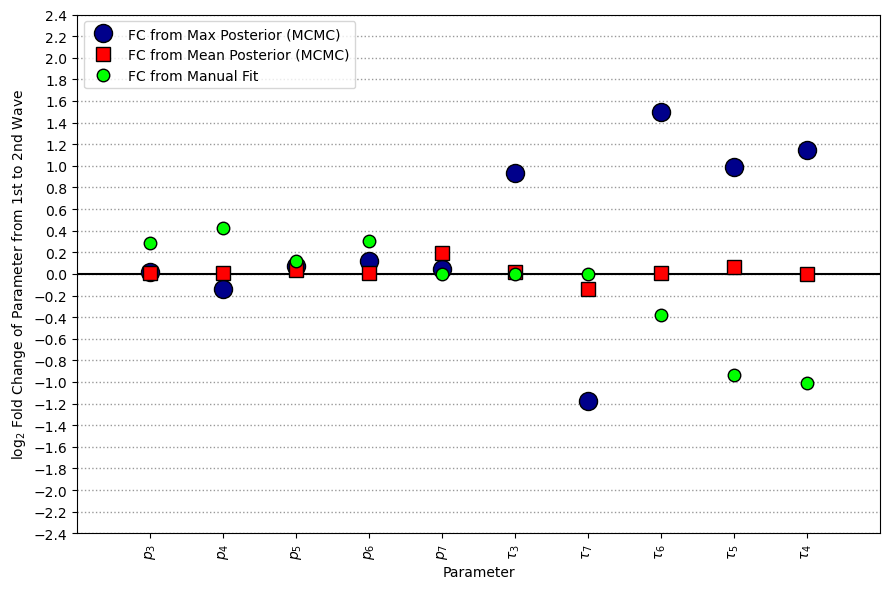

In [96]:
plt.figure(figsize=(9, 6),facecolor="white")

x = np.arange(1,len(NamesParams1stWave)+1,1)

plt.errorbar(x, ListOfFCs_MaxEstimate, yerr=0, fmt = 'o', ms = 13, markerfacecolor = 'darkblue', color = 'white', elinewidth = 2,label='FC from Max Posterior (MCMC)',markeredgecolor='k')
plt.errorbar(x, ListOfFCs_Means, yerr=ListOfFCs_STDevs, fmt = 's', ms=10, markerfacecolor = 'red',color='k',label='FC from Mean Posterior (MCMC)',markeredgecolor='k')
plt.errorbar(x, ListOfFCs_ManualFit, yerr=0, fmt = 'o', ms=9, markerfacecolor = 'lime', color = 'white', label='FC from Manual Fit',markeredgecolor='k')

#plt.title(r'Sweden, $\log_2$ Fold Changes of Parameters from 1st to 2nd Wave')
plt.legend(loc='upper left')

plt.grid(axis='y', color='gray', linestyle=':', linewidth=1, alpha = 0.8)
plt.axhline(y=0, color='k')
  
plt.xlabel('Parameter')
plt.ylabel(r'$\log_2$ Fold Change of Parameter from 1st to 2nd Wave')

plt.xticks(x,NamesParams1stWave,rotation=90) 
plt.yticks(np.arange(-5,5.1,0.2)) 

plt.xlim(0,len(NamesParams1stWave)+1)
plt.ylim(-2.4,2.4)

plt.tight_layout()
plt.savefig('./Results_Sweden/Sweden_ParallelMCMC_ParameterEstimatesFoldChanges' + FileFormatOfFigures)
                      

In [115]:
######Vaccination####

In [116]:
MyListOfDates = ['16 Feb.']
for Day in np.arange(17,30,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jan.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jan.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' Feb.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Mar.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Apr.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Jun.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Jul.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Aug.'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Sep.'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Oct.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' Nov.'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' Dec.'
MyListOfDates=np.array(MyListOfDates)


In [117]:
def model_SEIRICUHOS_vac(dt,v,t,MyListOfRhos,ListOfParameters):
    
    #model system
    #S, E, R ,II ,Q, NII, D,H,Hl,ICU, AICU,NI,NI1,R1,D1
    
    
    # This removes the delay, so this parameter is not playing a role anymore
    

    alpha=ListOfParameters[0] 
    beta=ListOfParameters[1]
    p2_max=ListOfParameters[2]
    p2_min=ListOfParameters[3]
    p3=ListOfParameters[4]
    p4=ListOfParameters[5]
    p5=ListOfParameters[6]
    p6=ListOfParameters[7]
    p7=ListOfParameters[8]
    p9=ListOfParameters[9]
    tau1 = ListOfParameters[10]
    tau2 = ListOfParameters[11]
    tau3 = ListOfParameters[12]
    tau4 = ListOfParameters[13]
    
    tau5 = ListOfParameters[14]
    
    tau6 = ListOfParameters[15]
    
    tau7 = ListOfParameters[16]
    tau8 = ListOfParameters[17]
    tau9 = ListOfParameters[18]
    p2prim=ListOfParameters[19]
    p3prim=ListOfParameters[20]
    p4prim=ListOfParameters[21]
    p5prim=ListOfParameters[22]
    p6prim=ListOfParameters[23]
    p7prim=ListOfParameters[24]
    p9prim=ListOfParameters[25]
    tau3prim=ListOfParameters[26]
    tau4prim=ListOfParameters[27]
    
    tau5prim=ListOfParameters[28]
    
    tau6prim=ListOfParameters[29]
    
    tau7prim=ListOfParameters[30]
    tau8prim=ListOfParameters[31]
    tau9prim=ListOfParameters[32]
    tvac=ListOfParameters[33]
    
        
    y=ODE_system_vac(dt,MyListOfRhos,
                     alpha,beta,p2_max,p2_min,p3,p4,p5,p6,p7,p9, 
                     tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, 
                     p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
                     tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,
                     tvac,v,t)

        
    return y


In [118]:
#1 wave vaccination 
def f(u,rho,alpha,beta,p2_max,p2_min,p3,p4,p5,p6,p7,p9,tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, t):
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    
    ### THIS ONLY FOR SWEDEN    
    p1 = p1_Sweden(t)
    p2 = p2_Sweeden_1stWave(t,p2_max,p2_min)
    
    return np.array([(beta*(NII+II)*S*-rho), #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5*Hl*p5+tau6*AICU*p6+p7*tau7*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2)*tau2-p2*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8),#NII
            ((1-p6)*AICU*tau6+(1-p5)*Hl*tau5+(1-p4)*tau4*ICU),#
            (p2*Q*tau2-p3*H*tau3-(1-p3)*H*tau3),#H
            (p3*H*tau3-p5*Hl*tau5-(1-p5)*Hl*tau5),#Hl
            ( (1-p3)*H*tau3-tau4*ICU*p4-(1-p4)*ICU*tau4),#ICU
            (tau4*ICU*p4-AICU*tau6*p6-AICU*tau6*(1-p6)),#AICU
            (Q*(1-p2)*tau2-tau7*(1-p7)*NI-p7*tau7*NI),#NI
            (NII*tau8-tau9*(1-p9)*NI1-p9*tau9*NI1),#NI1
            (p9*NI1*tau9),#R1
            ((1-p9)*tau9*NI1),#D1
            ((1-p7)*NI*tau7),#
            0
                 ])


In [119]:
#2 wave no vaccination
def f1(u,rho,alpha,beta,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim,t):
   
    ### THIS ONLY FOR SWEDEN
    p1 = p1_Sweden(t)
    
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    return np.array([(beta*(NII+II)*S*-rho), #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5prim*Hl*p5prim+tau6prim*AICU*p6prim+p7prim*tau7prim*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2prim)*tau2-p2prim*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8prim),#NII
            ((1-p6prim)*AICU*tau6prim+(1-p5prim)*Hl*tau5prim+(1-p4prim)*tau4prim*ICU),#
            (p2prim*Q*tau2-p3prim*H*tau3prim-(1-p3prim)*H*tau3prim),#H
            (p3prim*H*tau3prim-p5prim*Hl*tau5prim-(1-p5prim)*Hl*tau5prim),#Hl
            ( (1-p3prim)*H*tau3prim-tau4prim*ICU*p4prim-(1-p4prim)*ICU*tau4prim),#ICU
            (tau4prim*ICU*p4prim-AICU*tau6prim*p6prim-AICU*tau6prim*(1-p6prim)),#AICU
            (Q*(1-p2prim)*tau2-tau7prim*(1-p7prim)*NI-p7prim*tau7prim*NI),#NI
            (NII*tau8prim-tau9prim*(1-p9prim)*NI1-p9prim*tau9prim*NI1),#NI1
            (p9prim*NI1*tau9prim),#R1
            ((1-p9prim)*tau9prim*NI1),
            ((1-p7prim)*NI*tau7prim),#
            0
                 ])

In [120]:
#2 wave vaccination
def f2(u,rho,alpha,beta,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tvac,
    t):
    S,E,R,II,Q,NII,Dihos,H,Hl,ICU,AICU,NI,NI1,R1,D1,DIhome,V = u
    
    ### THIS ONLY FOR SWEDEN
    p1 = p1_Sweden(t)

    return np.array([(beta*(NII+II)*S*-rho)-tvac, #S,
            (rho*beta*S*(NII+II) - alpha*E),#E,
            (tau5prim*Hl*p5prim+tau6prim*AICU*p6prim+p7prim*tau7prim*NI),#R
            (alpha*p1*E-tau1*II),#II
            (tau1*II-Q*(1-p2prim)*tau2-p2prim*Q*tau2),#Q
            ((1-p1)*alpha*E-NII*tau8prim),#NII
            ((1-p6prim)*AICU*tau6prim+(1-p5prim)*Hl*tau5prim+(1-p4prim)*tau4prim*ICU),#
            (p2prim*Q*tau2-p3prim*H*tau3prim-(1-p3prim)*H*tau3prim),#H
            (p3prim*H*tau3prim-p5prim*Hl*tau5prim-(1-p5prim)*Hl*tau5prim),#Hl
            ( (1-p3prim)*H*tau3prim-tau4prim*ICU*p4prim-(1-p4prim)*ICU*tau4prim),#ICU
            (tau4prim*ICU*p4prim-AICU*tau6prim*p6prim-AICU*tau6prim*(1-p6prim)),#AICU
            (Q*(1-p2prim)*tau2-tau7prim*(1-p7prim)*NI-p7prim*tau7prim*NI),#NI
            (NII*tau8prim-tau9prim*(1-p9prim)*NI1-p9prim*tau9prim*NI1),#NI1
            (p9prim*NI1*tau9prim),#R1
            ((1-p9prim)*tau9prim*NI1),
            ((1-p7prim)*NI*tau7prim),#
            tvac
                 ])

In [121]:
#ODE system
def ODE_system_vac(dt,rholist,alpha,beta,p2_max,p2_min,p3,p4,p5,p6,p7,p9, 
                   tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, 
                   p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim, 
                   tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,
                   tvac,v,ttt):

    N_t = int(round(float(ttt)/dt))
    print(N_t)
    # Ensure that any list/tuple returned from f_ is wrapped as array
    
    f_ = lambda u, tt, rho: np.asarray(f(u,rho,alpha,beta,p2_max,p2_min,p3,p4,p5,p6,p7,p9, tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9, tt))
    f1_ = lambda u, tt,rho: np.asarray(f1(u,rho,alpha,beta,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tt))
    f2_ = lambda u, tt,rho: np.asarray(f2(u,rho,alpha,beta,p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,tau1,tau2,tau3prim,tau4prim,tau5prim,tau6prim, tau7prim,tau8prim,tau9prim, tvac,tt))
    U_0= [1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]
    u = np.zeros((N_t+1, len(U_0)))
    t = np.linspace(0, N_t*dt, len(u))
    
    RhoVsTimeList = rhoAsFunctionforSweden(t,rholist)
    print(rholist)
    plt.plot(RhoVsTimeList)
    u[0] = U_0
    for n in range(N_t):
        if (n<197/dt):
            u[n+1] = u[n] + dt*f_(u[n], t[n], RhoVsTimeList[n])
        elif (n>=197/dt) and(n<320/dt):
            u[n+1] = u[n] + dt*f1_(u[n], t[n], RhoVsTimeList[n])
        elif (n>=320/dt): 
            if u[n,0]<=0.0001:#0.00001: # 0.000002
                u[n+1] = u[n] + dt*f1_(u[n], t[n], RhoVsTimeList[n])
                if u[n,0] < 0:
                    u[n,0] = 0 
            else:     
                u[n+1] = u[n] + dt*f2_(u[n], t[n], RhoVsTimeList[n])
                if u[n,0] < 0:
                    u[n,0] = 0 
    return u


In [122]:
alpha=0.4433
beta=1.287
    
p2_max=0.9
p2_min=0.1

p3=0.72
p7=0.99

tau1=0.6808
tau2=0.5979
tau3=0.5246

tau7=0.1084

tau6sur=1/10
tau6die=1/6
tau5sur=1/4
tau5die=1/6
tau4sur=1/6
tau4die=1/4
p4old=0.75
p5old=0.86
p6old=0.86

x4 = tau4sur * p4old
y4 = tau4die * (1-p4old)
x5 = tau5sur * p5old
y5 = tau5die * (1-p5old)
x6 = tau6sur * p6old
y6 = tau6die * (1-p6old)

tau4 = x4 + y4
p4 = x4 / (x4 + y4)
tau5 = x5 + y5
p5 = x5 / (x5 + y5)
tau6 = x6 + y6
p6 = x6 / (x6 + y6)

tau8=1/(1/tau1+1/tau2)
p9=p7
tau9=tau7

tau3prim=0.5246
p2prim=0.043
p3prim=0.88

p4primold=0.92
p5primold=0.98
p6primold=0.98
tau6surprim=0.0832
tau6dieprim=0.1127
tau5surprim=1/8.#0.0579
tau5dieprim=0.1124
tau4surprim=1/11.#0.0444
tau4dieprim=0.1207

x4prim = tau4surprim * p4primold
y4prim = tau4dieprim * (1-p4primold)
x5prim = tau5surprim * p5primold
y5prim = tau5dieprim * (1-p5primold)
x6prim = tau6surprim * p6primold
y6prim = tau6dieprim * (1-p6primold)

tau4prim = x4prim + y4prim
p4prim = x4prim / (x4prim + y4prim)
tau5prim = x5prim + y5prim
p5prim = x5prim / (x5prim + y5prim)
tau6prim = x6prim + y6prim
p6prim = x6prim / (x6prim + y6prim)

p7prim=0.992
tau7prim=0.1084
tau8prim=1/(1/tau1+1/tau2)
p9prim=p7prim
tau9prim=tau7prim





tvac=2/365

ListOfParametersfirstwave_vac=np.array([alpha, beta, 
                p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,tvac])


In [123]:

tvac1=1/365

ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
                p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,tvac1])

In [124]:

tvac2=1/(365*1.5)

ListOfParametersfirstwave_vac2=np.array([alpha, beta, 
                p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,tvac2])

In [125]:

tvac3=0

ListOfParametersfirstwave_vac3=np.array([alpha, beta, 
                p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,tau7prim,tau8prim,tau9prim,tvac3])

In [126]:
PopulationOfSweden = 10230000


N=PopulationOfSweden
P3=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)

t_max=1000
dt=0.01
ValuesOnlyAtDays = np.arange(0,int(t_max/dt+1),int(1/dt))


100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345]


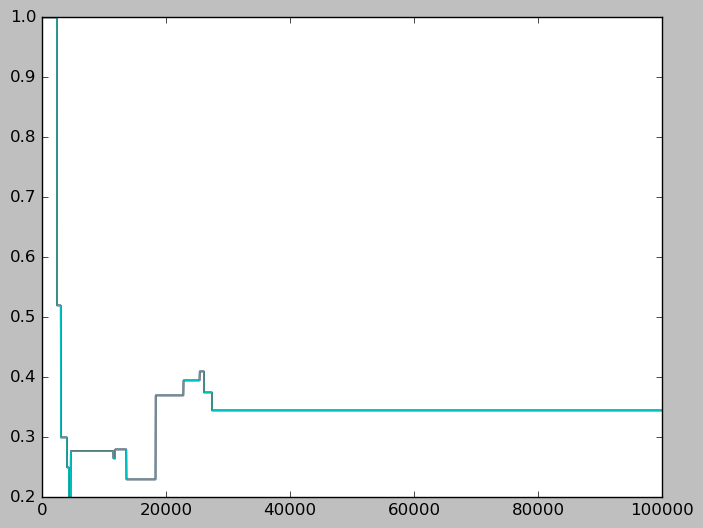

In [127]:


resultsseir_vac=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos_ManualFit_1stWave[0:14],ListOfParametersfirstwave_vac)[ValuesOnlyAtDays]
resultsseir_vac1=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos_ManualFit_1stWave[0:14],ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
resultsseir_vac2=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos_ManualFit_1stWave[0:14],ListOfParametersfirstwave_vac2)[ValuesOnlyAtDays]
resultsseir_vac3=model_SEIRICUHOS_vac(dt,P3,t_max,ListOfRhos_ManualFit_1stWave[0:14],ListOfParametersfirstwave_vac3)[ValuesOnlyAtDays]


100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.395]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.395]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.395]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.395]


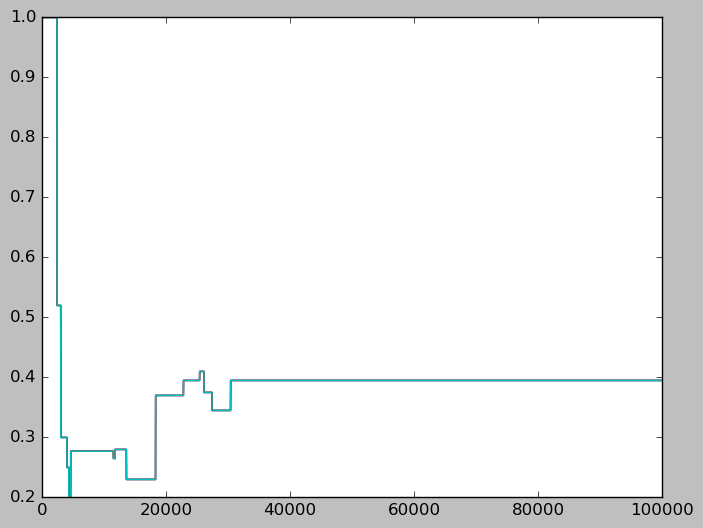

In [128]:
#Rho_BestScenario = min(ListOfRhos)
Rho_WorstScenario = ListOfRhos[10] # max(ListOfRhos[1:-1])

#List_Rho_BestScenario = list(ListOfRhos) + [Rho_BestScenario]
List_Rho_WorstScenario = list(ListOfRhos_ManualFit_1stWave[0:14]) + [Rho_WorstScenario]

#resultsseir_vac_Best=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_BestScenario,ListOfParametersfirstwave_vac))
#resultsseir_vac_Best1=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_BestScenario,ListOfParametersfirstwave_vac1))
#resultsseir_vac_Best2=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_BestScenario,ListOfParametersfirstwave_vac2))

#resultsseir_vac_Worst=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_WorstScenario,ListOfParametersfirstwave_vac))
#resultsseir_vac_Worst1=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_WorstScenario,ListOfParametersfirstwave_vac1))
#resultsseir_vac_Worst2=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_WorstScenario,ListOfParametersfirstwave_vac2))
#resultsseir_vac_Worst3=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_WorstScenario,ListOfParametersfirstwave_vac3))

resultsseir_vac_Worst=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac)[ValuesOnlyAtDays]
resultsseir_vac_Worst1=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
resultsseir_vac_Worst2=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac2)[ValuesOnlyAtDays]
resultsseir_vac_Worst3=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_WorstScenario,ListOfParametersfirstwave_vac3)[ValuesOnlyAtDays]

In [129]:
times[only10thindex]

array([  0,  30,  60,  90, 120, 150, 180, 210, 240, 270, 300, 330, 360,
       390, 420, 450])

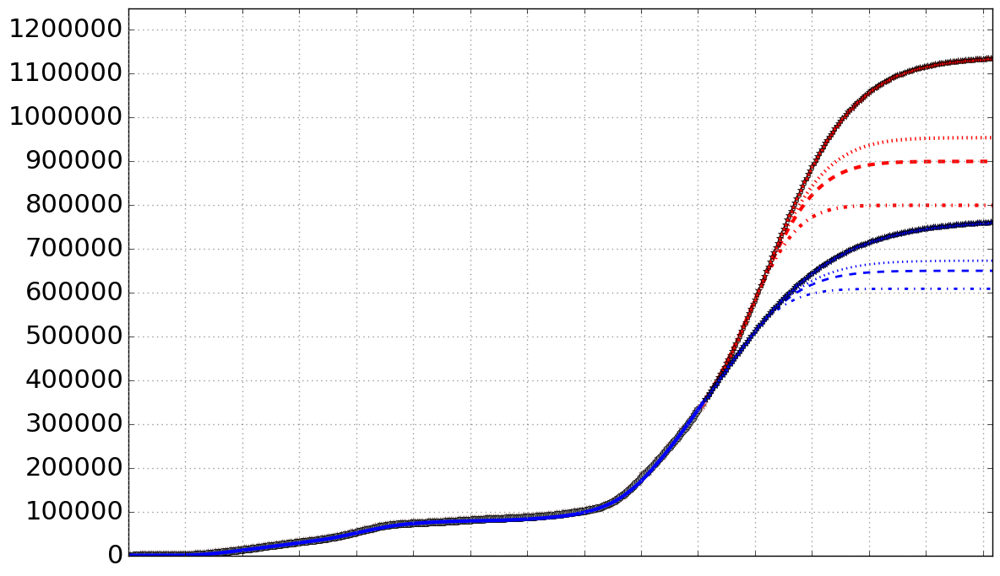

In [130]:
#plot new cases with vaccination scenarios
plt.figure(figsize=(12, 7),facecolor="white")

DI=df['new_cases_cum']
SevenDaysMovingAverage_TotalCases = ComputeSevenDaysMovingAverage(DI)
p = len(SevenDaysMovingAverage_TotalCases)
    
plt.plot(times[0:p],DI,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_TotalCases)-1]),alpha=0.4, markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_TotalCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
#plt.plot(t,(resultsseirfit[:,2]+resultsseirfit[:,3]+resultsseirfit[:,4]+resultsseirfit[:,6]+resultsseirfit[:,7]+resultsseirfit[:,8]+resultsseirfit[:,9]+resultsseirfit[:,10]+resultsseirfit[:,11])*N, label="Simulation automated fit", linewidth=2,color='red')
plt.plot(t[0:NumberDaysData],(resultsseir_vac[:,2]+resultsseir_vac[:,3]+resultsseir_vac[:,4]+resultsseir_vac[:,6]+resultsseir_vac[:,7]+resultsseir_vac[:,8]+resultsseir_vac[:,9]+resultsseir_vac[:,10]+resultsseir_vac[:,11]+resultsseir_vac[:,15])[0:NumberDaysData]*N, label="Simulation, Manual Fit", linewidth=3,color='blue')

#Optimistic = resultsseir_vac_Best[:,2]+resultsseir_vac_Best[:,3]+resultsseir_vac_Best[:,4]+resultsseir_vac_Best[:,6]+resultsseir_vac_Best[:,7]+resultsseir_vac_Best[:,8]+resultsseir_vac_Best[:,9]+resultsseir_vac_Best[:,10]+resultsseir_vac_Best[:,11]+resultsseir_vac_Best[:,15]
#Optimistic1 = resultsseir_vac_Best1[:,2]+resultsseir_vac_Best1[:,3]+resultsseir_vac_Best1[:,4]+resultsseir_vac_Best1[:,6]+resultsseir_vac_Best1[:,7]+resultsseir_vac_Best1[:,8]+resultsseir_vac_Best1[:,9]+resultsseir_vac_Best1[:,10]+resultsseir_vac_Best1[:,11]+resultsseir_vac_Best1[:,15]
#Optimistic2 = resultsseir_vac_Best2[:,2]+resultsseir_vac_Best2[:,3]+resultsseir_vac_Best2[:,4]+resultsseir_vac_Best1[:,6]+resultsseir_vac_Best2[:,7]+resultsseir_vac_Best2[:,8]+resultsseir_vac_Best2[:,9]+resultsseir_vac_Best2[:,10]+resultsseir_vac_Best2[:,11]+resultsseir_vac_Best2[:,15]

Pessimistic = resultsseir_vac_Worst[:,2]+resultsseir_vac_Worst[:,3]+resultsseir_vac_Worst[:,4]+resultsseir_vac_Worst[:,6]+resultsseir_vac_Worst[:,7]+resultsseir_vac_Worst[:,8]+resultsseir_vac_Worst[:,9]+resultsseir_vac_Worst[:,10]+resultsseir_vac_Worst[:,11]+resultsseir_vac_Worst[:,15]
Pessimistic1 = resultsseir_vac_Worst1[:,2]+resultsseir_vac_Worst1[:,3]+resultsseir_vac_Worst1[:,4]+resultsseir_vac_Worst1[:,6]+resultsseir_vac_Worst1[:,7]+resultsseir_vac_Worst1[:,8]+resultsseir_vac_Worst1[:,9]+resultsseir_vac_Worst1[:,10]+resultsseir_vac_Worst1[:,11]+resultsseir_vac_Worst1[:,15]
Pessimistic2 = resultsseir_vac_Worst2[:,2]+resultsseir_vac_Worst2[:,3]+resultsseir_vac_Worst2[:,4]+resultsseir_vac_Worst2[:,6]+resultsseir_vac_Worst2[:,7]+resultsseir_vac_Worst2[:,8]+resultsseir_vac_Worst2[:,9]+resultsseir_vac_Worst2[:,10]+resultsseir_vac_Worst2[:,11]+resultsseir_vac_Worst2[:,15]
Pessimistic3 = resultsseir_vac_Worst3[:,2]+resultsseir_vac_Worst3[:,3]+resultsseir_vac_Worst3[:,4]+resultsseir_vac_Worst3[:,6]+resultsseir_vac_Worst3[:,7]+resultsseir_vac_Worst3[:,8]+resultsseir_vac_Worst3[:,9]+resultsseir_vac_Worst3[:,10]+resultsseir_vac_Worst3[:,11]+resultsseir_vac_Worst3[:,15]

#plt.plot(t[NumberDaysData:-1],Optimistic[NumberDaysData:-1]*N,'-.', label="Optimistic Projection (as lockdown) 1st vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],Optimistic1[NumberDaysData:-1]*N,'--', label="Optimistic Projection (as lockdown) 2nd vaccination strategy", linewidth=3,color='green')
#plt.plot(t[NumberDaysData:-1],Optimistic2[NumberDaysData:-1]*N,':', label="Optimistic Projection (as lockdown) 3rd vaccination strategy", linewidth=3,color='green')

plt.plot(t[NumberDaysData:-1],Pessimistic[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection (as October) + 6 months vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic1[NumberDaysData:-1]*N,'--', label="Pessimistic Projection (as October) + 1 year vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic2[NumberDaysData:-1]*N,':', label="Pessimistic Projection (as October) + 1.5 years vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],Pessimistic3[NumberDaysData:-1]*N,'*', label="Pessimistic Projection (as October) + no vaccination", linewidth=3,color='red')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac[:,2]+resultsseir_vac[:,3]+resultsseir_vac[:,4]+resultsseir_vac[:,6]+resultsseir_vac[:,7]+resultsseir_vac[:,8]+resultsseir_vac[:,9]+resultsseir_vac[:,10]+resultsseir_vac[:,11]+resultsseir_vac[:,15])[NumberDaysData:-1]*N,'-.', label="Projection if No Further Change + 6 months vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,2]+resultsseir_vac1[:,3]+resultsseir_vac1[:,4]+resultsseir_vac1[:,6]+resultsseir_vac1[:,7]+resultsseir_vac1[:,8]+resultsseir_vac1[:,9]+resultsseir_vac1[:,10]+resultsseir_vac1[:,11]+resultsseir_vac1[:,15])[NumberDaysData:-1]*N,'--', label="Projection if No Further Change + 1 year vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,2]+resultsseir_vac2[:,3]+resultsseir_vac2[:,4]+resultsseir_vac2[:,6]+resultsseir_vac2[:,7]+resultsseir_vac2[:,8]+resultsseir_vac2[:,9]+resultsseir_vac2[:,10]+resultsseir_vac2[:,11]+resultsseir_vac2[:,15])[NumberDaysData:-1]*N,':', label="Projection if No Further Change + 1.5 years vaccination strategy", linewidth=2,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,2]+resultsseir_vac3[:,3]+resultsseir_vac3[:,4]+resultsseir_vac3[:,6]+resultsseir_vac3[:,7]+resultsseir_vac3[:,8]+resultsseir_vac3[:,9]+resultsseir_vac3[:,10]+resultsseir_vac3[:,11]+resultsseir_vac3[:,15])[NumberDaysData:-1]*N,'*', label="Projection if No Further Change + no vaccination", linewidth=2,color='blue')

#plt.plot(t,(resultsseir_vac[:,12]+resultsseir_vac[:,13]+resultsseir_vac[:,14]+resultsseir_vac[:,5])*N,'-.', label="Undetected Cases (No change scenario)", linewidth=2,color='magenta',alpha=0.7)

UpperY = 1250000#1300000  
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=18)
plt.xticks(times[only10thindex],'')


plt.yticks(np.arange(0,UpperY+1,100000),fontsize=22)

#plt.title("Sweden")

#plt.legend(loc='upper left')
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Total Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.tight_layout()
plt.savefig('./Results_Sweden/TotalCases_vac_SEIR-ICU_SWEDEN'+ FileFormatOfFigures)


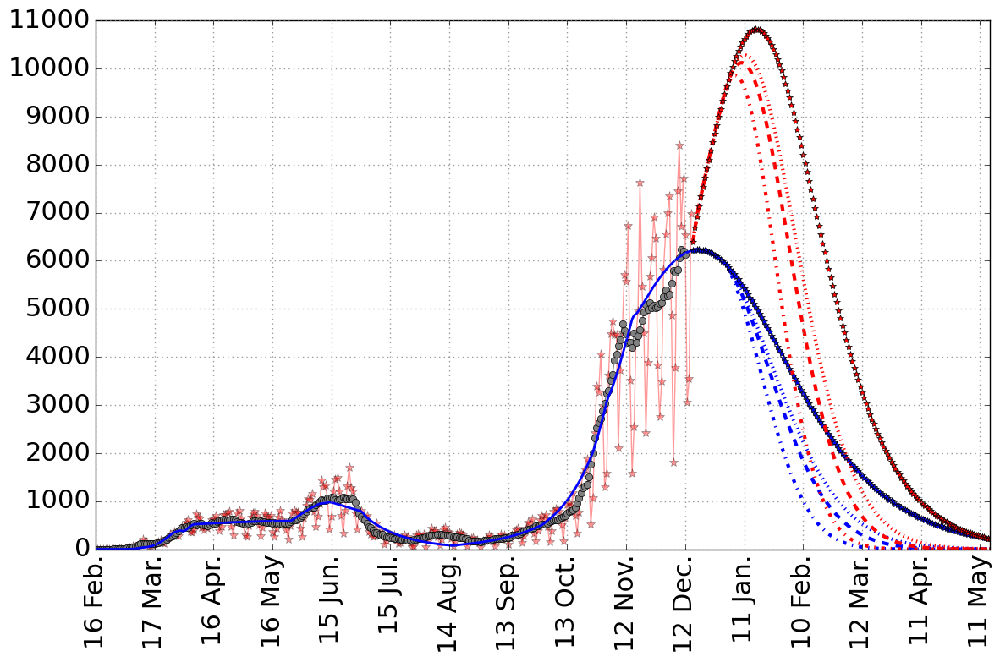

In [131]:
#plot daily new cases
plt.figure(figsize=(12, 8),facecolor="white")

DI1=df['new_cases']
SevenDaysMovingAverage_DailyCases = ComputeSevenDaysMovingAverage(DI1)
p =len(SevenDaysMovingAverage_DailyCases)
    
plt.plot(times[0:p],DI1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_DailyCases)-1]),alpha=0.4,markersize=8)
plt.plot(times[0:p-3],SevenDaysMovingAverage_DailyCases[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
yoo=(resultsseir_vac[:,2]+resultsseir_vac[:,3]+resultsseir_vac[:,4]+resultsseir_vac[:,6]+resultsseir_vac[:,7]+resultsseir_vac[:,8]+resultsseir_vac[:,9]+resultsseir_vac[:,10]+resultsseir_vac[:,11]+resultsseir_vac[:,15])*N

pp=len(yoo)

yuu=np.zeros(1001)
for ii in range(0,1000):
    yuu[ii]= yoo[ii+1]-yoo[ii]
plt.plot(t[0:NumberDaysData],yuu[0:NumberDaysData],label="Simulation, Manual Fit", linewidth=2,color='blue')


Optimistic=(resultsseir_vac[:,2]+resultsseir_vac[:,3]+resultsseir_vac[:,4]+resultsseir_vac[:,6]+resultsseir_vac[:,7]+resultsseir_vac[:,8]+resultsseir_vac[:,9]+resultsseir_vac[:,10]+resultsseir_vac[:,11]+resultsseir_vac[:,15])
Optimistic1=(resultsseir_vac1[:,2]+resultsseir_vac1[:,3]+resultsseir_vac1[:,4]+resultsseir_vac1[:,6]+resultsseir_vac1[:,7]+resultsseir_vac1[:,8]+resultsseir_vac1[:,9]+resultsseir_vac1[:,10]+resultsseir_vac1[:,11]+resultsseir_vac1[:,15])
Optimistic2=(resultsseir_vac2[:,2]+resultsseir_vac2[:,3]+resultsseir_vac2[:,4]+resultsseir_vac2[:,6]+resultsseir_vac2[:,7]+resultsseir_vac2[:,8]+resultsseir_vac2[:,9]+resultsseir_vac2[:,10]+resultsseir_vac2[:,11]+resultsseir_vac2[:,15])
Optimistic3=(resultsseir_vac3[:,2]+resultsseir_vac3[:,3]+resultsseir_vac3[:,4]+resultsseir_vac3[:,6]+resultsseir_vac3[:,7]+resultsseir_vac3[:,8]+resultsseir_vac3[:,9]+resultsseir_vac3[:,10]+resultsseir_vac3[:,11]+resultsseir_vac3[:,15])



yooOptimistic = Optimistic*N
yooOptimistic1 = Optimistic1*N
yooOptimistic2 = Optimistic2*N
yooOptimistic3 = Optimistic3*N


yuuOptimistic=np.zeros(1001)
yuuOptimistic1=np.zeros(1001)
yuuOptimistic2=np.zeros(1001)
yuuOptimistic3=np.zeros(1001)
for ii in range(0,1000):
    yuuOptimistic[ii]= yooOptimistic[ii+1]-yooOptimistic[ii]
    yuuOptimistic1[ii]= yooOptimistic1[ii+1]-yooOptimistic1[ii]
    yuuOptimistic2[ii]= yooOptimistic2[ii+1]-yooOptimistic2[ii]
    yuuOptimistic3[ii]= yooOptimistic3[ii+1]-yooOptimistic3[ii]
plt.plot(t[NumberDaysData:-1],yuuOptimistic[NumberDaysData:-1],'-.', label="Optimistic Projection (as October) + 6 months vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic1[NumberDaysData:-1],'--', label="Optimistic Projection (as October) + 1 year vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic2[NumberDaysData:-1],':', label="Optimistic Projection (as October) + 1.5 years vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],yuuOptimistic3[NumberDaysData:-1],'*', label="Optimistic Projection (as October) + no vaccination", linewidth=3,color='blue')

Pessimistic = resultsseir_vac_Worst[:,2]+resultsseir_vac_Worst[:,3]+resultsseir_vac_Worst[:,4]+resultsseir_vac_Worst[:,6]+resultsseir_vac_Worst[:,7]+resultsseir_vac_Worst[:,8]+resultsseir_vac_Worst[:,9]+resultsseir_vac_Worst[:,10]+resultsseir_vac_Worst[:,11]+resultsseir_vac_Worst[:,15]
Pessimistic1 = resultsseir_vac_Worst1[:,2]+resultsseir_vac_Worst1[:,3]+resultsseir_vac_Worst1[:,4]+resultsseir_vac_Worst1[:,6]+resultsseir_vac_Worst1[:,7]+resultsseir_vac_Worst1[:,8]+resultsseir_vac_Worst1[:,9]+resultsseir_vac_Worst1[:,10]+resultsseir_vac_Worst1[:,11]+resultsseir_vac_Worst1[:,15]
Pessimistic2 = resultsseir_vac_Worst2[:,2]+resultsseir_vac_Worst2[:,3]+resultsseir_vac_Worst2[:,4]+resultsseir_vac_Worst2[:,6]+resultsseir_vac_Worst2[:,7]+resultsseir_vac_Worst2[:,8]+resultsseir_vac_Worst2[:,9]+resultsseir_vac_Worst2[:,10]+resultsseir_vac_Worst2[:,11]+resultsseir_vac_Worst2[:,15]
Pessimistic3 = resultsseir_vac_Worst3[:,2]+resultsseir_vac_Worst3[:,3]+resultsseir_vac_Worst3[:,4]+resultsseir_vac_Worst3[:,6]+resultsseir_vac_Worst3[:,7]+resultsseir_vac_Worst3[:,8]+resultsseir_vac_Worst3[:,9]+resultsseir_vac_Worst3[:,10]+resultsseir_vac_Worst3[:,11]+resultsseir_vac_Worst3[:,15]

yooPessimistic = Pessimistic*N
yooPessimistic1 = Pessimistic1*N
yooPessimistic2 = Pessimistic2*N
yooPessimistic3 = Pessimistic3*N

    
yuuPessimistic=np.zeros(1001)
yuuPessimistic1=np.zeros(1001)
yuuPessimistic2=np.zeros(1001)
yuuPessimistic3=np.zeros(1001)
for ii in range(0,1000):
    yuuPessimistic[ii]= yooPessimistic[ii+1]-yooPessimistic[ii]
    yuuPessimistic1[ii]= yooPessimistic1[ii+1]-yooPessimistic1[ii]
    yuuPessimistic2[ii]= yooPessimistic2[ii+1]-yooPessimistic2[ii]
    yuuPessimistic3[ii]= yooPessimistic3[ii+1]-yooPessimistic3[ii]
plt.plot(t[NumberDaysData:-1],yuuPessimistic[NumberDaysData:-1],'-.', label="Pessimistic Projection (as October) + 6 months vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic1[NumberDaysData:-1],'--', label="Pessimistic Projection (as October) + 1 year vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic2[NumberDaysData:-1],':', label="Pessimistic Projection (as October) + 1.5 years vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],yuuPessimistic3[NumberDaysData:-1],'*', label="Pessimistic Projection (as October) + no vaccination", linewidth=3,color='red')


#plt.plot(np.arange(0,1001,1)[0:pp+1],yuu,'--', label="Projection if No Further Change", linewidth=3)

UpperY1 = 11000
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=22)
#plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY1+1,1000),fontsize=22)

#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Daily New Detected Cases",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY1)

plt.tight_layout()
plt.savefig('./Results_Sweden/DailyNewCases_vac_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

In [132]:
LenghtOfForecast = 480#46 # 60 # This hold for all plots: by how many days you wish to show simulation, after end of data?
endofplot = NumberDaysData + LenghtOfForecast
#only10thindex=np.arange(0,endofplot+1,15)

only10thindex=np.arange(0,endofplot+1,30)
times=np.arange(0,endofplot+1,1)

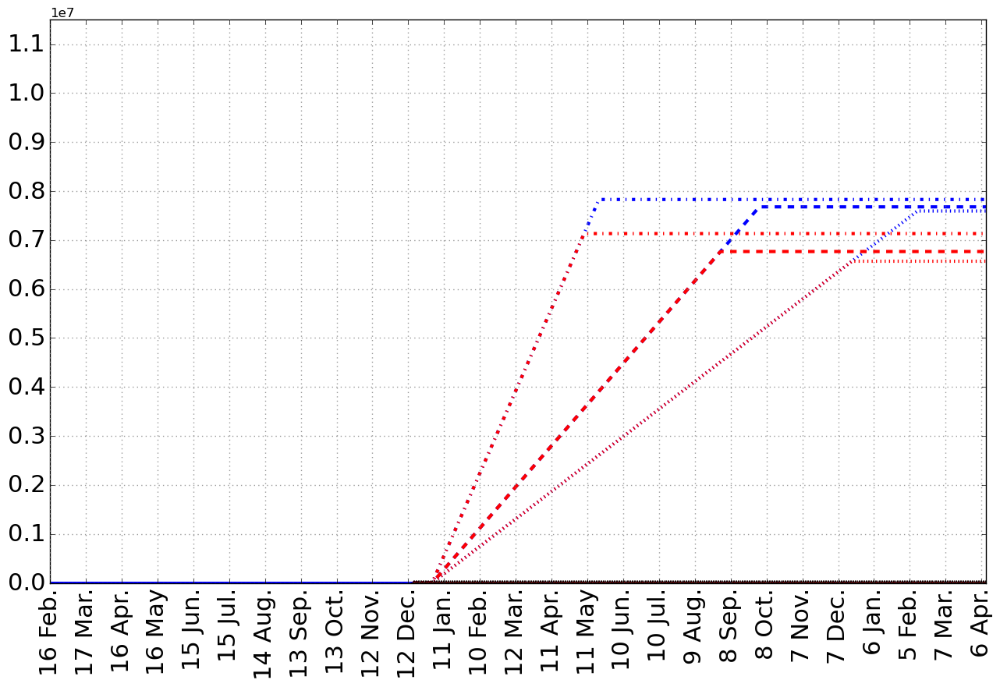

In [133]:
#plot vaccination
plt.figure(figsize=(13, 9),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir_vac[:,16])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac[:,16])[NumberDaysData:-1]*N, '-.',label="Projection If No Further Changes + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,16])[NumberDaysData:-1]*N,'--', label="Projection If No Further Changes + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,16])[NumberDaysData:-1]*N,':', label="Projection If No Further Changes + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,16])[NumberDaysData:-1]*N,':', label="Projection If No Further Changes + no vaccination strategy", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst[:,16])[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst1[:,16])[NumberDaysData:-1]*N,'--', label="Pessimistic Projection + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst2[:,16])[NumberDaysData:-1]*N,':', label="Pessimistic Projection + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst3[:,16])[NumberDaysData:-1]*N,'*', label="Pessimistic Projection + no vaccination strategy", linewidth=3,color='red')

#plt.plot(t,(resultsseir_vac[:,16])*N,'--', label="Projection if No Further Change except vaccination", linewidth=3,color='cyan')
#plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = N
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=22)
plt.yticks(np.arange(0,11500000,1000000),fontsize=22)
#plt.ticklabel_format(style='plain')
#plt.title("Sweden")

#plt.legend(loc='upper left', fancybox=True, numpoints=1,fontsize=14)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Vaccinated People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,11500000)#UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/Vaccinated_vac_SEIR-ICU_SWEDEN' + FileFormatOfFigures)
#plt.xlabel("Time")

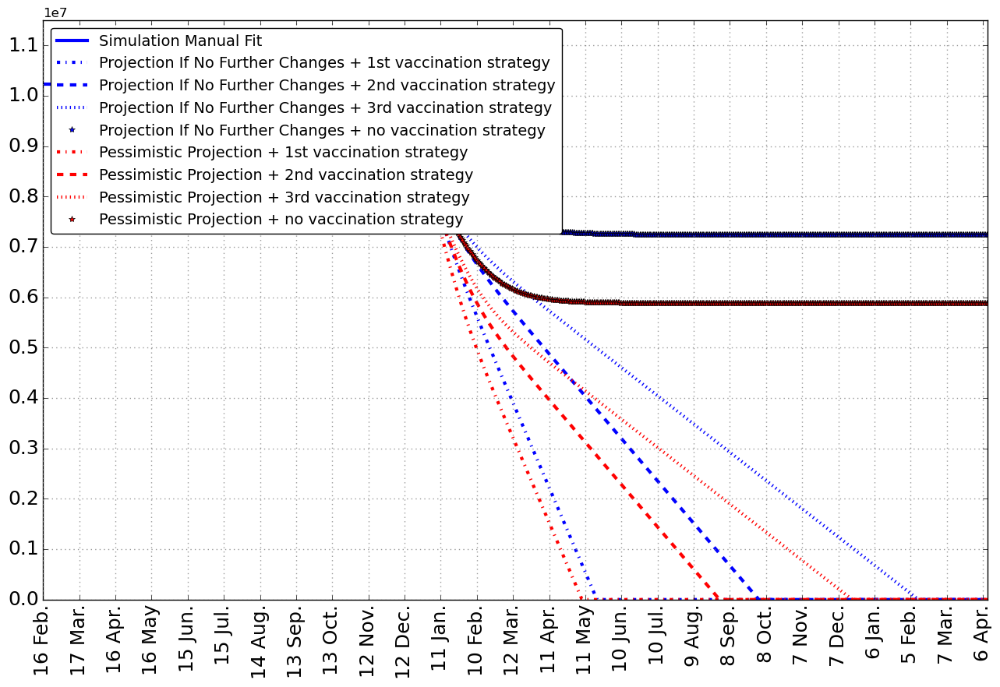

In [134]:
#plot vaccination
plt.figure(figsize=(13, 9),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir_vac[:,0])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac[:,0])[NumberDaysData:-1]*N, '-.',label="Projection If No Further Changes + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,0])[NumberDaysData:-1]*N,'--', label="Projection If No Further Changes + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,0])[NumberDaysData:-1]*N,':', label="Projection If No Further Changes + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,0])[NumberDaysData:-1]*N,'*', label="Projection If No Further Changes + no vaccination strategy", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst[:,0])[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst1[:,0])[NumberDaysData:-1]*N,'--', label="Pessimistic Projection + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst2[:,0])[NumberDaysData:-1]*N,':', label="Pessimistic Projection + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst3[:,0])[NumberDaysData:-1]*N,'*', label="Pessimistic Projection + no vaccination strategy", linewidth=3,color='red')

#plt.plot(t,(resultsseir_vac[:,16])*N,'--', label="Projection if No Further Change except vaccination", linewidth=3,color='cyan')
#plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = N
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=18)
plt.yticks(np.arange(0,11500000,1000000),fontsize=18)
#plt.ticklabel_format(style='plain')
#plt.title("Sweden")

plt.legend(loc='upper left', fancybox=True, numpoints=1,fontsize=14)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Vaccinated People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,11500000)#UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/Vaccinated_sus_SEIR-ICU_SWEDEN' + FileFormatOfFigures)
#plt.xlabel("Time")

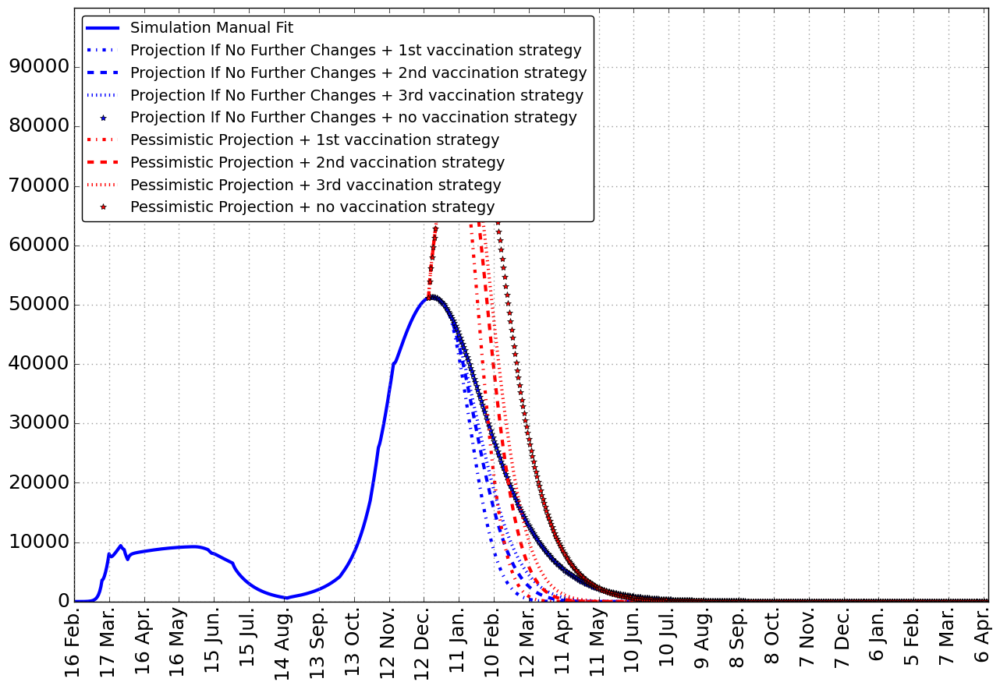

In [135]:
#plot vaccination
plt.figure(figsize=(13, 9),facecolor="white")

plt.plot(t[0:NumberDaysData],(resultsseir_vac[:,1])[0:NumberDaysData]*N, label="Simulation Manual Fit", linewidth=3,color='blue')

plt.plot(t[NumberDaysData:-1],(resultsseir_vac[:,1])[NumberDaysData:-1]*N, '-.',label="Projection If No Further Changes + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac1[:,1])[NumberDaysData:-1]*N,'--', label="Projection If No Further Changes + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac2[:,1])[NumberDaysData:-1]*N,':', label="Projection If No Further Changes + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac3[:,1])[NumberDaysData:-1]*N,'*', label="Projection If No Further Changes + no vaccination strategy", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst[:,1])[NumberDaysData:-1]*N,'-.', label="Pessimistic Projection + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst1[:,1])[NumberDaysData:-1]*N,'--', label="Pessimistic Projection + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst2[:,1])[NumberDaysData:-1]*N,':', label="Pessimistic Projection + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(t[NumberDaysData:-1],(resultsseir_vac_Worst3[:,1])[NumberDaysData:-1]*N,'*', label="Pessimistic Projection + no vaccination strategy", linewidth=3,color='red')

#plt.plot(t,(resultsseir_vac[:,16])*N,'--', label="Projection if No Further Change except vaccination", linewidth=3,color='cyan')
#plt.plot(t,(resultsseir[:,0])*N,'--', label="Projection if No Further Change", linewidth=3,color='blue')

UpperY3 = N
plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90,fontsize=18)
plt.yticks(np.arange(0,100000,10000),fontsize=18)
#plt.ticklabel_format(style='plain')
#plt.title("Sweden")

plt.legend(loc='upper left', fancybox=True, numpoints=1,fontsize=14)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("Vaccinated People",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,100000)#UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/Vaccinated_exp_SEIR-ICU_SWEDEN' + FileFormatOfFigures)
#plt.xlabel("Time")

In [136]:
# Some Plotting Variables shared by all Plots

#NumberDaysData = len(df['date'])
LenghtOfForecast = 151 # 60 # This hold for all plots: by how many days you wish to show simulation, after end of data?
endofplot = NumberDaysData + LenghtOfForecast

MyListOfDates = ['16 February']
for Day in np.arange(16,30,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' June'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' July'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' August'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' September'
    MyListOfDates.append(ThisDate)    
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' October'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' November'
    MyListOfDates.append(ThisDate) 
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' December'
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' January '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,29,1):
    ThisDate = str(Day) + ' February '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' March '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,31,1):
    ThisDate = str(Day) + ' April '
    MyListOfDates.append(ThisDate)
for Day in np.arange(1,32,1):
    ThisDate = str(Day) + ' May '
    MyListOfDates.append(ThisDate)
MyListOfDates=np.array(MyListOfDates)

#only10thindex=np.arange(0,endofplot+1,15)
only10thindex=np.arange(0,endofplot+1,30)
times=np.arange(0,endofplot+1,1)

plt.style.use('ggplot')
mpl.rc("figure", facecolor="white")
mpl.style.use('classic')

FileFormatOfFigures = '.pdf' # Could be also '.pdf'

In [137]:
cases_sim=(resultsseir_vac[:,0])*N
cases_sim1=(resultsseir_vac1[:,0])*N
cases_sim2=(resultsseir_vac2[:,0])*N
cases_sim3=(resultsseir_vac3[:,0])*N


cases_sim_Pessimistic=(resultsseir_vac_Worst[:,0])*N
cases_sim_Pessimistic1=(resultsseir_vac_Worst1[:,0])*N
cases_sim_Pessimistic2=(resultsseir_vac_Worst2[:,0])*N
cases_sim_Pessimistic3=(resultsseir_vac_Worst3[:,0])*N


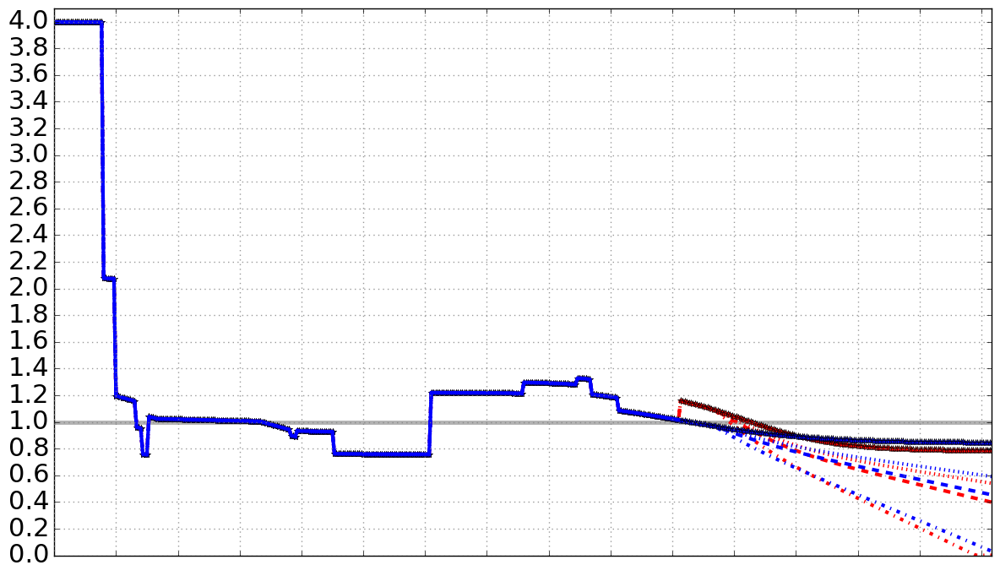

In [138]:
# plt.figure(figsize=(10.5, 7),facecolor="white")
plt.figure(figsize=(12, 7),facecolor="white")

Reff = R_eff(times, cases_sim, ListOfRhos[0:14])
Reff1 = R_eff(times, cases_sim1, ListOfRhos[0:14])
Reff2 = R_eff(times, cases_sim2, ListOfRhos[0:14])
Reff3 = R_eff(times, cases_sim3, ListOfRhos[0:14])




Reff_Pess = R_eff(times, cases_sim_Pessimistic, List_Rho_WorstScenario)
Reff_Pess1 = R_eff(times, cases_sim_Pessimistic1, List_Rho_WorstScenario)
Reff_Pess2 = R_eff(times, cases_sim_Pessimistic2, List_Rho_WorstScenario)
Reff_Pess3 = R_eff(times, cases_sim_Pessimistic3, List_Rho_WorstScenario)

plt.axhline(y=1,color='gray',linewidth=3.5, alpha = 0.6)


plt.plot(times,Reff_Pess,'-.', label="Pessimistic Projection (as October) + 1st vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess1,'--', label="Pessimistic Projection (as October) + 2nd vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess2,':', label="Pessimistic Projection (as October) + 3rd vaccination strategy", linewidth=3,color='red')
plt.plot(times,Reff_Pess3,'*', label="Pessimistic Projection (as October) + no vaccination strategy", linewidth=3,color='red')


#plt.plot(times,Reff,'--', label="Projection if No Further Change", linewidth=3,color='blue')

plt.plot(times,Reff,'-.', label="Projection if No Further Change + 1st vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff1,'--', label="Projection if No Further Change + 2nd vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff2,':', label="Projection if No Further Change + 3rd vaccination strategy", linewidth=3,color='blue')
plt.plot(times,Reff3,'*', label="Projection if No Further Change + no vaccination strategy", linewidth=3,color='blue')


plt.plot(times[0:NumberDaysData],Reff[0:NumberDaysData], '-',linewidth=3,color='blue')

UpperY3 = 4.1

plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex], '')
plt.yticks(np.arange(0,UpperY3+1,0.2),fontsize=22)

#plt.title('Sweden')

#plt.legend(loc='upper right', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel(“Time”)
#plt.ylabel(r'$R_{eff}(t)$',size=18)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY3)

plt.tight_layout()
plt.savefig('./Results_Sweden/R_eff_vac_SWEDEN' + FileFormatOfFigures)


In [139]:

#################################################################################################
### NOW WE INVESTIGATE SYSTEMATICALLY THE EFFECT OF COMBINATIONS OF RHO and TAU_VAC ON S(t),  ###
### i.e. what it takes to get to herd immunity or when we might get there                    ###
#################################################################################################



In [62]:
# Auxiliary function to compute S(rho,tau_vac)|April


def Auxiliary_f_Compute_S(x,y):

    tvac1=y
    ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
               p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac1])

    List_Rho_Scenario = list(ListOfRhos[0:14]) + [x]
    
    resultsseir_vac5=model_SEIRICUHOS_vac(dt,P3,t_max,List_Rho_Scenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays]
    # resultsseir_vac5=odeint(model_SEIRICUHOS_vac,P3,t,(List_Rho_Scenario,ListOfParametersfirstwave_vac1))    
    return resultsseir_vac5[endofplot,0]*100


100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
100000
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
(3, 3)


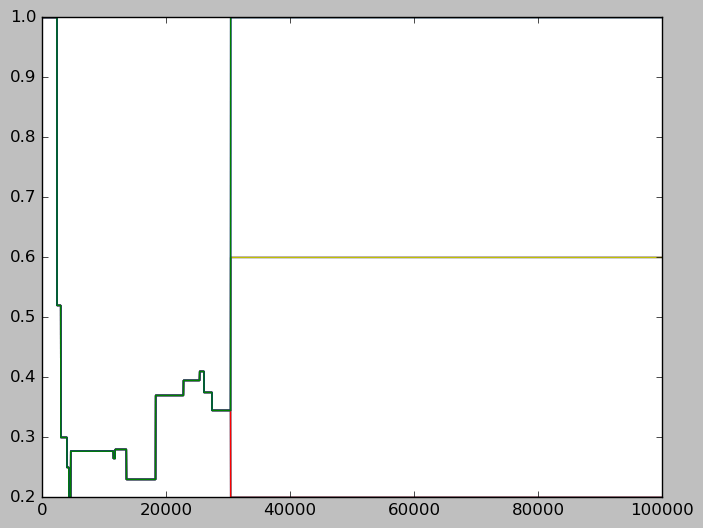

In [63]:
Min_rho = 0.2
Max_rho = 1
HowManyRhos = 3 # 21 # 41 # 21 # 21 # 11

Min_tvac = 0
Max_tvac = 0.01 # 0.0111 
HowManyTvacs = 3 # 21 # 41 # 21 # 20 # 10

#List_rho=np.linspace(0,1,11)
List_rho=np.linspace(Min_rho,Max_rho,HowManyRhos)
#List_tvac = np.linspace(0,0.0111,10)
List_tvac = np.linspace(Min_tvac,Max_tvac,HowManyTvacs)

MyArray = np.zeros(HowManyRhos*HowManyTvacs).reshape(HowManyRhos,HowManyTvacs)

X,Y = np.meshgrid(List_tvac,List_rho)

i=0
for rho in List_rho:
    j=0
    for tvac in List_tvac:
        #rho=List_rho[i]
        #tvac=List_tvac[j]
        MyArray[i,j]=Auxiliary_f_Compute_S(rho,tvac)
        #print(i)
        #print(j)
        #print()
        j=j+1
    i=i+1
print(np.shape(MyArray))


/Users/stefano.magni/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: The following kwargs were not used by contour: 'label'
  if __name__ == '__main__':


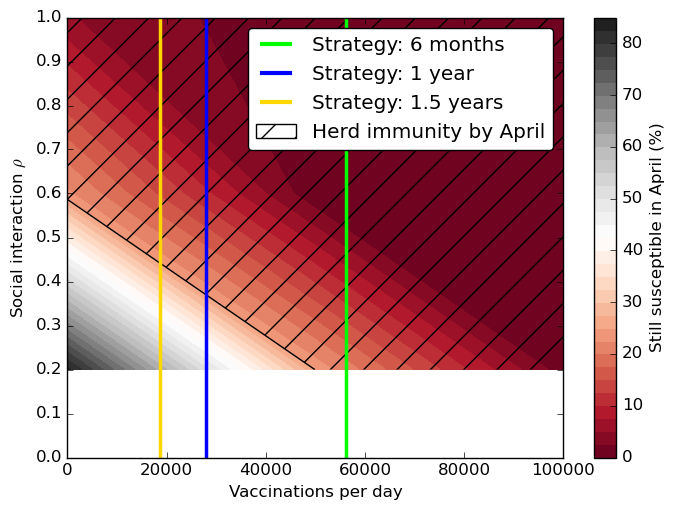

In [71]:
plt.figure(figsize=(8, 5.5),facecolor="white")
plt.contourf(X*N,Y, MyArray,40, cmap='RdGy')
#print(np.size(X))
cbar=plt.colorbar()
cbar.set_label('Still susceptible in April (%)', rotation=90)
n_levels=[0,(1-0.75)*100]
plt.contour(X*N,Y, MyArray, n_levels, colors='black', linestyles='-')
cs=plt.contourf(X*N,Y, MyArray, n_levels, colors='none',
                  hatches=[ '/',None],label='herd immunity by April'
            )
artists, labels = cs.legend_elements()
My_patch = mpatches.Patch(fill=False,hatch='/')
from matplotlib.lines import Line2D
colors = ['lime', 'blue', 'gold']
lines = [Line2D([0], [0], color=c, linewidth=3, linestyle='-') for c in colors]
lines.append(My_patch)
labels = ['Strategy: 6 months', 'Strategy: 1 year', 'Strategy: 1.5 years','Herd immunity by April']

#plt.plot(N/365,ListOfRhos[-1],marker='o')
#plt.plot(N/365,ListOfRhos[-1],marker='o')
#plt.title('Sweden herd immunity by April')
plt.axvline(x=N/(365*0.5),label='Strategy: 6 months',color='lime',linewidth=2.5)
plt.axvline(x=N/365,label='Strategy: 1 year',color='blue',linewidth=2.5)
plt.axvline(x=N/(365*1.5),label='Strategy: 1.5 years',color='gold',linewidth=2.5)
plt.xlabel('Vaccinations per day')
plt.ylabel(r'Social interaction $\rho$')
plt.xlim(0,100000)# 6000) # 6900)
plt.yticks(np.arange(0,1.1,0.1))
plt.legend(lines, labels,fancybox=True)

plt.savefig('./Results_Sweden/HerdImmunityByApril_rho_tvac_Sweden' + FileFormatOfFigures)
plt.show()

In [164]:
##################################################################################################
### NOW WE EVALUATE SYSTEMATICALLY THE WHEN WE'LL REACH HERD IMMUNITY BASED ON RHO and TAU_VAC ###
##################################################################################################

68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2]
nan


271
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
253
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
237
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
223
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
211
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
200
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
190
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
181
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.21250000000000002]
173
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.39

165
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
158
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
151
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
146
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
140
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
135
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
131
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
126
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
122
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.225]
118
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0

111
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
108
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
105
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
102
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
99
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
97
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
94
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
92
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.23750000000000002]
90
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.

[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
80
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
78
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
77
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
75
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
74
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
72
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
71
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
70
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
68
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.25]
67
68500


60
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2625]
59
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.2625]
59
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.275]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

328
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
301
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
278
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
259
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
241
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
226
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
213
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
202
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.28750000000000003]
191
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.39

210
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
199
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
188
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
179
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
171
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
163
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
156
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
150
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.30000000000000004]
144
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.39

136
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
131
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
127
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
122
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
118
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
115
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
111
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
108
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
105
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3125]
102
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395

84
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
82
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
80
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
78
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
77
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
75
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
74
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
72
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
71
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.325]
69
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.34

60
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
59
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
58
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
57
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
57
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
56
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3375]
55
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.35000000000000003]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.35000000000000003]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.35000000000000003]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277

nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.36250000000000004]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.39

nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
348
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
312
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
283
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
259
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
239
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
222
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
208
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
195
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.375]
184
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0

126
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
121
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
117
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
113
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
109
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
105
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
102
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
99
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
96
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.3875]
94
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0

73
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
72
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
70
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
69
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
68
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
66
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
65
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
64
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
63
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
61
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4]
60
68500
[

58
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
57
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
56
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
55
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
54
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
53
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
53
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
52
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.41250000000000003]
51
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 

[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
50
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
49
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
48
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
48
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
47
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
46
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
46
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.42500000000000004]
45
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.

261
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
229
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
205
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
186
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
171
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
158
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
148
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
139
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
131
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.45]
124
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.3

82
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
80
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
78
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
75
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
73
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
72
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
70
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
68
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
66
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.4625]
65
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

58
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
57
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
55
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
54
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
53
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
52
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
52
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
51
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.47500000000000003]
50
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 

47
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
46
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
46
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
45
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
44
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
44
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
43
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
43
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.48750000000000004]
42
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 

36
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
36
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
36
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
35
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
35
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
34
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
34
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
34
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
33
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5]
33
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5125]
nan
685

115
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
103
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
94
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
87
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
81
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
76
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
72
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
69
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
66
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.525]
63
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.

48
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
47
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
46
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
45
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
44
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
43
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
42
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
42
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5375000000000001]
41
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0

36
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
35
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
35
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
34
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
34
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
33
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
33
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
33
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
32
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]
32
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.55]


27
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
27
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
27
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
27
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
26
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
26
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
26
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
26
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
26
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5625]
25
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

22
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.575]
22
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
nan
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
54
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
48
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
45
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
43
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
41
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
39
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.5875]
38
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

30
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
30
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
30
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
29
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
29
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
28
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
28
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
28
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6000000000000001]
28
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0

25
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
24
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
24
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
24
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
24
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
23
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
23
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
23
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
23
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6125]
23
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

20
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
20
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
20
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
20
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.625]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.34

17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6375]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

20
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
19
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6625000000000001]
18
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0

17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
17
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.675]
16
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.34

14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.6875]
14
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7]
12
68500
[

11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7125000000000001]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7250000000000001]
13
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0

10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7375]
12
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.

11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
11
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]
10
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.75]


9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7625]
9
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345

8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7750000000000001]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7

7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7875000000000001]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.7

8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
8
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8125]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345

7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
7
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.825]


6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8375000000000001]
6
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8

5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8500000000000001]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8

5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8625]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345

5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.8875]
5
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345

4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9000000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9

4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9125000000000001]
4
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9

3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.925]


3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9375]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9375]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9375]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9375]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9375]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.95]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.95]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.95]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.95]
3
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.95]


2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9625000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9

2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9750000000000001]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9

2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 0.9875]
2
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345

1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.3, 0.25, 0.2, 0.277, 0.265, 0.28, 0.23, 0.37, 0.395, 0.41, 0.375, 0.345, 1.0]
1
68500
[1, 0.52, 0.

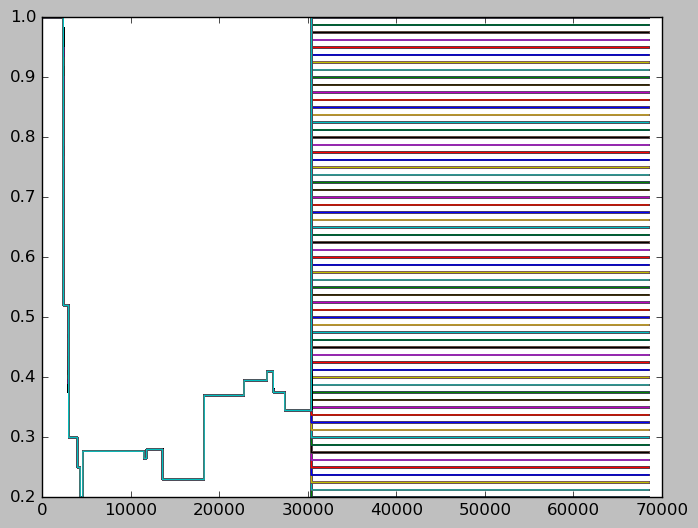

In [64]:
MyTestArray = np.array([0,1,2,3,4,5,6,7,8,9])
MyTestArrayBiggerThan = MyTestArray>6
MyTestArrayBiggerThan

# Auxiliary function to compute S(rho,tau_vac)|April

def f_HerdImm_Time(x,y):
    tvac1=y
    ListOfParametersfirstwave_vac1=np.array([alpha, beta, 
               p2_max,p2_min,p3,p4,p5,p6,p7,p9,
               tau1,tau2,tau3,tau4,tau5,tau6,tau7,tau8,tau9,
               p2prim,p3prim,p4prim,p5prim,p6prim,p7prim,p9prim,
               tau3prim,tau4prim,tau5prim,tau6prim,
                                     tau7prim,tau8prim,tau9prim,tvac1])

    List_Rho_Scenario = list(ListOfRhos[0:14]) + [x]
            
    IndexOfJanuary1st = np.where(MyListOfDates=='1 January ')[0][0] # January 1st = 315 for Lux
    #Times2years = np.arange(0,IndexOfJanuary1st + 1*365, 1)
    Time2years = IndexOfJanuary1st + 1*365

    resultsseir_vac5=model_SEIRICUHOS_vac(dt,P3,Time2years,List_Rho_Scenario,ListOfParametersfirstwave_vac1)[ValuesOnlyAtDays[0:Time2years]]
    #resultsseir_vac5=odeint(model_SEIRICUHOS_vac,P3,Times2years,(List_Rho_Scenario,ListOfParametersfirstwave_vac1))  
    
    # This is the same as above, but now we need to find t_HI such that S(t_HI) == S_HI, 
    # i.e. S needed for Herd immunity
    # For Sweden, based on Francoise's calculation S_HI = (1-0.75)
    
    S_atHerdImm_Swe = 0.24#(1-0.75)
    # WhenSbiggerSIH = resultsseir_vac5[:,0] <= S_atHerdImm_Lux
    SusceptibleTimeSeries = resultsseir_vac5[:,0]
    WhenSbiggerSIH = np.where(SusceptibleTimeSeries<=S_atHerdImm_Swe)[0]
        
    if WhenSbiggerSIH.size: # Do this only if WhenSbiggerSIH is not empty
        FirstDateAtWhichHerdImmReached = WhenSbiggerSIH[0]
        DaysAfterJan1stForHI = max(0, FirstDateAtWhichHerdImmReached - IndexOfJanuary1st) # Scale to days after Jan 1st, and if negative put 0 as means on Jan 1st we already have herd imm
    else:
        DaysAfterJan1stForHI = np.nan # float('inf') # 
    print(DaysAfterJan1stForHI)
    
    return DaysAfterJan1stForHI

Min_rho = 0.2
Max_rho = 1
HowManyRhos = 65 # 21 # 51

Min_tvac = 0
Max_tvac = 0.01 # 0.0111 
HowManyTvacs = 65 # 21 # 51

#List_rho=np.linspace(0,1,11)
List_rho=np.linspace(Min_rho,Max_rho,HowManyRhos)
#List_tvac = np.linspace(0,0.0111,10)
List_tvac = np.linspace(Min_tvac,Max_tvac,HowManyTvacs)

MyArray = np.zeros(HowManyRhos*HowManyTvacs).reshape(HowManyRhos,HowManyTvacs)

X,Y = np.meshgrid(List_tvac,List_rho)

i=0
for rho in List_rho:
    j=0
    for tvac in List_tvac:
        #rho=List_rho[i]
        #tvac=List_tvac[j]
        MyArray[i,j]=f_HerdImm_Time(rho,tvac)
        #print(i)
        #print(j)
        #print()
        j=j+1
    i=i+1
print(np.shape(MyArray))



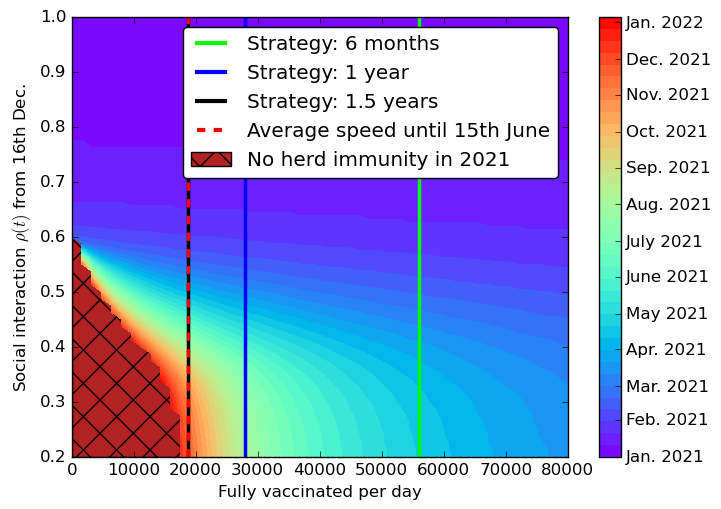

In [65]:
fig = plt.figure(figsize=(8, 5.5),facecolor="white")
ax = fig.add_subplot(111)

plt.contourf(X*N,Y, MyArray,40, cmap='rainbow')#cmap='RdGy')

#cbar=plt.colorbar()
#cbar.set_label('Time to Herd Immunity since Jan 1st', rotation=90)

cbar = plt.colorbar()
cbar.set_ticks([0,
                31,
                31+28,
                31+28+31,
                31+28+31+30,
                31+28+31+30+31,
                31+28+31+30+31+30,
                31+28+31+30+31+30+31,
                31+28+31+30+31+30+31+31,
                31+28+31+30+31+30+31+31+30,
                31+28+31+30+31+30+31+31+30+31,
                31+28+31+30+31+30+31+31+30+31+30,
                31+28+31+30+31+30+31+31+30+31+30+31
               ])

#cbar.set_xticklabels(['1st Jan. 2021', '1st Feb. 2021', '1st March 2021', '1st April 2021'])  # horizontal colorbar

cbar.set_ticklabels(['Jan. 2021', 
                     'Feb. 2021', 
                     'Mar. 2021', 
                     'Apr. 2021',
                     'May 2021', 
                     'June 2021', 
                     'July 2021',
                     'Aug. 2021', 
                     'Sep. 2021', 
                     'Oct. 2021',
                     'Nov. 2021', 
                     'Dec. 2021', 
                     'Jan. 2022'
                    ])

import matplotlib.patches as patches
xmin, xmax = ax.get_xlim()
ymin, ymax = ax.get_ylim()
xy = (xmin,ymin)
width = xmax - xmin
height = ymax - ymin
GrayBackground = patches.Rectangle(xy, width, height,color='firebrick',zorder=-10)
BlackHatches = patches.Rectangle(xy, width, height,hatch='x', fill=None, zorder=-9)
ax.add_patch(GrayBackground)
ax.add_patch(BlackHatches)

# artists, labels = cs.legend_elements()
My_patch = mpatches.Patch(hatch='x',facecolor='firebrick',)
from matplotlib.lines import Line2D
colors = ['lime', 'blue','k','red']
LineStyles = ['-','-','-','--']
lines = [Line2D([0], [0], color=colors[i], linewidth=3, linestyle=LineStyles[i]) for i in [0,1,2,3]]
lines.append(My_patch)
labels = ['Strategy: 6 months', 'Strategy: 1 year','Strategy: 1.5 years','Average speed until 15th June','No herd immunity in 2021']

#plt.title('When Herd Immunity is reached - Sweden')
                
plt.axvline(x=N/(365*0.5),label='Strategy: 6 months',color='lime',linewidth=2.5)
plt.axvline(x=N/365,label='Strategy: 1 year',color='blue',linewidth=2.5)
plt.axvline(x=N/(365*1.5),label='Strategy: 1.5 years',color='k',linewidth=2.5)
plt.axvline(x=N/(365*1.5),label='Average speed until 15 June',color='red',linewidth=2.5,linestyle='--')
plt.xlabel('Fully vaccinated per day')
plt.ylabel(r'Social interaction $\rho(t)$ from 16th Dec.')
                
plt.xlim(0,80000)
plt.yticks(np.arange(0.2,1.1,0.1))
plt.legend(lines, labels,fancybox=True)
#plt.legend()
plt.savefig('./Results_Sweden/HerdImmunityTIME_rho_tvac_Sweden' + FileFormatOfFigures)
plt.show()


In [ ]:
### Herd Immunity Threshold Estimated Computationally ###

In [98]:
rho1=1
rho2=1
rho3=1
rho4=1
rho5=1
rho6=1
rho7=1
rho8=1
rho9=1
rho10=1
rho11=1
rho12=1
rho13=1

ListOfRhos=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13]
ListOfRhos_ManualFit_1stWave=ListOfRhos

In [99]:
def rhoAsFunctionforSweden(time,ListOfRhos):
    
    rho0 = ListOfRhos[0]
    rho1 = ListOfRhos[1]
    rho2 = ListOfRhos[2]
    rho3 = ListOfRhos[3]
    rho4 = ListOfRhos[4]
    rho5 = ListOfRhos[5]
    rho6 = ListOfRhos[6]
    rho7 = ListOfRhos[7]
    rho8 = ListOfRhos[8]
    rho9 = ListOfRhos[9]
    rho10 = ListOfRhos[10]
    rho11 = ListOfRhos[11]
    rho12 = ListOfRhos[12]
    rho13 = ListOfRhos[13]

    ListOfRhosOUTPUT = []
    for t in time:
        if (t<24):
            rho=1
        elif (t>=24)and (t<30):
            rho=rho1
        elif (t>=30)and (t<40):
            rho=rho2
        elif (t>=40)and (t<43):
            rho=rho3
        elif (t>=43)and (t<46):  
            rho=rho4
        elif (t>=46)and(t<115):
            rho=rho5
        elif (t>=115) and (t<118):
            rho=rho6
        elif(t>=118) and (t<136):
            rho=rho7
        elif(t>=136)and (t<183):
            rho=rho8
        elif(t>=183) and (t<228):
            rho=rho9
        elif(t>=228) and (t<254):
            rho=rho10  
        elif(t>=254) and (t<261):
            rho=rho11
        elif(t>=261)and (t<274):
            rho=rho12  
        elif(t>=274)and(t<NumberDaysData):
            rho=rho13           
        elif t >= NumberDaysData:
            if len(ListOfRhos) < 15:
                rho=1
            elif len(ListOfRhos) >= 15:
                rho=ListOfRhos[14]
            
        ListOfRhosOUTPUT.append(rho)
        
#        elif t >= NumberDaysData:
#            if len(ListOfRhos) < 15:
#                rho=rho13
#            elif len(ListOfRhos) == 15:
#                rho=ListOfRhos[14]
#            elif len(ListOfRhos) > 15:
#                #for i in np.arange(0,len(ListOfRhos[15])-15,1):
#                rho=ListOfRhos[t-NumberDaysData+14]
#        ListOfRhosOUTPUT.append(rho)
        
    return np.array(ListOfRhosOUTPUT)



In [100]:
rho1=0.52
rho2=0.3
rho3=0.25
rho4=0.2
rho5=0.277
rho6=0.265 
rho7=0.28 
rho8=0.23
rho9=0.37 
rho10=0.395
rho11=0.41
rho12=0.375
rho13=0.345

ListOfRhos1=[1,rho1,rho2,rho3,rho4,rho5,rho6,rho7,rho8,rho9,rho10,rho11,rho12,rho13]
ListOfRhos_ManualFit_1stWave1=ListOfRhos1

In [101]:
P2=(1-1/N,1/N,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
t_max = 10000
dt = 0.001
t = np.linspace(0, t_max, int(t_max/dt) + 1)
resultsseir=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos1,ListOfParametersfirstwave))
resultsseir1=odeint(model_SEIRICUHOS,P2,t,(ListOfRhos,ListOfParametersfirstwave))

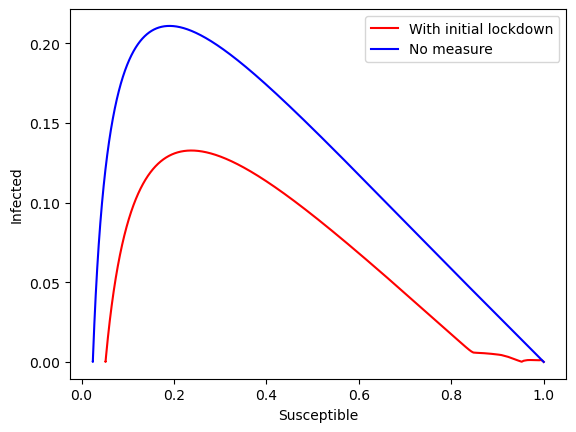

In [102]:
plt.figure(facecolor='white')
plt.plot(resultsseir[:,0], (resultsseir[:,3]+resultsseir[:,5]), color="red",label='With initial lockdown')
plt.plot(resultsseir1[:,0], (resultsseir1[:,3]+resultsseir1[:,5]), color="blue",label='No measure')


plt.xlabel("Susceptible")
plt.ylabel("Infected")  
plt.legend(loc='best')
#plt.title("Phase space")

In [103]:
print ("S max =", resultsseir[:,0][np.argmax(resultsseir[:,3]+resultsseir[:,5])])#maximum wavelength of emission, np.argmax(intensity373,axis=0)] is pulling the maximum value from the intensity array and then matching it to the corresponding wavelength in put to the calculation
print ("I max = ", np.amax(resultsseir[:,3]+resultsseir[:,5]))

S max = 0.23749948444379426
I max =  0.13265699546813042


In [104]:
print ("S max =", resultsseir1[:,0][np.argmax(resultsseir1[:,3]+resultsseir1[:,5])])#maximum wavelength of emission, np.argmax(intensity373,axis=0)] is pulling the maximum value from the intensity array and then matching it to the corresponding wavelength in put to the calculation
print ("I max = ", np.amax(resultsseir1[:,3]+resultsseir1[:,5]))

S max = 0.19039849373313705
I max =  0.21084123264377705


In [ ]:
list_of_tuples=list(zip(resultsseir1[:,0], (resultsseir1[:,3]+resultsseir1[:,5])))
df2=pd.DataFrame(list_of_tuples,columns=['S','I'])
df2.to_csv(r'dataframe_SISweden.csv', index = False)

In [ ]:
#plot herd immunity
plt.figure(figsize=(9, 6),facecolor="white")


    
#plt.plot(times[0:p],icu1,'-*',color='red',label='Data until '+str(MyListOfDates[len(SevenDaysMovingAverage_ICU)]),alpha=0.4,markersize=8)
#plt.plot(times[0:p-3],SevenDaysMovingAverage_ICU[0:-3],'-o',color='grey',label='7-Days Moving Average of Data')
##plt.plot(t,(resultsseirfit[:,9])*N, label="Simulation automated fit", linewidth=2,color='red')
#plt.plot(t,(resultsseir[:,9])*N, label="Simulation Manual Fit", linewidth=2,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,0])[0:NumberDaysData], label="Simulation Manual Fit for infected", linewidth=3,color='blue')
plt.plot(t[0:NumberDaysData],(resultsseir[:,2]+resultsseir[:,13])[0:NumberDaysData], label="Simulation Manual Fit for recovered", linewidth=3,color='blue')


plt.plot(t[NumberDaysData:-1],(resultsseir[:,0])[NumberDaysData:-1],'-.', label="Projection for infected", linewidth=3,color='green')
plt.plot(t[NumberDaysData:-1],(resultsseir[:,2]+resultsseir[:,13])[NumberDaysData:-1],':', label="Projection for recovered", linewidth=3,color='red')

UpperY2 = 1
#plt.xticks(times[only10thindex], MyListOfDates[only10thindex], rotation=90)
plt.xticks(times[only10thindex],'')
plt.yticks(np.arange(0,UpperY2+1,0.1),fontsize=18)

#plt.title("Sweden")

plt.legend(loc='upper left', fancybox=True, numpoints=1)
plt.grid(color='gray', linestyle=':', linewidth=1, alpha = 0.8)

#plt.xlabel("Time")
#plt.ylabel("People in ICU",size=12)

plt.xlim(0,endofplot)
plt.ylim(0,UpperY2)

plt.tight_layout()
plt.savefig('./Results_Sweden/herdimmunity2_SEIR-ICU_SWEDEN' + FileFormatOfFigures)

#plt.yticks(np.arange(0,4000+1,200))
#plt.ylim(0,3300)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t' + FileFormatOfFigures)

#plt.yticks(np.arange(0,1400+1,200))
#plt.ylim(0,1400)
#plt.legend(loc='upper left', fancybox=True, numpoints=1)
#plt.tight_layout()
#plt.savefig('./Results_Sweden/ICU_SEIR-ICU_SWEDEN_No_p2t_ZOOM' + FileFormatOfFigures)



In [ ]:
list_of_tuples=list(zip(df['date'],SevenDaysMovingAverage_TotalCases,SevenDaysMovingAverage_ICU,SevenDaysMovingAverage_Hos,SevenDaysMovingAverage_dead))
df2=pd.DataFrame(list_of_tuples,columns=['Date','Cases','ICU','Hospital','Dead'])
df2.to_csv(r'dataframe_moving_average.csv', index = False)

In [ ]:
data=np.vstack((df2['Cases'],df2['ICU']))
data2=np.vstack((df2['Hospital'],df2['Dead']))
data1=np.vstack((data,data2))